<a id='imports'></a>
# Imports

In [151]:
import datetime
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import sys
import seaborn as sns
sns.set_theme()
pd.options.mode.chained_assignment = None

import postprocessing_util
import postprocessing_plot_util
import simulation_config_utils

module_path = os.path.abspath(os.path.join('..', 'utils'))
if module_path not in sys.path:
    sys.path.append(module_path)

import aimsun_config_utils
import aimsun_folder_utils
import aimsun_input_utils
import metadata_settings

In [152]:
# Get time intervals of study.
TIME_INTERVALS = metadata_settings.get_time_intervals()
TIME_INTERVALS_STRING = [str(time)[:-3] for time in TIME_INTERVALS]

# RERUN THE FOLLOWING CELLS EVERY TIME

In [153]:
databases = {
    'fully_uncoordinated': {
        'desc': "Uncoordinated",
        'path': "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220914/uncoordinated.sqlite"
    },
    'fully_coordinated': {
        'desc': "Coordinated",
        'path': "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220914/coordinated.sqlite"
    },
    'mostly_coordinated': {
        'desc': "Mostly Coordinated",
        'path': "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220919/mission3uncoordinated.sqlite"
    },
    'attempted_improved': {
        'desc': "Attempted Improved Coordination",
        'path': "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220921/coordinated3improved.sqlite"
    },
    'fully_uncoordinated_200': {
        'desc': "Uncoordinated @ 200 Demand",
        'path': "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220926/uncoordinated_200demand.sqlite"
    },
    'fully_coordinated_200': {
        'desc': "Fully Coordinated @ 200 Demand",
        'path': "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220925/coordinated_200demand.sqlite"
    },
    'mostly_coordinated_200': {
        'desc': "Mostly Coordinated @ 200 Demand",
        'path': "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220925/coordinated_3_changed_200demand.sqlite"
    },
}

### Set which databases to use

In [154]:
uncoordinated_description = databases['fully_uncoordinated']['desc']                      # SET THIS!
uncoordinated_simulation_database_path = databases['fully_uncoordinated']['path']         # SET THIS!
uncoordinated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(uncoordinated_simulation_database_path)
uncoordinated_con = uncoordinated_simulation_results_database.database

coordinated_description = databases['fully_coordinated']['desc']                        # SET THIS!
coordinated_simulation_database_path = databases['fully_coordinated']['path']           # SET THIS!
coordinated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(coordinated_simulation_database_path)
coordinated_con = coordinated_simulation_results_database.database

In [155]:
from datetime import datetime
today = datetime.now().strftime("%Y-%m-%d")
image_path = f'C:/Users/prest/Preston/Berkeley/fremont_project/images/{today}/{uncoordinated_description} vs {coordinated_description}'

if not os.path.exists(image_path):
    os.makedirs(image_path)

In [156]:
with open(image_path + '/description.txt', 'w') as f:
    f.write(f'''
    {uncoordinated_description} data from: 
        {uncoordinated_simulation_database_path}
    {coordinated_description} data from: 
        {coordinated_simulation_database_path}
    ''')

In [157]:
class Column:
    def __init__(self, name, desc, unit):
        self.name = name
        self.desc = desc
        self.unit = unit

    def __repr__(self) -> str:
        return f'Column({str(self.name)}, {str(self.desc)}, {str(self.unit)})'

### Test runs + more setup

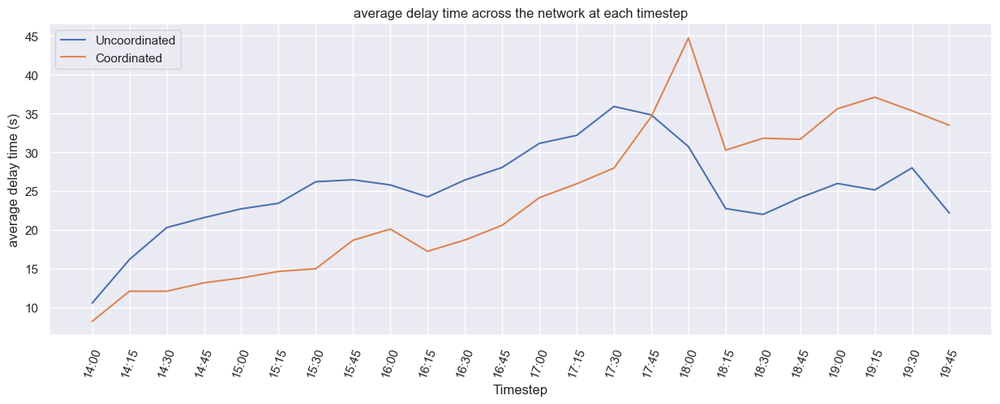

In [158]:
# Select metric to compute.
# Here it is an example of delay time.
metric_name, metric_units = 'average delay time', 's'
uncoordinated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

coordinated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    coordinated_simulation_results_database, TIME_INTERVALS)

fig = plt.figure(figsize=(15, 5))
plt.title(f"{metric_name} across the network at each timestep")
plt.xlabel("Timestep")
plt.ylabel(f"{metric_name} ({metric_units})")
plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label=uncoordinated_description)
plt.plot(TIME_INTERVALS_STRING, coordinated_simulated_metric_values, label=coordinated_description)
plt.legend(loc="upper left")
plt.xticks(rotation=70)
plt.show()

In [159]:
import geopandas as gpd

sections = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/sections.shp')
nodes = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/nodes.shp')
taz_int = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection/Data/Auxiliary/Demand/TAZ_old/Internal/Internal_TAZ.shp')
centroids = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/centroids.shp')

sections, nodes, taz_int, centroids = map(lambda x:x.to_crs('EPSG:3857'), [sections, nodes, taz_int, centroids])

sections

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry
0,242.0,242,None,1,104.0,2100.0,175.0,1,9845.0,9923.0,"LINESTRING (-13572344.019 4508460.315, -135723..."
1,243.0,243,None,4,104.0,8400.0,175.0,1,151597118.0,9848.0,"LINESTRING (-13572329.348 4508264.159, -135722..."
2,244.0,244,None,4,104.0,8400.0,175.0,1,9850.0,9852.0,"LINESTRING (-13572464.084 4508415.329, -135724..."
3,246.0,246,Geyser Court,1,40.0,600.0,179.0,5,9868.0,NaN,"LINESTRING (-13571458.486 4509669.510, -135714..."
4,247.0,247,Geyser Court,1,40.0,600.0,179.0,5,NaN,9868.0,"LINESTRING (-13571596.214 4509623.139, -135715..."
...,...,...,...,...,...,...,...,...,...,...,...
4428,151597396.0,28550,Fernald Common,1,40.0,600.0,179.0,5,42395.0,NaN,"LINESTRING (-13572473.917 4507663.732, -135724..."
4429,151600599.0,28581,Alice Court,1,40.0,600.0,179.0,5,39784.0,NaN,"LINESTRING (-13575454.502 4513910.059, -135754..."
4430,151616088.0,3425,None,2,104.0,2100.0,175.0,1,56586.0,151616089.0,"LINESTRING (-13574102.042 4511052.704, -135741..."
4431,151616494.0,56150,None,2,72.0,1800.0,177.0,3,56168.0,151616495.0,"LINESTRING (-13574438.360 4511038.633, -135744..."


In [160]:
nodes

,id,eid,name,nodetype,geometry
0,9845.0,9845,None,0.0,POINT (-13572349.670 4508461.025)
1,9848.0,9848,None,0.0,POINT (-13572263.070 4508190.059)
2,9850.0,9850,None,0.0,POINT (-13572465.454 4508416.802)
3,9852.0,9852,None,0.0,POINT (-13572419.374 4508365.715)
4,9854.0,9854,None,0.0,POINT (-13573710.462 4509848.237)
...,...,...,...,...,...
1493,151632543.0,None,None,0.0,POINT (-13572777.952 4508000.630)
1494,151632545.0,None,None,1.0,POINT (-13575018.842 4514942.158)
1495,151632565.0,None,None,1.0,POINT (-13571911.812 4508088.800)
1496,151632572.0,None,None,1.0,POINT (-13572676.222 4509954.728)


In [161]:
taz_int

,label,CentroidID,geometry
0,1,int_1,"POLYGON ((-13574693.310 4511182.575, -13574685..."
1,2,int_2,"POLYGON ((-13575263.903 4515899.194, -13575241..."
2,3,int_3,"POLYGON ((-13571924.319 4514045.983, -13571924..."
3,4,int_4,"POLYGON ((-13574417.875 4514354.829, -13574417..."
4,5,int_5,"POLYGON ((-13572503.180 4509723.099, -13572503..."
...,...,...,...
67,79,int_79,"POLYGON ((-13574195.236 4515000.626, -13574195..."
68,81,int_81,"POLYGON ((-13574640.402 4510873.822, -13574640..."
69,82,int_82,"POLYGON ((-13571701.680 4509695.175, -13571701..."
70,84,int_84,"POLYGON ((-13572547.708 4513709.071, -13572569..."


In [162]:
centroids

,id,eid,name,type,percentage,geometry
0,151630699.0,int_0,int_0,from_to,nothing,POINT (-13573642.679 4512924.678)
1,151630724.0,int_1,int_1,from_to,nothing,POINT (-13575676.027 4515411.360)
2,151630733.0,int_2,int_2,from_to,nothing,POINT (-13571804.021 4510567.669)
3,151630752.0,int_3,int_3,from_to,nothing,POINT (-13571083.898 4513667.978)
4,151630839.0,int_4,int_4,from_to,nothing,POINT (-13574729.704 4513825.353)
...,...,...,...,...,...,...
81,151632055.0,ext_6,ext_6,from_to,nothing,POINT (-13575185.233 4510750.740)
82,151632058.0,ext_7,ext_7,from_to,nothing,POINT (-13576142.758 4514816.830)
83,151632061.0,ext_8,ext_8,from_to,nothing,POINT (-13574944.926 4516561.766)
84,151632064.0,ext_9,ext_9,from_to,nothing,POINT (-13571943.471 4516065.038)


In [163]:
signalized_nodes = {
    'city-controlled': {
        '27399': ['Washington Boulevard', 'Paseo Padre Parkway'],
        '27553': ['Paseo Parde Parkway', 'Durham Road'],
        '13225': ['Mission Boulevard', 'Washington Boulevard'],
        '27847': ['Mission Boulevard', 'Anza Street'],
        '27869': ['Mission Boulevard', 'Pine Lane'],
        '27889': ['Mission Boulevard', 'Hunter Lane'],
        '27921': ['Mission Boulevard', 'Cougar Drive'],
        '27938': ['Mission Boulevard', 'South Grimmer Boulevard'],
        '27954': ['Mission Boulevard', 'Stanford Ave'],
        '16827': ['Mission Boulevard', 'Paseo Parde Parkway'],
        '56391': ['Washington Boulevard', 'Osgood Road - Driscoll Road'],
        '56129': ['Washington Boulevard', 'Meredith Drive'],
        '56324': ['Paseo Padre Parkway', 'Gomes Road'],
        '56297': ['Paseo Padre Parkway', 'Driscoll Road'],
        '56270': ['Paseo Padre Parkway', 'Chadbourne Drive'],
        '62356': ['Osgood Road', 'Blacow Road'],
        '56418': ['Auto Mall Parkway', 'Osgood Road'],
        '56471': ['Warm Springs Boulevard - Osgood Road', 'S. Grimmer'],
        '45371': ['Warm Springs Boulevard', 'Mission Ct'],
        '56438': ['Warm Springs Boulevard', 'East Warren Avenue'],
        '62346': ['Osgood Road', 'Walmart Driveway'],
        '53579': ['Warm Springs Boulevard', 'Fulton Place'],
        '38460': ['Warm Springs Boulevard', 'Warm Springs Bart'],
        '45004': ['Warm Springs Boulevard', 'Transit Way'],
        '56244': ['Driscoll Road', 'Amapola Drive'],
        '56484': ['East Warren Avenue', 'Fernald Street']
    },
    'state-controlled': {
        '42160': ['Mission Boulevard', 'Esparito Avenue - Ondina Drive'],
        '56218': ['Mission Boulevard', 'Driscoll Road'],
        '27479': ['Mission Boulevard', 'Palm Ave'],
        '56451': ['Mission Boulevard', 'Warm Springs Boulevard'],
        '62795': ['Mission Boulevard', 'Mohave Drive'],
        '27796': ['Mission Boulevard', 'I-680 Southbound Ramp'],
        '27816': ['Mission Boulevard', 'I-680 Northbound Ramp - Mission Road'],
        '27327': ['Washington Boulevard', 'I-680 Southbound Ramp'],
        '27345': ['Washington Boulevard', 'I-680 Nouthbound Ramp - Luzon Drive'],
        '56173': ['Durham Road', 'I-680 Southbound Ramp'],
        '27711': ['Durham Road', 'I-680 Northbound Ramp'],
    }
}

In [164]:
node_geo_city = nodes[nodes['eid'].isin(signalized_nodes['city-controlled'].keys())]
node_geo_state = nodes[nodes['eid'].isin(signalized_nodes['state-controlled'].keys())]

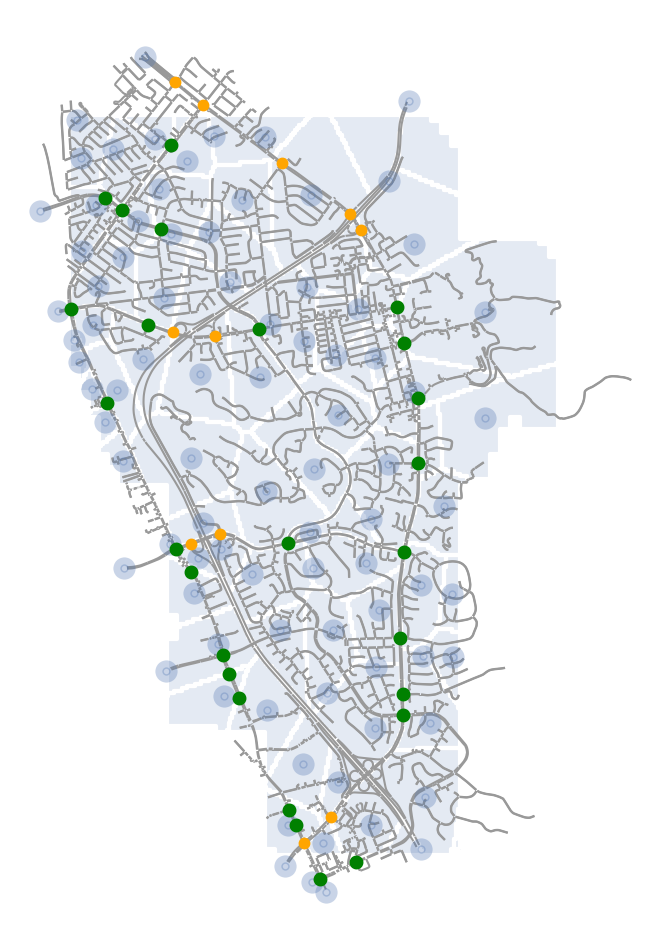

In [165]:
from matplotlib_scalebar.scalebar import ScaleBar
fig, ax = plt.subplots(1, 1, figsize=(10, 12))

# comment the following section to toggle tilemapbase
# import tilemapbase
# tilemapbase.start_logging()
# tilemapbase.init(create=True)
# extent = tilemapbase.extent_from_frame(sections, buffer=25)
# plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=400)
# plotter.plot(ax)

taz_int.plot(ax=ax, alpha=0.15, zorder=1)
taz_int.boundary.plot(ax=ax, lw=3, color='white', zorder=2)
sections.plot(ax=ax, color='0.6', zorder=3)
centroids.plot(ax=ax, lw=10, alpha=0.3, zorder=4)
node_geo_city.plot(ax=ax, lw=4, color='green', zorder=5)
node_geo_state.plot(ax=ax, lw=2.5, color='orange', zorder=5)
ax.axis('off')

plt.savefig('C:/Users/prest/Preston/Berkeley/fremont_project/images/signalized_nodes',
    bbox_inches='tight', pad_inches=0)

plt.show()

In [166]:
print(uncoordinated_description + ' vs ' + coordinated_description)

Uncoordinated vs Coordinated


### RUN ABOVE THIS CELL

In [ ]:
### Run above this cell

<a id='system'></a>
# System Data

In [ ]:
import pandas as pd

uncoordinated_sys_query = pd.read_sql('SELECT * FROM MISYS', uncoordinated_con)
uncoordinated_sys_df = pd.DataFrame(uncoordinated_sys_query)

uncoordinated_sys_df.head()

In [ ]:
coordinated_sys_query = pd.read_sql('SELECT * FROM MISYS', coordinated_con)
coordinated_sys_df = pd.DataFrame(coordinated_sys_query)

coordinated_sys_df.head()

In [ ]:
uncoordinated_sys_df.columns

In [ ]:
sys_columns = {
    'sid': Column('sid', 'Vehicle type', None),
    'ent': Column('ent', 'Time interval', None),
    'density': Column('density', 'Density', 'veh/km'),
    'flow': Column('flow', 'Mean flow', 'veh/h'),
    'ttime': Column('ttime', 'Mean travel time', 's/km'),
    'dtime': Column('dtime', 'Mean delay time', 's/km'),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'qmean': Column('qmean', 'Mean vehicles in queue', 'veh'),
    'fuelc': Column('fuelc', 'Total fuel consumed', 'L'),
    'batteryc': Column('batteryc', 'Total battery consumed', 'kWh'),          # pending simulation run
    'travel': Column('travel', 'Total distance traveled by exited vehicles', 'km')
}

sys_column_names = sys_columns.keys()
group_columns = ['sid', 'ent']

uncoordinated_sys_df = uncoordinated_sys_df[sys_column_names]
coordinated_sys_df = coordinated_sys_df[sys_column_names]

sys_df = uncoordinated_sys_df.merge(coordinated_sys_df, on=group_columns, suffixes=['_uncoordinated', '_coordinated'])
sys_df = sys_df[(sys_df['sid']==0) & (sys_df['ent']!=0)].drop('sid', axis=1)
sys_df

See [sys-hcm graphs](#patched-syshcm-graphs)

In [ ]:
# sys_columns = np.reshape(list(sys_columns.values())[2:], (4, 2))
# sys_columns
# fig, axs = plt.subplots(4, 2, figsize=(20, 25))
# fig.suptitle('System-wide metrics over time')
# print(sys_columns)
# for i in range(4):
#     for j in range(2):
#         ax, metric = axs[i][j], sys_columns[i][j]
#         ax.plot(TIME_INTERVALS_STRING, sys_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
#         ax.plot(TIME_INTERVALS_STRING, sys_df[f'{metric.name}_coordinated'], label=coordinated_description)
#         ax.set_title(f'{metric.desc} across the network over time')
#         ax.set_xlabel('Time')
#         ax.set_ylabel(f'{metric.name} ({metric.unit})')
#         ax.legend(loc="upper left")
#         ax.tick_params('x', labelrotation=70) 

# plt.subplots_adjust(wspace=0.3, hspace=0.5)
# plt.show()

<a id='section'></a>
# Section Data

In [25]:
import pandas as pd

uncoordinated_section_query = pd.read_sql('SELECT * FROM MISECT', uncoordinated_con)
uncoordinated_section_df = pd.DataFrame(uncoordinated_section_query)

uncoordinated_section_df.head()

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1376.0,-1.0,344.0,-1.0,1388.0,...,0.0,-1.0,0.14186,1.154377,0.017442,-1.0,3.668785,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1308.0,-1.0,327.0,-1.0,1316.0,...,5.0,-1.0,0.00000,0.000000,0.000000,-1.0,1.422879,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1332.0,-1.0,333.0,-1.0,1336.0,...,6.0,-1.0,0.00000,0.000000,0.000000,-1.0,1.011380,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.0,-1.0,0.0,-1.0,0.0,...,0.0,-1.0,-1.00000,-1.000000,-1.000000,-1.0,-1.000000,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.0,-1.0,2.0,-1.0,8.0,...,0.0,-1.0,0.00000,0.000000,0.000000,-1.0,0.011740,-1.0,0.0,-1.0


In [26]:
coordinated_section_query = pd.read_sql('SELECT * FROM MISECT', coordinated_con)
coordinated_section_df = pd.DataFrame(coordinated_section_query)

coordinated_section_df.head()

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1356.0,-1.0,339.0,-1.0,1372.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,3.369716,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1256.0,-1.0,314.0,-1.0,1268.0,...,4.0,-1.0,0.0,0.0,0.0,-1.0,1.350335,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1280.0,-1.0,320.0,-1.0,1284.0,...,4.0,-1.0,0.0,0.0,0.0,-1.0,0.955045,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.0,-1.0,0.0,-1.0,0.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.000000,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.0,-1.0,2.0,-1.0,8.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,0.011503,-1.0,0.0,-1.0


In [27]:
dfs_section = {'uncoordinated': uncoordinated_section_df, 'coordinated': coordinated_section_df}
null_values = {'eid': None, 'ent': None, 'flow': 0, 'ttime': -1, 'dtime': -1, 'speed': -1, 'density': 0}  # 'qmean': None, 
group_cols = ['ent', 'eid']

def preprocess_sections(df):
    df = df.filter(items=null_values.keys()).dropna(axis=0)
    for k, v in null_values.items():
        df = df[df[k]!=v]
    return df.groupby(group_cols).mean()

In [28]:
for k in dfs_section:
    dfs_section[k] = preprocess_sections(dfs_section[k])

dfs_section['uncoordinated']

flow      ttime     dtime      speed   density
ent eid                                                      
0   1006   7.444444  12.763566  0.743011  43.098619  0.173434
    1007   1.666667   9.521830  0.464328  42.285374  0.039649
    1008   7.555556  13.515842  1.060115  42.241177  0.182118
    1009   5.777778   9.316341  0.744148  42.449772  0.136320
    1016   0.333333  19.310881  5.372306  29.262586  0.011428
...             ...        ...       ...        ...       ...
24  990   24.000000   3.605744  0.188269  42.220480  0.534835
    991    8.000000   2.092352  0.000000  44.407126  0.180632
    992    8.000000   1.683269  0.000000  44.407113  0.180632
    993    8.000000   2.326868  0.000000  44.406982  0.135871
    997    8.000000   3.955889  0.000000  42.930384  0.186646

[70485 rows x 5 columns]

In [29]:
dfs_section['coordinated']

flow      ttime     dtime      speed   density
ent eid                                                      
0   1006   7.333333  12.913697  0.746771  42.602214  0.173581
    1007   1.444444   9.455693  0.496097  42.630965  0.034164
    1008   7.333333  13.616747  1.047789  41.919752  0.176515
    1009   5.666667   9.425930  0.703384  41.969505  0.136270
    1017   0.500000  29.516580  0.000000  39.965519  0.012569
...             ...        ...       ...        ...       ...
24  990   48.000000   3.621700  0.126415  42.070982  1.141412
    991   44.000000   2.369269  0.277421  40.009497  1.124960
    992   36.000000   1.732270  0.018679  43.147593  0.836507
    993   36.000000   2.497865  0.129089  41.432309  0.872582
    997   16.000000   4.315968  0.000000  39.409829  0.407270

[67310 rows x 5 columns]

In [30]:
section_df = dfs_section['uncoordinated'].join(dfs_section['coordinated'], 
    on=group_cols, lsuffix='_uncoordinated', rsuffix='_coordinated').dropna()

section_df

flow_uncoordinated  ttime_uncoordinated  dtime_uncoordinated  \
ent eid                                                                  
0   1006            7.444444            12.763566             0.743011   
    1007            1.666667             9.521830             0.464328   
    1008            7.555556            13.515842             1.060115   
    1009            5.777778             9.316341             0.744148   
    1017            0.833333            27.130564             0.000000   
...                      ...                  ...                  ...   
24  990            24.000000             3.605744             0.188269   
    991             8.000000             2.092352             0.000000   
    992             8.000000             1.683269             0.000000   
    993             8.000000             2.326868             0.000000   
    997             8.000000             3.955889             0.000000   

          speed_uncoordinated  density_uncoordinated  flow_coordinated  \
ent eid                                                                  
0   1006            43.098619               0.173434          7.333333   
    1007            42.285374               0.039649          1.444444   
    1008            42.241177               0.182118          7.333333   
    1009            42.449772               0.136320          5.666667   
    1017            43.612693               0.019254          0.500000   
...                       ...                    ...               ...   
24  990             42.220480               0.534835         48.000000   
    991             44.407126               0.180632         44.000000   
    992             44.407113               0.180632         36.000000   
    993             44.406982               0.135871         36.000000   
    997             42.930384               0.186646         16.000000   

          ttime_coordinated  dtime_coordinated  speed_coordinated  \
ent eid                                                             
0   1006          12.913697           0.746771          42.602214   
    1007           9.455693           0.496097          42.630965   
    1008          13.616747           1.047789          41.919752   
    1009           9.425930           0.703384          41.969505   
    1017          29.516580           0.000000          39.965519   
...                     ...                ...                ...   
24  990            3.621700           0.126415          42.070982   
    991            2.369269           0.277421          40.009497   
    992            1.732270           0.018679          43.147593   
    993            2.497865           0.129089          41.432309   
    997            4.315968           0.000000          39.409829   

          density_coordinated  
ent eid                        
0   1006             0.173581  
    1007             0.034164  
    1008             0.176515  
    1009             0.136270  
    1017             0.012569  
...                       ...  
24  990              1.141412  
    991              1.124960  
    992              0.836507  
    993              0.872582  
    997              0.407270  

[63209 rows x 10 columns]

In [31]:
section_cols = {
    'flow': Column('flow', 'Mean flow', 'veh/h'),
    'ttime': Column('ttime', 'Mean travel time', 's'),
    'dtime': Column('dtime', 'Mean delay time', 's'),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'density': Column('density', 'Density by lane', 'veh/km')
}

In [32]:
section_df = section_df.groupby('eid').mean()
section_df

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated
eid,,,,,,,,,,
1006,10.918129,12.777386,0.768128,43.076500,0.253695,8.877193,12.721376,0.799360,43.195319,0.210277
1007,4.277778,9.522637,0.462443,42.412658,0.101805,3.796296,9.221418,0.497426,43.684754,0.087657
1008,10.643275,13.414547,1.051175,42.561525,0.258171,7.824561,13.357483,1.046517,42.678926,0.186142
1009,9.124183,9.363560,0.712722,42.255215,0.213654,6.607843,9.252075,0.706334,42.685291,0.157106
1017,2.944444,26.497878,0.000000,44.616364,0.065877,2.833333,28.555442,0.000000,41.206966,0.067948
...,...,...,...,...,...,...,...,...,...,...
992,45.200000,1.806607,0.091981,41.802410,1.101787,41.810000,1.793214,0.091908,42.064008,1.004986
993,45.200000,2.459999,0.091105,42.251454,1.085162,41.810000,2.467179,0.115391,42.060854,1.001721
994,2.333333,2.949151,0.521877,35.486994,0.066007,2.500000,2.764014,0.600827,37.895486,0.066169


In [33]:
for col in section_cols:
    section_df[f'{col}_ratio'] = section_df[f'{col}_coordinated'] / section_df[f'{col}_uncoordinated']

section_df

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio
eid,,,,,,,,,,,,,,,
1006,10.918129,12.777386,0.768128,43.076500,0.253695,8.877193,12.721376,0.799360,43.195319,0.210277,0.813069,0.995617,1.040660,1.002758,0.828858
1007,4.277778,9.522637,0.462443,42.412658,0.101805,3.796296,9.221418,0.497426,43.684754,0.087657,0.887446,0.968368,1.075649,1.029993,0.861025
1008,10.643275,13.414547,1.051175,42.561525,0.258171,7.824561,13.357483,1.046517,42.678926,0.186142,0.735165,0.995746,0.995569,1.002758,0.721006
1009,9.124183,9.363560,0.712722,42.255215,0.213654,6.607843,9.252075,0.706334,42.685291,0.157106,0.724212,0.988094,0.991037,1.010178,0.735332
1017,2.944444,26.497878,0.000000,44.616364,0.065877,2.833333,28.555442,0.000000,41.206966,0.067948,0.962264,1.077650,NaN,0.923584,1.031441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,45.200000,1.806607,0.091981,41.802410,1.101787,41.810000,1.793214,0.091908,42.064008,1.004986,0.925000,0.992587,0.999208,1.006258,0.912142
993,45.200000,2.459999,0.091105,42.251454,1.085162,41.810000,2.467179,0.115391,42.060854,1.001721,0.925000,1.002919,1.266575,0.995489,0.923108
994,2.333333,2.949151,0.521877,35.486994,0.066007,2.500000,2.764014,0.600827,37.895486,0.066169,1.071429,0.937224,1.151282,1.067870,1.002458


In [34]:
section_df = section_df.merge(sections[['eid', 'func_class', 'geometry']], left_index=True, right_on='eid').set_index('eid')
section_df = gpd.GeoDataFrame(section_df, geometry='geometry')
frame = section_df.to_crs("EPSG:3857")
frame

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,func_class,geometry
eid,,,,,,,,,,,,,,,,,
1006,10.918129,12.777386,0.768128,43.076500,0.253695,8.877193,12.721376,0.799360,43.195319,0.210277,0.813069,0.995617,1.040660,1.002758,0.828858,5,"LINESTRING (-13572729.375 4511855.337, -135727..."
1007,4.277778,9.522637,0.462443,42.412658,0.101805,3.796296,9.221418,0.497426,43.684754,0.087657,0.887446,0.968368,1.075649,1.029993,0.861025,5,"LINESTRING (-13572788.740 4511703.374, -135728..."
1008,10.643275,13.414547,1.051175,42.561525,0.258171,7.824561,13.357483,1.046517,42.678926,0.186142,0.735165,0.995746,0.995569,1.002758,0.721006,5,"LINESTRING (-13572773.768 4511698.341, -135727..."
1009,9.124183,9.363560,0.712722,42.255215,0.213654,6.607843,9.252075,0.706334,42.685291,0.157106,0.724212,0.988094,0.991037,1.010178,0.735332,5,"LINESTRING (-13572921.125 4511676.124, -135728..."
1017,2.944444,26.497878,0.000000,44.616364,0.065877,2.833333,28.555442,0.000000,41.206966,0.067948,0.962264,1.077650,NaN,0.923584,1.031441,5,"LINESTRING (-13573741.837 4512051.852, -135737..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
990,50.208889,3.590832,0.115746,42.531322,1.196708,47.408889,3.616694,0.152433,42.290265,1.140022,0.944233,1.007202,1.316957,0.994332,0.952631,5,"LINESTRING (-13573596.964 4515066.055, -135735..."
991,39.582222,2.250570,0.117781,41.960428,0.978511,35.004444,2.345357,0.223236,40.633851,0.877525,0.884348,1.042117,1.895349,0.968385,0.896796,5,"LINESTRING (-13573624.595 4515027.159, -135736..."
992,45.200000,1.806607,0.091981,41.802410,1.101787,41.810000,1.793214,0.091908,42.064008,1.004986,0.925000,0.992587,0.999208,1.006258,0.912142,5,"LINESTRING (-13573648.312 4514993.336, -135736..."


In [35]:
frame['log_flow_uncoordinated'] = np.log(frame['flow_uncoordinated'])
frame['log_flow_coordinated'] = np.log(frame['flow_coordinated'])

log_flow = Column('log_flow', 'Logarithm of mean flow', 'veh/h')

In [36]:
frame['log_flow_uncoordinated'].head()

eid
1006    2.390425
1007    1.453434
1008    2.364928
1009    2.210928
1017    1.079920
Name: log_flow_uncoordinated, dtype: float64

In [37]:
frame['log_flow_coordinated'].head()

eid
1006    2.183485
1007    1.334026
1008    2.057268
1009    1.888257
1017    1.041454
Name: log_flow_coordinated, dtype: float64

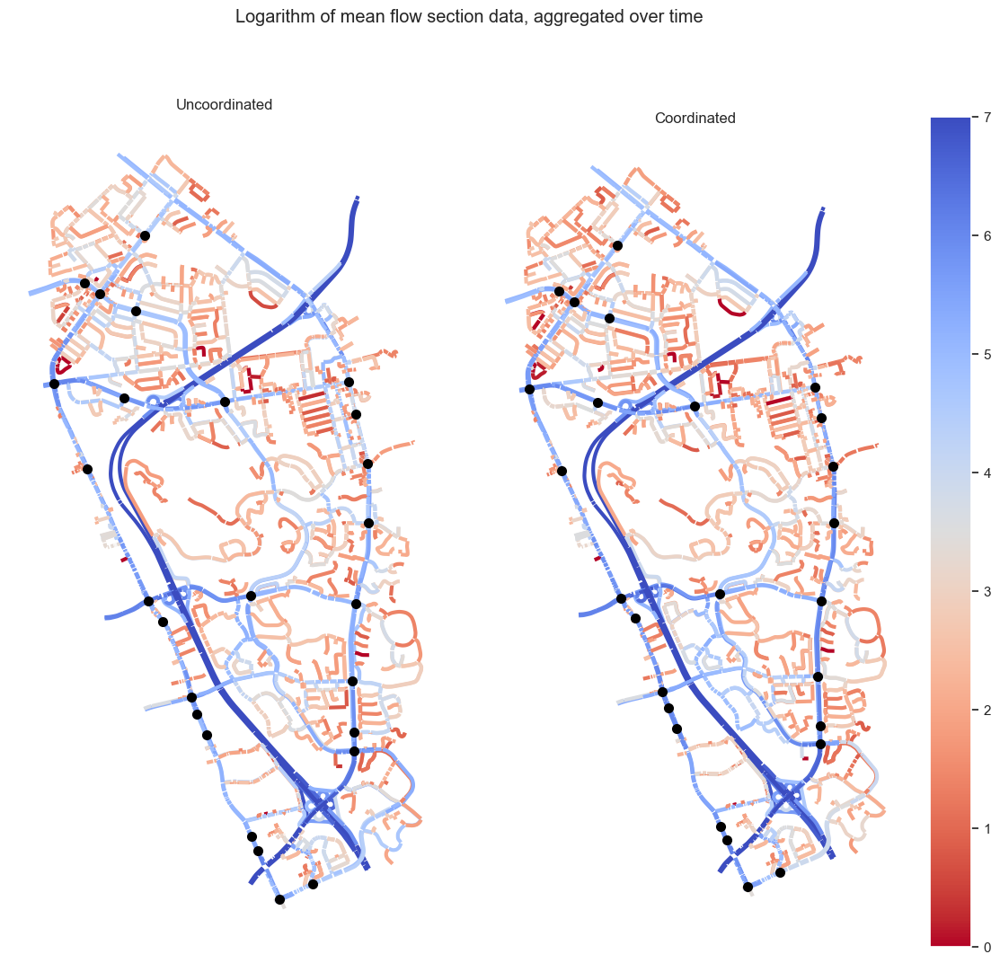

In [38]:
# ax = frame.plot(figsize=(15,15), column=f'{col.name}_ratio', legend=True, cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
# node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
# plt.axis('off')
# plt.title(f'Relative (coordinated/uncoordinated) {col.desc} ratio by section, aggregated over time')
# plt.show()

# fig, axs = plt.subplots(1, 5, figsize=(30, 9))

def section_plot(metric, min_val, max_val):
    fig, axs = plt.subplots(1, 2, figsize=(15, 12))
    fig.suptitle(f'{metric.desc} section data, aggregated over time')
    for i in range(2):
        ax, type = axs[i], ['uncoordinated', 'coordinated'][i]
        frame.plot(ax=ax, column=f'{metric.name}_{type}', legend=(i==1), cmap='coolwarm_r', lw=3, vmin=min_val, vmax=max_val, zorder=0)
        node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        ax.set_title([uncoordinated_description, coordinated_description][i])
        ax.axis('off')

    plt.subplots_adjust(wspace=0)
    plt.show()

section_plot(log_flow, 0, 7)

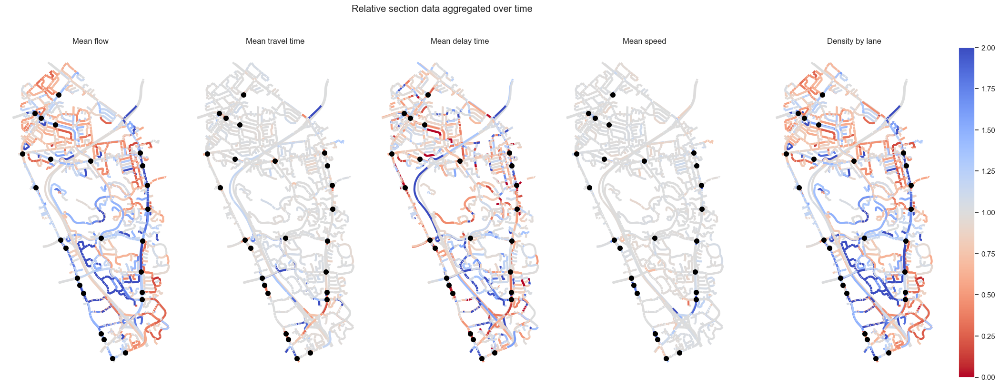

In [39]:
fig, axs = plt.subplots(1, 5, figsize=(30, 9))
fig.suptitle('Relative section data aggregated over time')
for i in range(5):
    ax, metric = axs[i], list(section_cols.values())[i]
    frame.plot(ax=ax, column=f'{metric.name}_ratio', legend=(i==4), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
    node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
    ax.set_title(metric.desc)
    ax.axis('off')

plt.subplots_adjust(wspace=-0.5)
plt.savefig(f'{image_path}/sections.png',
    bbox_inches='tight', pad_inches=0)
plt.show()

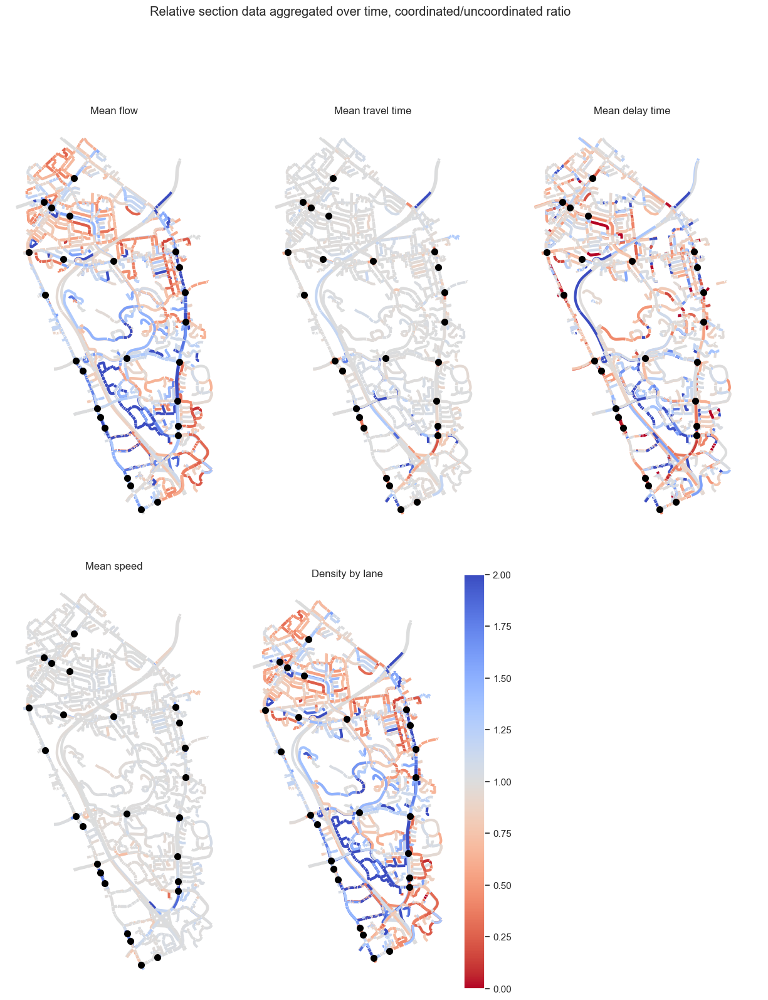

In [40]:
fig, axs = plt.subplots(2, 3, figsize=(16, 18))
fig.suptitle('Relative section data aggregated over time, coordinated/uncoordinated ratio')
for i in range(6):
    ax = axs[i//3][i%3]
    ax.axis('off')
    if i<5:
        metric = list(section_cols.values())[i]
        frame.plot(ax=ax, column=f'{metric.name}_ratio', legend=(i==4), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
        node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        ax.set_title(metric.desc)

plt.subplots_adjust(wspace=0, hspace=0.1)
plt.show()

In [41]:
section_cols

{'flow': Column(flow, Mean flow, veh/h),
 'ttime': Column(ttime, Mean travel time, s),
 'dtime': Column(dtime, Mean delay time, s),
 'speed': Column(speed, Mean speed, km/h),
 'density': Column(density, Density by lane, veh/km)}

In [42]:
frame.head()

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,func_class,geometry,log_flow_uncoordinated,log_flow_coordinated
eid,,,,,,,,,,,,,,,,,,,
1006,10.918129,12.777386,0.768128,43.076500,0.253695,8.877193,12.721376,0.799360,43.195319,0.210277,0.813069,0.995617,1.040660,1.002758,0.828858,5,"LINESTRING (-13572729.375 4511855.337, -135727...",2.390425,2.183485
1007,4.277778,9.522637,0.462443,42.412658,0.101805,3.796296,9.221418,0.497426,43.684754,0.087657,0.887446,0.968368,1.075649,1.029993,0.861025,5,"LINESTRING (-13572788.740 4511703.374, -135728...",1.453434,1.334026
1008,10.643275,13.414547,1.051175,42.561525,0.258171,7.824561,13.357483,1.046517,42.678926,0.186142,0.735165,0.995746,0.995569,1.002758,0.721006,5,"LINESTRING (-13572773.768 4511698.341, -135727...",2.364928,2.057268
1009,9.124183,9.363560,0.712722,42.255215,0.213654,6.607843,9.252075,0.706334,42.685291,0.157106,0.724212,0.988094,0.991037,1.010178,0.735332,5,"LINESTRING (-13572921.125 4511676.124, -135728...",2.210928,1.888257
1017,2.944444,26.497878,0.000000,44.616364,0.065877,2.833333,28.555442,0.000000,41.206966,0.067948,0.962264,1.077650,NaN,0.923584,1.031441,5,"LINESTRING (-13573741.837 4512051.852, -135737...",1.079920,1.041454


In [43]:
image_path

'C:/Users/prest/Preston/Berkeley/fremont_project/images/2022-09-28/Uncoordinated vs Coordinated'

### Functional class

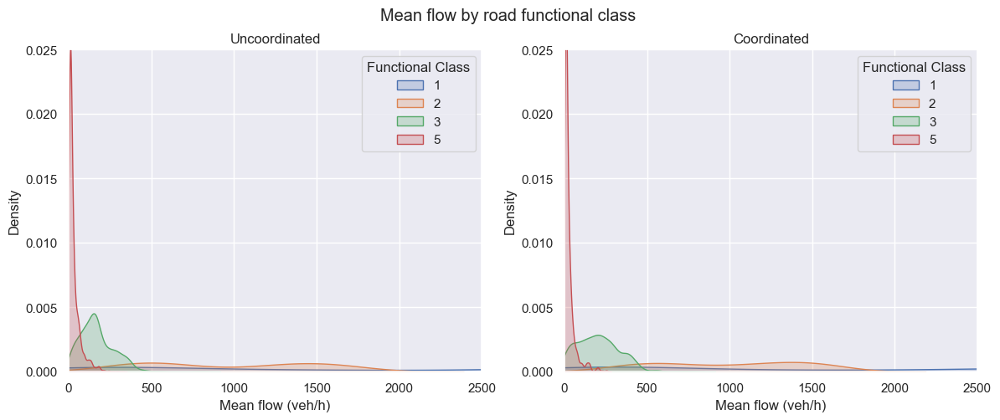

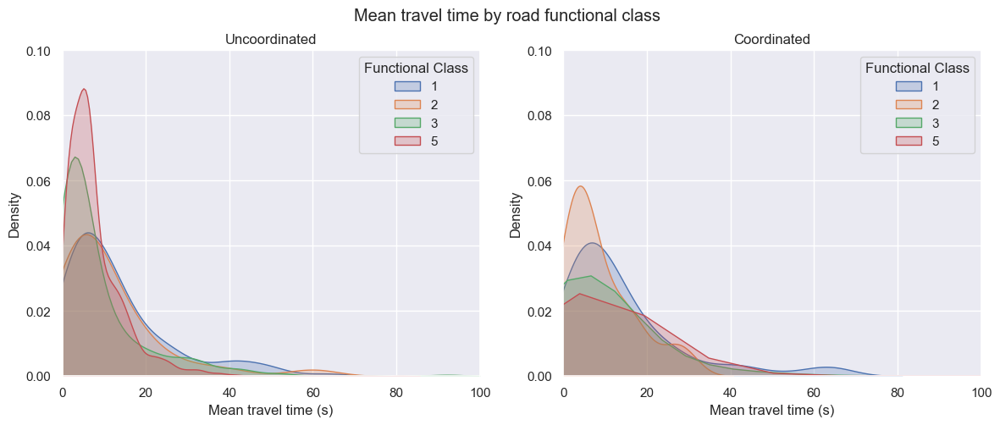

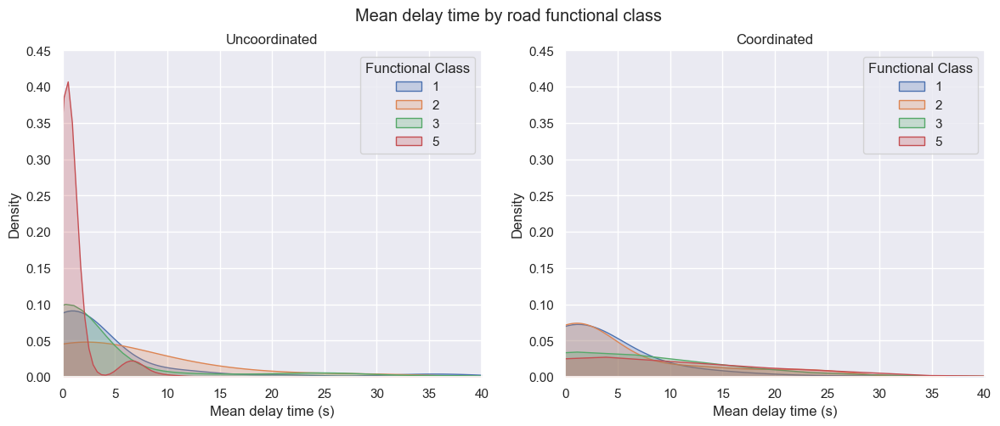

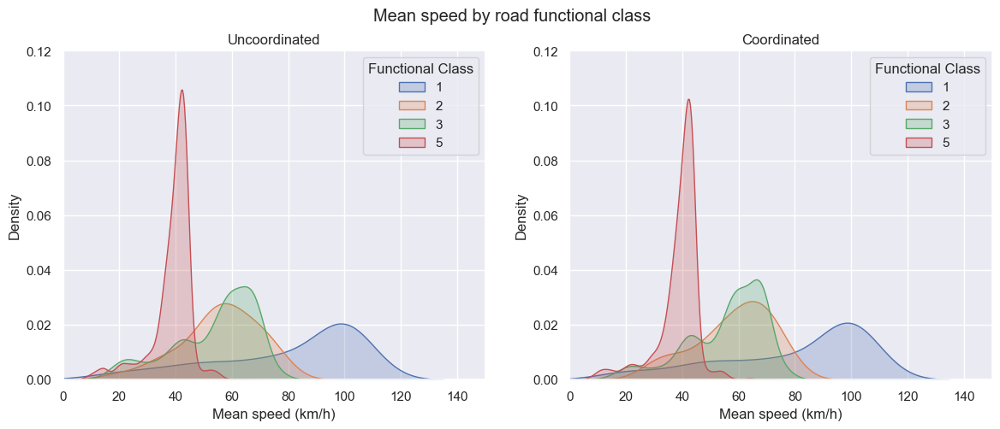

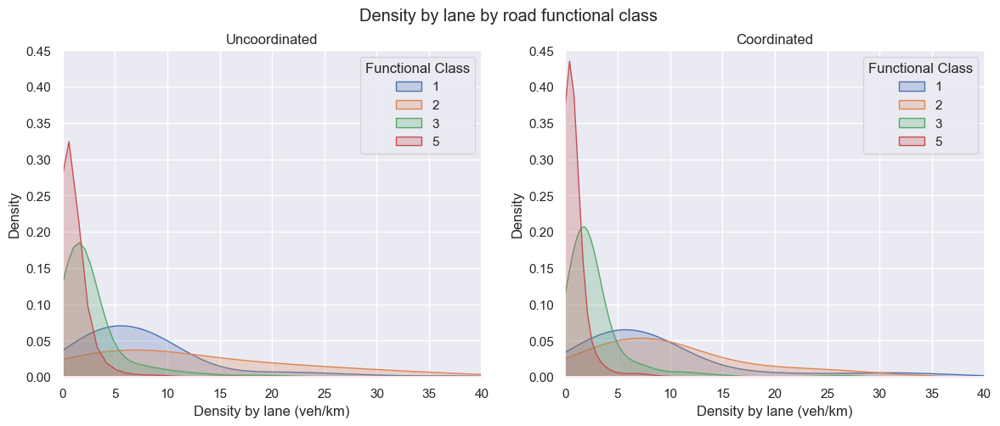

In [44]:
func_classes = [1, 2, 3, 5]
clip_at = {
    'flow': {'x': (0, 2500), 'y': (0, 0.025)},
    'ttime': {'x': (0, 100), 'y': (0, 0.1)},
    'dtime': {'x': (0, 40), 'y': (0, 0.45)},
    'speed': {'x': (0, 150), 'y': (0, 0.12)},
    'density': {'x': (0, 40), 'y': (0, 0.45)},
}

for k in section_cols:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(section_cols[k].desc + ' by road functional class')
    # ax1.set_yscale('log')
    # ax2.set_yscale('log')
    ax1.set_title(uncoordinated_description)
    ax2.set_title(coordinated_description)

    for func_class in func_classes:
        subset = frame[frame['func_class'] == func_class].reset_index()
        sns.kdeplot(subset[k+'_uncoordinated'], shade=True, label=func_class, ax=ax1)
        sns.kdeplot(subset[k+'_coordinated'], shade=True, label=func_class, ax=ax2)
    
    for ax in (ax1, ax2):
        ax.legend(title='Functional Class')
        ax.set_xlabel(f'{section_cols[k].desc} ({section_cols[k].unit})')
        ax.set_ylabel('Density')
        ax.set_xlim(clip_at[k]['x'])
        ax.set_ylim(clip_at[k]['y'])
    
    plt.savefig(f'{image_path}/functional-class-{k}.png',
        bbox_inches='tight', pad_inches=0)
    plt.show()

### Congested link plots

This takes forever to run

In [134]:
unpacked_databases = {}

for name, database in databases.items():
    desc, path = database['desc'], database['path']
    data = postprocessing_util.AimsunMicroOutputDatabase(path).database
    data = pd.read_sql('SELECT * FROM MISECT', data)
    data = pd.DataFrame(data)
    unpacked_databases[name] = {
        'desc': desc,
        'database': data
    }
    print('Processed ' + desc)

unpacked_databases

Processed Uncoordinated
Processed Coordinated
Processed Mostly Coordinated
Processed Attempted Improved Coordination
Processed Uncoordinated @ 200 Demand
Processed Fully Coordinated @ 200 Demand
Processed Mostly Coordinated @ 200 Demand


{'fully_uncoordinated': {'desc': 'Uncoordinated',
  'database':               did        oid    eid  sid  ent         flow  flow_D    count  \
  0       151642198        242    242    0    1  1376.000000    -1.0    344.0   
  1       151642198        243    243    0    1  1308.000000    -1.0    327.0   
  2       151642198        244    244    0    1  1332.000000    -1.0    333.0   
  3       151642198        246    246    0    1     0.000000    -1.0      0.0   
  4       151642198        247    247    0    1     8.000000    -1.0      2.0   
  ...           ...        ...    ...  ...  ...          ...     ...      ...   
  352870  151642198  151597396  28550    2    0     0.000000    -1.0      0.0   
  352871  151642198  151600599  28581    2    0     0.000000    -1.0      0.0   
  352872  151642198  151616088   3425    2    0   394.166667    -1.0   2365.0   
  352873  151642198  151616494  56150    2    0   275.500000    -1.0   1653.0   
  352874  151642198  151627627   7154    2    0

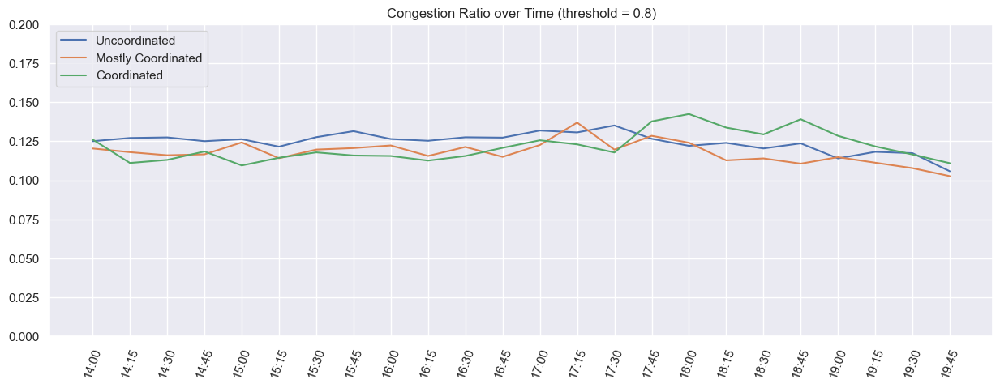

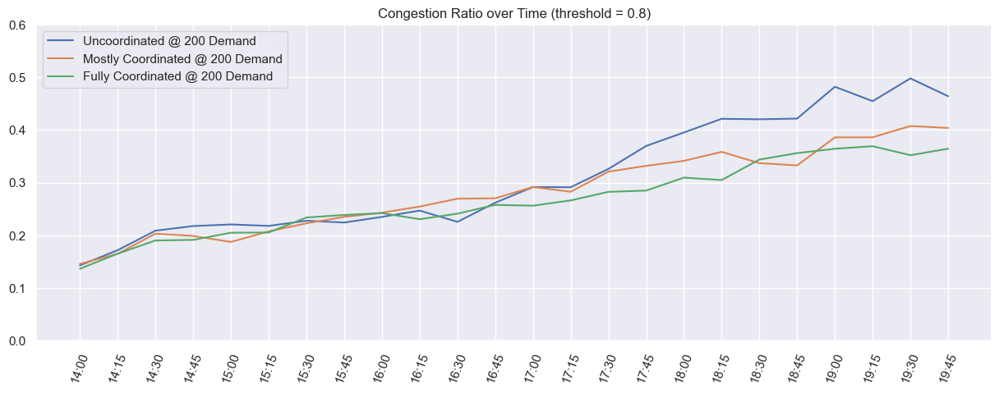

In [168]:
def plot_congestion_ratio(database_names, image_descriptor, congestion_threshold=0.8, vmin=0, vmax=0.2):
    fig, ax = plt.subplots(1, 1, figsize=(15, 5))

    for database_name in database_names:
        desc, database = unpacked_databases[database_name]['desc'], unpacked_databases[database_name]['database']

        section_lengths = database[['eid', 'count', 'travel']]
        section_lengths['approx_length'] = section_lengths['travel'] / section_lengths['count']
        section_lengths = section_lengths.dropna().groupby('eid').mean().reset_index()

        data = database[database['count'] > 0][['eid', 'speed', 'sid', 'ent']]
        data = data[(data['sid'] == 0) & (data['ent'] != 0)].drop(columns='sid')
        data = data.merge(sections[['eid', 'speed']], how='left', on='eid').dropna()
        data = data.merge(section_lengths[['eid', 'approx_length']], how='left', on='eid')
        data['congestion_ratio'] = data['speed_x'] / data['speed_y']
        hour_data = []

        for i in range(1, 25):
            timestep_data = data[data['ent'] == i]
            congested_length = np.sum(timestep_data[timestep_data['congestion_ratio'] < congestion_threshold]['approx_length'])
            tot_length = np.sum(timestep_data['approx_length'])
            hour_data.append(congested_length / tot_length)

        ax.plot(TIME_INTERVALS_STRING, hour_data, label=desc)

    plt.title(f"Congestion Ratio over Time (threshold = {congestion_threshold})")
    plt.xticks(rotation=70)
    plt.ylim(vmin, vmax)
    plt.legend(loc='upper left')
    plt.savefig(f'{image_path}/congestion-ratio-{image_descriptor}.png', bbox_inches='tight', pad_inches=0)
    plt.show()

plot_congestion_ratio(['fully_uncoordinated', 'mostly_coordinated', 'fully_coordinated'], '100')
plot_congestion_ratio(['fully_uncoordinated_200', 'mostly_coordinated_200', 'fully_coordinated_200'], '200', vmax=0.6)

## Animations

### Note: this section takes forever to run

In [46]:
uncoordinated_section_df

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1376.000000,-1.0,344.0,-1.0,1388.000000,...,0.0,-1.0,0.141860,1.154377,0.017442,-1.0,3.668785,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1308.000000,-1.0,327.0,-1.0,1316.000000,...,5.0,-1.0,0.000000,0.000000,0.000000,-1.0,1.422879,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1332.000000,-1.0,333.0,-1.0,1336.000000,...,6.0,-1.0,0.000000,0.000000,0.000000,-1.0,1.011380,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.000000,-1.0,0.0,-1.0,0.000000,...,0.0,-1.0,-1.000000,-1.000000,-1.000000,-1.0,-1.000000,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.000000,-1.0,2.0,-1.0,8.000000,...,0.0,-1.0,0.000000,0.000000,0.000000,-1.0,0.011740,-1.0,0.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352870,151642198,151597396,28550,2,0,0.000000,-1.0,0.0,-1.0,0.000000,...,0.0,-1.0,-1.000000,-1.000000,-1.000000,-1.0,-1.000000,-1.0,-1.0,-1.0
352871,151642198,151600599,28581,2,0,0.000000,-1.0,0.0,-1.0,0.000000,...,0.0,-1.0,-1.000000,-1.000000,-1.000000,-1.0,-1.000000,-1.0,-1.0,-1.0
352872,151642198,151616088,3425,2,0,394.166667,-1.0,2365.0,-1.0,394.333333,...,18.0,-1.0,0.000000,0.000000,0.000000,-1.0,100.524190,-1.0,0.0,-1.0
352873,151642198,151616494,56150,2,0,275.500000,-1.0,1653.0,-1.0,275.500000,...,19.0,-1.0,0.076467,1.466448,0.000000,-1.0,8.289970,-1.0,0.0,-1.0


In [47]:
null_values['ent'] = 0
null_values

{'eid': None,
 'ent': 0,
 'flow': 0,
 'ttime': -1,
 'dtime': -1,
 'speed': -1,
 'density': 0}

In [48]:
dfs_section = {'uncoordinated': uncoordinated_section_df, 'coordinated': coordinated_section_df}

def preprocess_sections_animation(df):
    df = df[df['sid']==0]
    df = df.filter(items=null_values.keys()).dropna(axis=0)
    for k, v in null_values.items():
        df = df[df[k]!=v]
    return df

for k, df in dfs_section.items():
    dfs_section[k] = preprocess_sections_animation(df)

dfs_section['uncoordinated']

,eid,ent,flow,ttime,dtime,speed,density
0,242,1,1376.0,24.864037,18.625953,27.077439,52.313737
1,243,1,1308.0,2.650094,0.038512,105.441507,3.136745
2,244,1,1332.0,1.819127,0.071725,105.410827,3.265365
4,247,1,8.0,10.254333,0.576948,41.689960,0.194849
5,248,1,12.0,11.766326,7.641712,16.254352,0.765373
...,...,...,...,...,...,...,...
329340,33076,24,8.0,20.569050,0.393409,39.138701,0.205218
329342,36523,24,4.0,7.981964,0.564500,35.010047,0.114253
329347,3425,24,592.0,4.534206,1.773717,64.590449,4.611765
329348,56150,24,436.0,1.019432,0.256451,62.463459,3.681495


In [49]:
dfs_section['uncoordinated'][(dfs_section['uncoordinated']['eid']=="242") & (dfs_section['uncoordinated']['ent']==1)]

,eid,ent,flow,ttime,dtime,speed,density
0,242,1,1376.0,24.864037,18.625953,27.077439,52.313737


In [50]:
section_df = dfs_section['uncoordinated'].merge(dfs_section['coordinated'], on=['eid', 'ent'], how='left', suffixes=['_uncoordinated', '_coordinated'])

for k in section_cols:
    section_df[k+'_ratio'] = section_df[k+'_coordinated'] / section_df[k+'_uncoordinated']

section_df = section_df.dropna()
section_df

,eid,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio
0,242,1,1376.0,24.864037,18.625953,27.077439,52.313737,1356.0,24.155884,17.927443,27.772434,50.106215,0.985465,0.971519,0.962498,1.025667,0.957802
1,243,1,1308.0,2.650094,0.038512,105.441507,3.136745,1256.0,2.659904,0.047324,105.051102,3.019156,0.960245,1.003702,1.228788,0.996297,0.962513
2,243,1,1308.0,2.650094,0.038512,105.441507,3.136745,1272.0,2.785957,0.050646,105.056933,3.052417,0.972477,1.051267,1.315047,0.996353,0.973116
3,243,1,1308.0,2.650094,0.038512,105.441507,3.136745,1268.0,0.562661,0.010235,105.032080,3.044200,0.969419,0.212317,0.265752,0.996117,0.970497
4,244,1,1332.0,1.819127,0.071725,105.410827,3.265365,1280.0,1.823788,0.077166,105.117350,3.145367,0.960961,1.002562,1.075867,0.997216,0.963251
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68807,3425,24,592.0,4.534206,1.773717,64.590449,4.611765,636.0,4.733680,1.994731,60.720573,5.190379,1.074324,1.043993,1.124605,0.940086,1.125465
68808,56150,24,436.0,1.019432,0.256451,62.463459,3.681495,828.0,26.831333,22.877550,29.268433,18.928575,1.899083,26.319878,89.208327,0.468569,5.141546
68809,56150,24,436.0,1.019432,0.256451,62.463459,3.681495,852.0,1.090531,0.325831,58.184362,7.695855,1.954128,1.069743,1.270541,0.931494,2.090416
68810,7154,24,2872.0,11.460901,0.220636,104.340222,5.113093,1324.0,12.284400,0.264690,104.312196,2.541104,0.461003,1.071853,1.199667,0.999731,0.496980


In [51]:
section_df = section_df.merge(sections[['eid', 'geometry']], left_on='eid', right_on='eid').set_index('eid')
section_df = gpd.GeoDataFrame(section_df, geometry='geometry')
frame = section_df.to_crs("EPSG:3857")
frame

,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,geometry
eid,,,,,,,,,,,,,,,,,
242,1,1376.0,24.864037,18.625953,27.077439,52.313737,1356.0,24.155884,17.927443,27.772434,50.106215,0.985465,0.971519,0.962498,1.025667,0.957802,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,2,932.0,22.023825,15.840652,30.602339,32.015548,820.0,21.292549,15.107659,31.413536,26.367021,0.879828,0.966796,0.953727,1.026508,0.823569,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,3,928.0,23.068111,16.919972,28.925671,32.669274,748.0,20.712661,14.576582,32.253563,24.012597,0.806034,0.897892,0.861502,1.115050,0.735021,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,4,1028.0,24.250314,18.056209,27.989771,37.866400,780.0,20.496334,14.287262,32.678167,24.019167,0.758755,0.845199,0.791266,1.167504,0.634313,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,5,1152.0,23.811288,17.626821,28.004135,40.838244,892.0,22.238980,16.060410,30.088720,30.119886,0.774306,0.933968,0.911135,1.074438,0.737541,"LINESTRING (-13572344.019 4508460.315, -135723..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36771,23,4.0,1.709982,0.028644,40.952556,0.097674,12.0,1.282409,0.000000,55.411200,0.219753,3.000000,0.749954,0.000000,1.353058,2.249863,"LINESTRING (-13575525.776 4512998.261, -135755..."
298,24,4.0,15.288794,0.954761,46.662473,0.085722,8.0,17.538917,1.474865,40.689142,0.196676,2.000000,1.147175,1.544748,0.871989,2.294349,"LINESTRING (-13573798.612 4512969.259, -135737..."
525,24,4.0,6.343233,0.251891,48.960891,0.081698,8.0,7.023985,0.010860,44.538931,0.180931,2.000000,1.107319,0.043113,0.909684,2.214639,"LINESTRING (-13571754.422 4511855.748, -135717..."


### Side by side (and determining bounds)

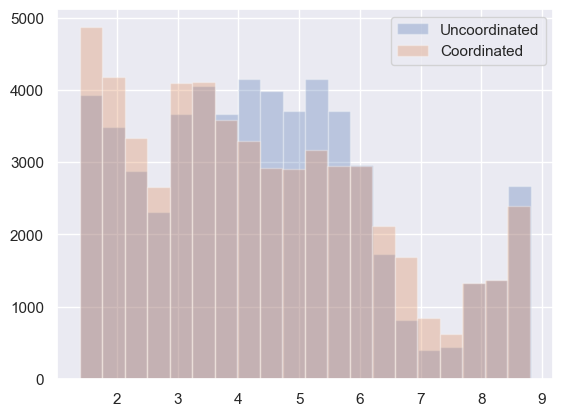

In [52]:
plt.hist(np.log(frame['flow_uncoordinated']), bins=20, alpha=0.3, label=uncoordinated_description)
plt.hist(np.log(frame['flow_coordinated']), bins=20, alpha=0.3, label=coordinated_description)
plt.legend()
plt.show()

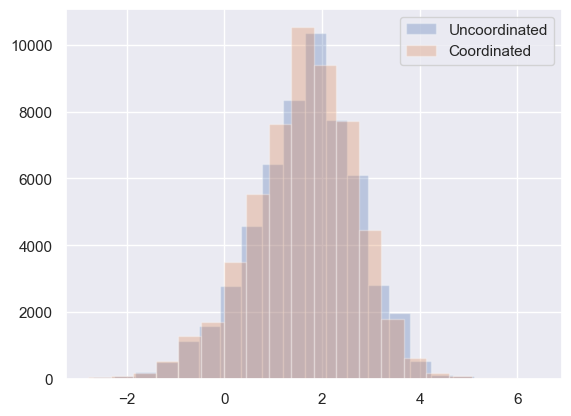

In [53]:
plt.hist(np.log(frame['ttime_uncoordinated']), bins=20, alpha=0.3, label=uncoordinated_description)
plt.hist(np.log(frame['ttime_coordinated']), bins=20, alpha=0.3, label=coordinated_description)
plt.legend()
plt.show()

<AxesSubplot:>

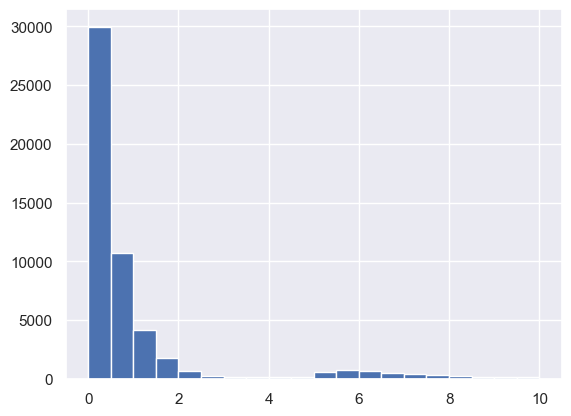

In [54]:
frame['dtime_uncoordinated'][frame['dtime_uncoordinated'] < 10].hist(bins=20)

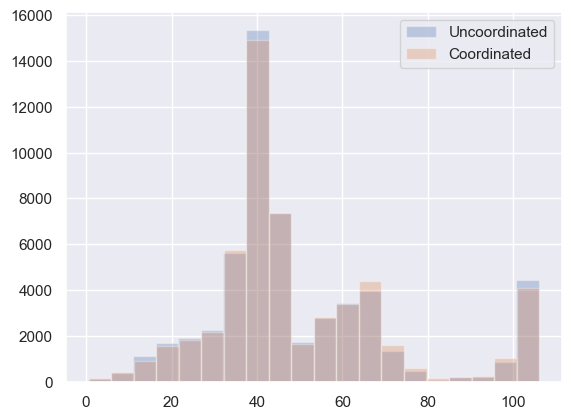

In [55]:
plt.hist(frame['speed_uncoordinated'], bins=20, alpha=0.3, label=uncoordinated_description)
plt.hist(frame['speed_coordinated'], bins=20, alpha=0.3, label=coordinated_description)
plt.legend()
plt.show()

<AxesSubplot:>

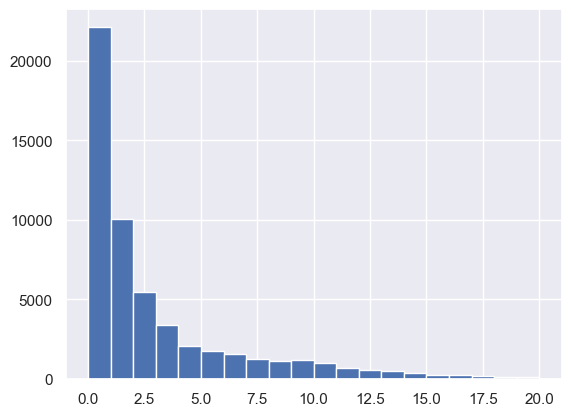

In [56]:
frame['density_uncoordinated'][frame['density_uncoordinated'] < 20].hist(bins=20)

In [57]:
frame['log_flow_uncoordinated'] = np.log(frame['flow_uncoordinated'])
frame['log_flow_coordinated'] = np.log(frame['flow_coordinated'])
frame['log_ttime_uncoordinated'] = np.log(frame['ttime_uncoordinated'])
frame['log_ttime_coordinated'] = np.log(frame['ttime_coordinated'])

In [58]:
section_cols

{'flow': Column(flow, Mean flow, veh/h),
 'ttime': Column(ttime, Mean travel time, s),
 'dtime': Column(dtime, Mean delay time, s),
 'speed': Column(speed, Mean speed, km/h),
 'density': Column(density, Density by lane, veh/km)}

In [59]:
section_comparisons = {
    'flow': (Column('log_flow', 'Log of mean flow', 'veh/h'), (0, 10)),
    'ttime': (Column('log_ttime', 'Log of mean travel time', 's'), (-2, 6)),
    'dtime': (section_cols['dtime'], (0, 2.5)),
    'speed': (section_cols['speed'], (0, 120)),
    'density': (section_cols['density'], (0, 8))
}

Processing log_flow, frame 1
Processing log_flow, frame 1


IndexError: list index out of range

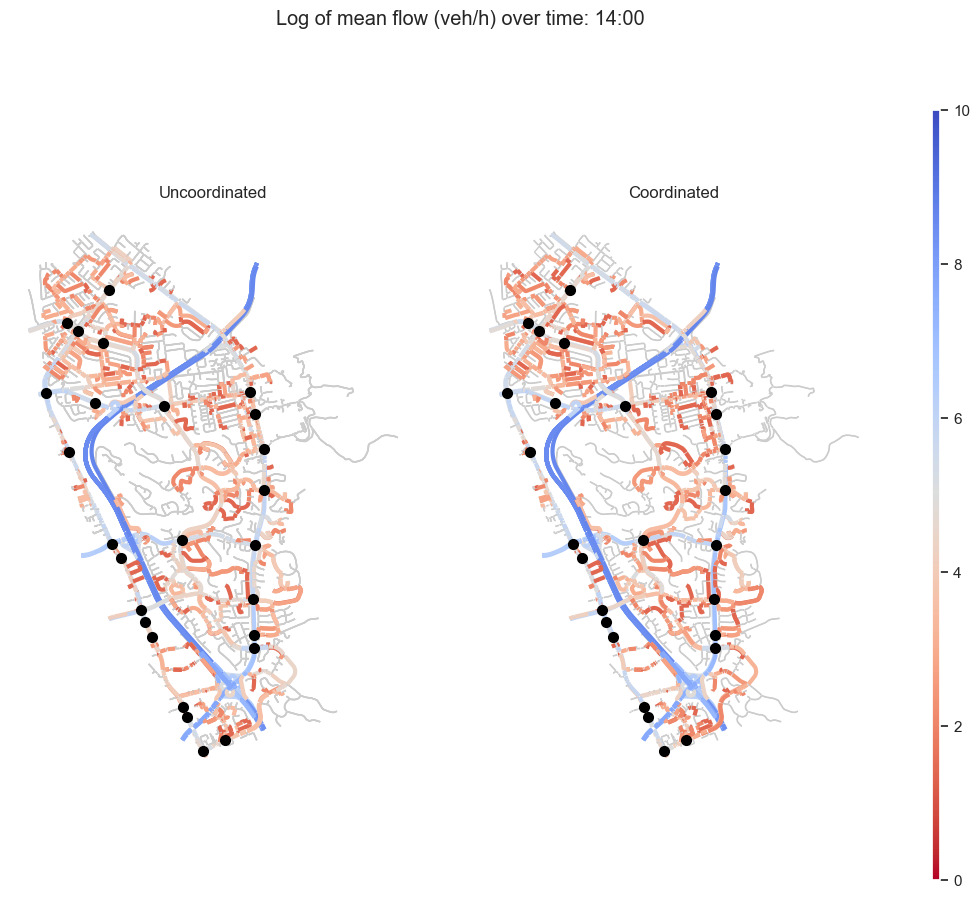

In [60]:
from matplotlib import animation
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_side_by_side(metric, vmin, vmax):
    fig, [ax1, ax2, cax] = plt.subplots(1, 3, figsize=(12, 10), gridspec_kw={"width_ratios":[50,50,1]})
    norm = Normalize(vmin=vmin, vmax=vmax)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} ({metric.unit}) over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax1, lw=1, color='0.8', zorder=-1)
        sections.plot(ax=ax2, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax1, column=(metric.name + '_uncoordinated'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        data.plot(ax=ax2, column=(metric.name + '_coordinated'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        im1 = node_geo_city.plot(ax=ax1, color='black', lw=2, zorder=1)
        im2 = node_geo_city.plot(ax=ax2, color='black', lw=2, zorder=1)
        ax1.set_title(uncoordinated_description)
        ax2.set_title(coordinated_description)
        ax1.set_axis_off()
        ax2.set_axis_off()
        return [im1, im2]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.6)
    anim.save(f'{image_path}/{metric.name}_side_by_side.gif', writer=writergif)
    # plt.show()

for k in section_cols:
    metric, (vmin, vmax) = section_comparisons[k]
    make_animation_side_by_side(metric, vmin, vmax)

In [ ]:
for k in ['dtime', 'density']:
    metric, (vmin, vmax) = section_comparisons[k]
    make_animation_side_by_side(metric, vmin, vmax)

### Ratio

In [ ]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_ratio(metric):
    fig, [ax,cax] = plt.subplots(1, 2, figsize=(7, 9), gridspec_kw={"width_ratios":[50,1]})
    norm = Normalize(vmin=0, vmax=2)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    ax.set_axis_off()
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} coordinated/uncoordinated ratio over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax, column=(metric.name + '_ratio'), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
        im = node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        return [im]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.8)
    anim.save(f'{image_path}/{metric.name}_ratio.gif', writer=writergif)
    # plt.show()

for k in section_cols:
    make_animation_ratio(section_cols[k])

In [ ]:
make_animation_ratio(section_cols['speed'])

### Difference

In [ ]:
for k in section_cols:
    frame[k + '_difference'] = frame[k + '_coordinated'] - frame[k + '_uncoordinated']

frame

In [ ]:
frame['ttime_difference'][abs(frame['ttime_difference']) < 5].hist(bins=20)

In [ ]:
frame['speed_difference'][abs(frame['speed_difference']) < 10].hist(bins=20)

In [ ]:
section_comparisons_diff = {
    'ttime': (section_cols['ttime'], (-10, 10)),
    'speed': (section_cols['speed'], (-10, 10))
}

In [ ]:
sections

In [ ]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_diff(metric, vmin, vmax):
    fig, [ax,cax] = plt.subplots(1, 2, figsize=(7, 9), gridspec_kw={"width_ratios":[50,1]})
    norm = Normalize(vmin=vmin, vmax=vmax)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    ax.set_axis_off()
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} coordinated-uncoordinated difference ({metric.unit}) over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax, column=(metric.name + '_difference'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        im = node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        return [im]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.8)
    anim.save(f'{image_path}/{metric.name}_difference.gif', writer=writergif)
    # plt.show()

for k in ['ttime', 'speed']:
    metric, (vmin, vmax) = section_comparisons_diff[k]
    make_animation_diff(metric, vmin, vmax)

### MP4 generation

Because direct MP4 writing doesn't work.

In [ ]:
import moviepy.editor as mp

for filename in os.listdir(image_path):
    f = os.path.join(image_path, filename)
    name, ext = f.split('.')
    if os.path.isfile(f) and ext == 'gif':
        clip = mp.VideoFileClip(f)
        clip.write_videofile(name + ".mp4")

<a id='od'></a>
# OD Data

In [ ]:
uncoordinated_od_query = pd.read_sql('SELECT * FROM MICENT_O', uncoordinated_con)
uncoordinated_od_df = pd.DataFrame(uncoordinated_od_query)

uncoordinated_od_df

,did,oid,eid,sid,ent,destination,nbveh,nbveh_D,flow,flow_D,...,qvmean,qvmean_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151634377,int_0,0,1,151634377.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1,151642198,151634377,int_0,0,1,151634402.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,151642198,151634377,int_0,0,1,151634411.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,151642198,151634377,int_0,0,1,151634430.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,151634377,int_0,0,1,151634517.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561145,151642198,151635745,ext_10,2,0,151635736.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561146,151642198,151635745,ext_10,2,0,151635739.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561147,151642198,151635745,ext_10,2,0,151635742.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561148,151642198,151635745,ext_10,2,0,151635745.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [ ]:
coordinated_od_query = pd.read_sql('SELECT * FROM MICENT_O', coordinated_con)
coordinated_od_df = pd.DataFrame(coordinated_od_query)

coordinated_od_df

,did,oid,eid,sid,ent,destination,nbveh,nbveh_D,flow,flow_D,...,qvmean,qvmean_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151634377,int_0,0,1,151634377.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1,151642198,151634377,int_0,0,1,151634402.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,151642198,151634377,int_0,0,1,151634411.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,151642198,151634377,int_0,0,1,151634430.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,151634377,int_0,0,1,151634517.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561145,151642198,151635745,ext_10,2,0,151635736.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561146,151642198,151635745,ext_10,2,0,151635739.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561147,151642198,151635745,ext_10,2,0,151635742.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561148,151642198,151635745,ext_10,2,0,151635745.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [ ]:
coordinated_od_df[(coordinated_od_df['sid']==0) & (coordinated_od_df['nbveh']>0)][['oid', 'eid', 'destination', 'spdh', 'ttime', 'dtime', 'travel']]

,oid,eid,destination,spdh,ttime,dtime,travel
76,151634377,int_0,151635718.0,41.520234,597.914119,294.817104,20.664205
79,151634377,int_0,151635727.0,57.389073,404.713284,158.082084,6.451700
81,151634377,int_0,151635733.0,57.262911,253.219668,90.405231,28.216446
84,151634377,int_0,151635742.0,64.739037,217.130030,40.932949,7.540029
86,151634377,int_0,0.0,53.538640,338.865644,135.171993,62.872380
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600.0,30.225478,536.630965,310.429240,82.823023
546170,151635745,ext_10,151635648.0,47.874781,25.948789,2.342086,0.345081
546172,151635745,ext_10,151635666.0,29.066415,642.581220,463.257812,35.486612
546173,151635745,ext_10,151635689.0,37.303803,308.488841,118.071599,56.624617


In [ ]:
dfs_od = {'uncoordinated': uncoordinated_od_df, 'coordinated': coordinated_od_df}
od_columns = {
    'oid': Column('oid', 'Origin centroid identifier', None),
    'eid': Column('eid', 'Origin centroid external ID', None),
    'destination': Column('destination', 'Destination centroid identifier', None),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'ttime': Column('ttime', 'Mean travel time', 's'),
    'dtime': Column('dtime', 'Mean delay time', 's')
}
od_column_names = list(od_columns.keys())

mean_dist = Column('mean_dist', 'Mean travel distance', 'km')

def preprocess_od(df):
    df = df[(df['sid']==0) & (df['nbveh']>0)][od_column_names]
    df['mean_dist'] = df['speed'] * df['ttime'] / 3600
    df['oid'] = df['oid'].astype(int)
    df['destination'] = df['destination'].astype(int)
    return df

for k, df in dfs_od.items():
    dfs_od[k] = preprocess_od(df)

dfs_od['uncoordinated']

,oid,eid,destination,speed,ttime,dtime,mean_dist
76,151634377,int_0,151635718,46.386528,529.693760,244.801633,6.825182
79,151634377,int_0,151635727,71.815419,322.986454,76.484456,6.443169
81,151634377,int_0,151635733,52.185415,291.889771,127.449360,4.231219
84,151634377,int_0,151635742,63.010242,244.960231,68.762977,4.287501
86,151634377,int_0,0,54.883768,329.421187,133.482713,5.022188
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600,25.834955,574.791773,371.538523,4.124922
546170,151635745,ext_10,151635648,43.091229,31.690217,9.283711,0.379325
546172,151635745,ext_10,151635666,31.333956,420.794016,247.868783,3.662539
546173,151635745,ext_10,151635689,32.782972,405.405635,190.407408,3.691778


In [ ]:
dfs_od['coordinated']

,oid,eid,destination,speed,ttime,dtime,mean_dist
76,151634377,int_0,151635718,42.120805,597.914119,294.817104,6.995729
79,151634377,int_0,151635727,57.389073,404.713284,158.082084,6.451700
81,151634377,int_0,151635733,58.477601,253.219668,90.405231,4.113244
84,151634377,int_0,151635742,67.258679,217.130030,40.932949,4.056633
86,151634377,int_0,0,55.970158,338.865644,135.171993,5.268434
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600,32.220826,536.630965,310.429240,4.802970
546170,151635745,ext_10,151635648,47.874781,25.948789,2.342086,0.345081
546172,151635745,ext_10,151635666,36.043114,642.581220,463.257812,6.433508
546173,151635745,ext_10,151635689,38.682400,308.488841,118.071599,3.314747


In [ ]:
od_columns_compare = {
    'speed': od_columns['speed'],
    'ttime': od_columns['ttime'],
    'dtime': od_columns['dtime'],
    'mean_dist': mean_dist
}

od_df = dfs_od['uncoordinated'][od_columns_compare].join(
    dfs_od['coordinated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_coordinated')

for k in od_columns:
    if k not in od_columns_compare:
        od_df[k] = dfs_od['uncoordinated'][k]

for k in od_columns_compare:
    od_df[f'{k}_ratio'] = od_df[f'{k}_coordinated'] / od_df[f'{k}_uncoordinated']

od_df

C:\Users\prest\AppData\Local\Temp\ipykernel_18044\2171387974.py:8: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  od_df = dfs_od['uncoordinated'][od_columns_compare].join(
C:\Users\prest\AppData\Local\Temp\ipykernel_18044\2171387974.py:9: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  dfs_od['coordinated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_coordinated')


,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
76,46.386528,529.693760,244.801633,6.825182,42.120805,597.914119,294.817104,6.995729,151634377,int_0,151635718,0.908040,1.128792,1.204310,1.024988
79,71.815419,322.986454,76.484456,6.443169,57.389073,404.713284,158.082084,6.451700,151634377,int_0,151635727,0.799119,1.253035,2.066852,1.001324
81,52.185415,291.889771,127.449360,4.231219,58.477601,253.219668,90.405231,4.113244,151634377,int_0,151635733,1.120574,0.867518,0.709342,0.972118
84,63.010242,244.960231,68.762977,4.287501,67.258679,217.130030,40.932949,4.056633,151634377,int_0,151635742,1.067425,0.886389,0.595276,0.946153
86,54.883768,329.421187,133.482713,5.022188,55.970158,338.865644,135.171993,5.268434,151634377,int_0,0,1.019794,1.028670,1.012655,1.049032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546168,25.834955,574.791773,371.538523,4.124922,32.220826,536.630965,310.429240,4.802970,151635745,ext_10,151635600,1.247179,0.933609,0.835524,1.164378
546170,43.091229,31.690217,9.283711,0.379325,47.874781,25.948789,2.342086,0.345081,151635745,ext_10,151635648,1.111010,0.818826,0.252279,0.909724
546172,31.333956,420.794016,247.868783,3.662539,36.043114,642.581220,463.257812,6.433508,151635745,ext_10,151635666,1.150289,1.527068,1.868964,1.756570
546173,32.782972,405.405635,190.407408,3.691778,38.682400,308.488841,118.071599,3.314747,151635745,ext_10,151635689,1.179954,0.760939,0.620100,0.897873


In [ ]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio']].sort_values(by=f'{metric_name}_ratio')
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

speed_head, speed_tail = most_impacted('speed', 30)
ttime_head, ttime_tail = most_impacted('ttime', 30)
dtime_head, dtime_tail = most_impacted('dtime', 30)
mean_dist_head, mean_dist_tail = most_impacted('mean_dist', 30)

In [ ]:
speed_head

,oid,eid,destination,speed_ratio
227590,151635122,int_35,151635745,0.048704
230287,151635541,int_66,151635745,0.103256
185395,151635541,int_66,151635745,0.111572
116830,151635369,int_52,151635718,0.140030
159296,151634869,int_24,0,0.143552
207841,151635541,int_66,151635745,0.149611
208933,151635727,ext_4,151635291,0.159425
137806,151635122,int_35,151635745,0.171597
276753,151635745,ext_10,151634543,0.173656
204444,151634935,int_27,151635733,0.196298


In [ ]:
speed_tail

,oid,eid,destination,speed_ratio
364355,151635460,int_59,0,4.902637
342779,151635600,int_69,0,5.042574
74431,151635733,ext_6,151635291,5.123293
363572,151635345,int_50,0,5.154268
141722,151635730,ext_5,0,5.234338
341474,151635403,int_54,0,5.235954
321432,151635736,ext_7,151635403,5.377706
254217,151635742,ext_9,151634430,5.520539
363746,151635369,int_52,0,5.525050
363736,151635369,int_52,151635718,5.525050


### Aggregate plots (not useful)

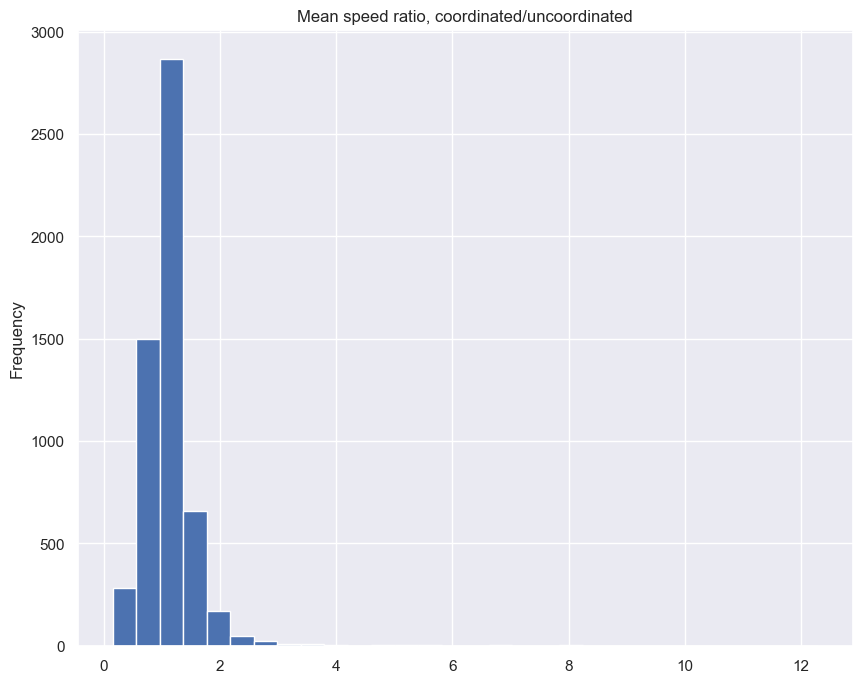

In [ ]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated')

    # with curve fitting (https://stackoverflow.com/a/35545265):
    # 
    # def gaussian(x, mean, amplitude, standard_deviation):
    #     return amplitude * np.exp( - (x - mean)**2 / (2*standard_deviation ** 2))

    # metric_data = od_df[f'{metric_name}_ratio']
    # metric_data = metric_data[~is_outlier(metric_data)]
    
    # fig = plt.figure(figsize=(10, 8))
    # bin_heights, bin_borders, _ = plt.hist(metric_data, bins=30)
    # bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
    # popt, _ = curve_fit(gaussian, bin_centers, bin_heights, p0=[1., 0., 1.])
    # x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)

    # plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated (outliers removed)')
    # plt.plot(x_interval_for_fit, gaussian(x_interval_for_fit, *popt), linestyle='dashed')


plot('speed')

In [ ]:
ttime_head

,oid,eid,destination,ttime_ratio
518258,151634845,int_22,0,0.006052
428039,151634742,int_17,0,0.007202
472931,151634742,int_17,0,0.009017
363736,151635369,int_52,151635718,0.011054
363746,151635369,int_52,0,0.011054
456140,151635736,ext_7,0,0.011451
320072,151635541,int_66,0,0.011788
471539,151634402,int_1,0,0.013313
320681,151635666,int_73,0,0.014936
406028,151634845,int_22,0,0.016915


In [ ]:
ttime_tail

,oid,eid,destination,ttime_ratio
541834,151635122,int_35,151635745,7.681647
187031,151635745,ext_10,151635583,7.752633
298732,151635727,ext_4,151635492,7.829097
231878,151635745,ext_10,151634856,8.004945
204884,151635051,int_32,0,8.007994
545602,151635727,ext_4,151634880,8.085025
405068,151634638,int_11,151635739,8.166019
248036,151634657,int_12,0,8.577183
158687,151634742,int_17,0,8.625018
137807,151635122,int_35,0,8.649238


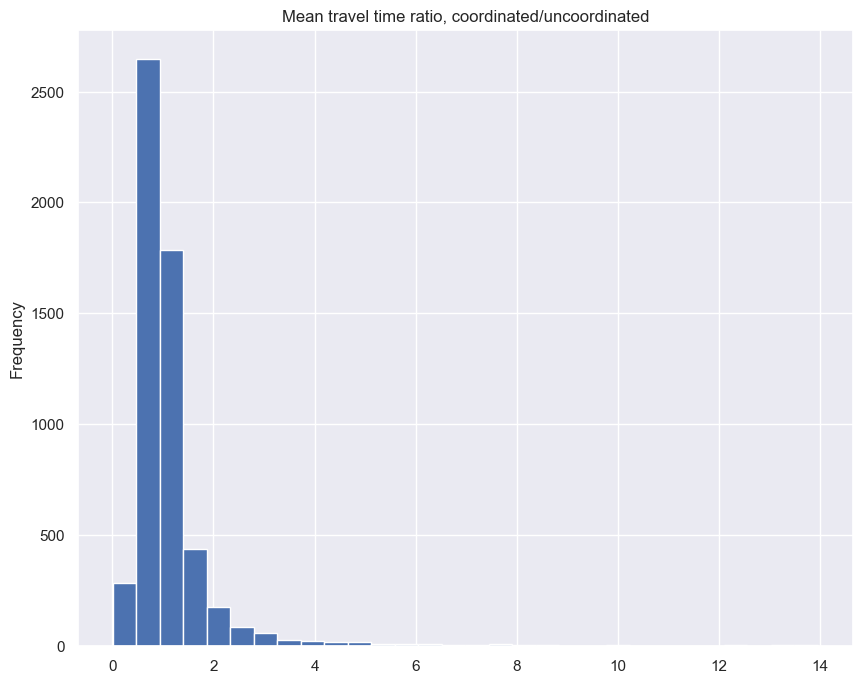

In [ ]:
plot('ttime')

In [ ]:
dtime_head

,oid,eid,destination,dtime_ratio
518258,151634845,int_22,0,0.001096
472931,151634742,int_17,0,0.001297
428039,151634742,int_17,0,0.001448
320072,151635541,int_66,0,0.002184
363746,151635369,int_52,0,0.002683
363736,151635369,int_52,151635718,0.002683
450920,151634845,int_22,0,0.002713
471539,151634402,int_1,0,0.003390
540957,151634880,int_25,151635724,0.003539
316244,151634845,int_22,0,0.003572


In [ ]:
dtime_tail

,oid,eid,destination,dtime_ratio
276753,151635745,ext_10,151634543,20.761096
229243,151635403,int_54,151635745,20.828690
229244,151635403,int_54,0,20.828690
136850,151634869,int_24,0,20.908614
541834,151635122,int_35,151635745,22.674395
276782,151635745,ext_10,151635122,24.054218
187031,151635745,ext_10,151635583,24.787247
160504,151635156,int_38,151635718,25.320731
140503,151635541,int_66,151635745,25.336266
186990,151635745,ext_10,151634935,26.067094


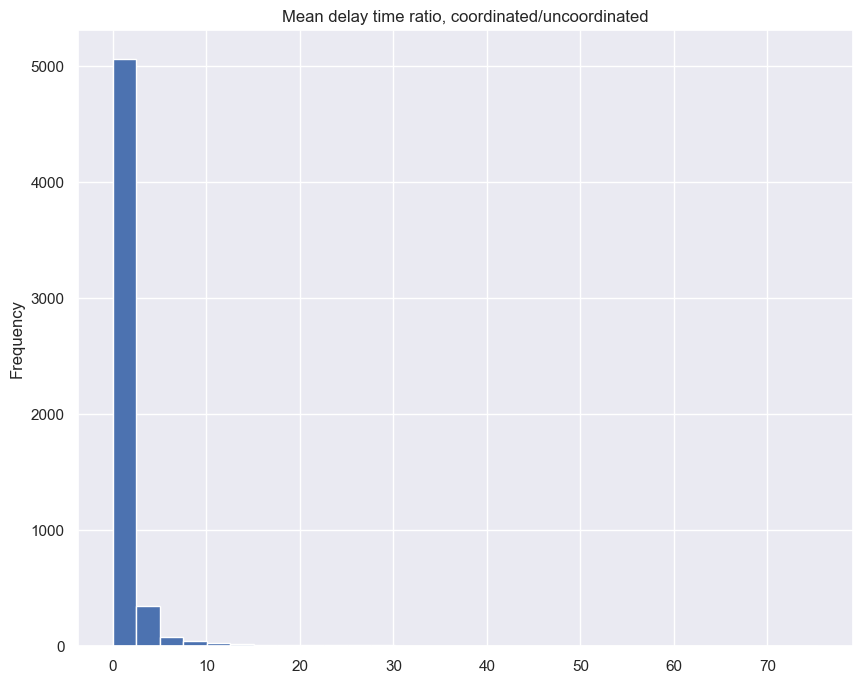

In [ ]:
plot('dtime')

In [ ]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio', f'{metric_name}_uncoordinated', f'{metric_name}_coordinated']].sort_values(by=f'{metric_name}_ratio')
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

dtime_head, dtime_tail = most_impacted('dtime', 30)

In [ ]:
mean_dist_head

,oid,eid,destination,mean_dist_ratio
320072,151635541,int_66,0,0.021879
472931,151634742,int_17,0,0.027412
450920,151634845,int_22,0,0.048811
383582,151634845,int_22,0,0.055031
363746,151635369,int_52,0,0.061072
363736,151635369,int_52,151635718,0.061072
495377,151634742,int_17,0,0.073242
382625,151634638,int_11,0,0.092943
297713,151635580,int_67,0,0.097817
320681,151635666,int_73,0,0.101148


In [ ]:
mean_dist_tail

,oid,eid,destination,mean_dist_ratio
116840,151635369,int_52,0,4.103159
187031,151635745,ext_10,151635583,4.106458
276816,151635745,ext_10,151635600,4.156539
137807,151635122,int_35,0,4.161861
248036,151634657,int_12,0,4.232383
158687,151634742,int_17,0,4.266783
231884,151635745,ext_10,151635006,4.347157
184178,151635369,int_52,0,4.358234
231855,151635745,ext_10,151634377,4.408509
318844,151635369,int_52,151635718,4.485118


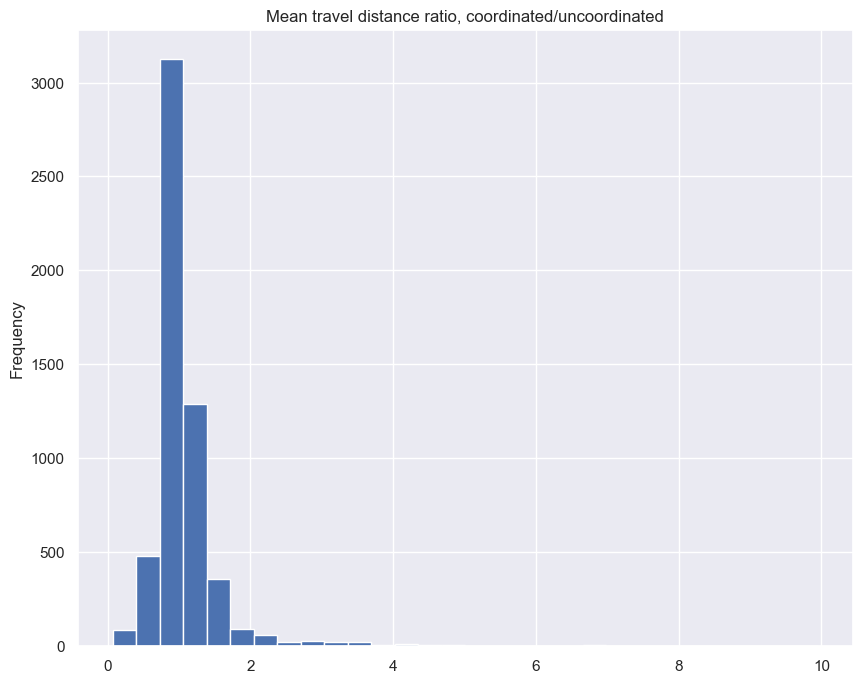

In [ ]:
od_columns['mean_dist'] = mean_dist
plot('mean_dist')

In [ ]:
od_df[od_df['oid']==151635727]['eid'].unique()

array(['ext_4'], dtype=object)

In [ ]:
centroids[centroids['eid']=='ext_4']

,id,eid,name,type,percentage,geometry
79,151632049.0,ext_4,ext_4,from_to,nothing,POINT (-13571810.274 4507565.394)


In [ ]:
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
76,46.386528,529.693760,244.801633,6.825182,42.120805,597.914119,294.817104,6.995729,151634377,int_0,151635718,0.908040,1.128792,1.204310,1.024988
79,71.815419,322.986454,76.484456,6.443169,57.389073,404.713284,158.082084,6.451700,151634377,int_0,151635727,0.799119,1.253035,2.066852,1.001324
81,52.185415,291.889771,127.449360,4.231219,58.477601,253.219668,90.405231,4.113244,151634377,int_0,151635733,1.120574,0.867518,0.709342,0.972118
84,63.010242,244.960231,68.762977,4.287501,67.258679,217.130030,40.932949,4.056633,151634377,int_0,151635742,1.067425,0.886389,0.595276,0.946153
86,54.883768,329.421187,133.482713,5.022188,55.970158,338.865644,135.171993,5.268434,151634377,int_0,0,1.019794,1.028670,1.012655,1.049032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546168,25.834955,574.791773,371.538523,4.124922,32.220826,536.630965,310.429240,4.802970,151635745,ext_10,151635600,1.247179,0.933609,0.835524,1.164378
546170,43.091229,31.690217,9.283711,0.379325,47.874781,25.948789,2.342086,0.345081,151635745,ext_10,151635648,1.111010,0.818826,0.252279,0.909724
546172,31.333956,420.794016,247.868783,3.662539,36.043114,642.581220,463.257812,6.433508,151635745,ext_10,151635666,1.150289,1.527068,1.868964,1.756570
546173,32.782972,405.405635,190.407408,3.691778,38.682400,308.488841,118.071599,3.314747,151635745,ext_10,151635689,1.179954,0.760939,0.620100,0.897873


In [ ]:
od_df[od_df['oid']==151635727]

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
6873,81.887914,270.167918,63.210730,6.145413,85.139032,257.007945,50.050990,6.078169,151635727,ext_4,151634377,1.039702,0.951290,0.791812,0.989058
6874,49.878372,654.825735,234.523086,9.072678,62.097407,526.889957,121.027819,9.088472,151635727,ext_4,151634402,1.244977,0.804626,0.516059,1.001741
6875,48.572165,172.682367,61.639941,2.329877,70.560277,118.872151,7.828310,2.329903,151635727,ext_4,151634411,1.452690,0.688386,0.127001,1.000011
6877,70.256213,370.395855,81.621358,7.228503,74.328358,350.554726,62.618791,7.237821,151635727,ext_4,151634517,1.057961,0.946433,0.767186,1.001289
6878,73.341400,92.734399,1.791220,1.889242,59.807216,138.037771,20.136603,2.293237,151635727,ext_4,151634526,0.815463,1.488528,11.241835,1.213840
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545654,20.072072,934.283391,711.957307,5.209168,19.666596,913.129509,715.660289,4.988375,151635727,ext_4,151635721,0.979799,0.977358,1.005201,0.957615
545657,21.983828,987.770656,632.319747,6.031939,26.833214,1122.903624,723.249519,8.369754,151635727,ext_4,151635730,1.220589,1.136806,1.143803,1.387573
545658,57.533070,278.568409,115.420721,4.451915,46.041424,553.797247,351.567627,7.082670,151635727,ext_4,151635733,0.800260,1.988012,3.045966,1.590927
545661,68.982270,780.830170,493.091857,14.962066,52.240927,979.243187,691.173480,14.210159,151635727,ext_4,151635742,0.757309,1.254105,1.401713,0.949746


In [ ]:
od_df = od_df.reset_index(drop=True)
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
0,46.386528,529.693760,244.801633,6.825182,42.120805,597.914119,294.817104,6.995729,151634377,int_0,151635718,0.908040,1.128792,1.204310,1.024988
1,71.815419,322.986454,76.484456,6.443169,57.389073,404.713284,158.082084,6.451700,151634377,int_0,151635727,0.799119,1.253035,2.066852,1.001324
2,52.185415,291.889771,127.449360,4.231219,58.477601,253.219668,90.405231,4.113244,151634377,int_0,151635733,1.120574,0.867518,0.709342,0.972118
3,63.010242,244.960231,68.762977,4.287501,67.258679,217.130030,40.932949,4.056633,151634377,int_0,151635742,1.067425,0.886389,0.595276,0.946153
4,54.883768,329.421187,133.482713,5.022188,55.970158,338.865644,135.171993,5.268434,151634377,int_0,0,1.019794,1.028670,1.012655,1.049032
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6589,25.834955,574.791773,371.538523,4.124922,32.220826,536.630965,310.429240,4.802970,151635745,ext_10,151635600,1.247179,0.933609,0.835524,1.164378
6590,43.091229,31.690217,9.283711,0.379325,47.874781,25.948789,2.342086,0.345081,151635745,ext_10,151635648,1.111010,0.818826,0.252279,0.909724
6591,31.333956,420.794016,247.868783,3.662539,36.043114,642.581220,463.257812,6.433508,151635745,ext_10,151635666,1.150289,1.527068,1.868964,1.756570
6592,32.782972,405.405635,190.407408,3.691778,38.682400,308.488841,118.071599,3.314747,151635745,ext_10,151635689,1.179954,0.760939,0.620100,0.897873


In [ ]:
# for each destination, find a matching oid, find the corresponding eid, and add it to the dataframe
od_df['destination_eid'] = od_df[['destination', 'eid']].merge(od_df.drop_duplicates('oid'), how='left', left_on='destination', right_on='oid')['eid_y']
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid
0,46.386528,529.693760,244.801633,6.825182,42.120805,597.914119,294.817104,6.995729,151634377,int_0,151635718,0.908040,1.128792,1.204310,1.024988,ext_1
1,71.815419,322.986454,76.484456,6.443169,57.389073,404.713284,158.082084,6.451700,151634377,int_0,151635727,0.799119,1.253035,2.066852,1.001324,ext_4
2,52.185415,291.889771,127.449360,4.231219,58.477601,253.219668,90.405231,4.113244,151634377,int_0,151635733,1.120574,0.867518,0.709342,0.972118,ext_6
3,63.010242,244.960231,68.762977,4.287501,67.258679,217.130030,40.932949,4.056633,151634377,int_0,151635742,1.067425,0.886389,0.595276,0.946153,ext_9
4,54.883768,329.421187,133.482713,5.022188,55.970158,338.865644,135.171993,5.268434,151634377,int_0,0,1.019794,1.028670,1.012655,1.049032,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6589,25.834955,574.791773,371.538523,4.124922,32.220826,536.630965,310.429240,4.802970,151635745,ext_10,151635600,1.247179,0.933609,0.835524,1.164378,int_69
6590,43.091229,31.690217,9.283711,0.379325,47.874781,25.948789,2.342086,0.345081,151635745,ext_10,151635648,1.111010,0.818826,0.252279,0.909724,int_71
6591,31.333956,420.794016,247.868783,3.662539,36.043114,642.581220,463.257812,6.433508,151635745,ext_10,151635666,1.150289,1.527068,1.868964,1.756570,int_73
6592,32.782972,405.405635,190.407408,3.691778,38.682400,308.488841,118.071599,3.314747,151635745,ext_10,151635689,1.179954,0.760939,0.620100,0.897873,int_74


In [ ]:
od_df.dropna(inplace=True)

In [ ]:
centroids

,id,eid,name,type,percentage,geometry
0,151630699.0,int_0,int_0,from_to,nothing,POINT (-13573642.679 4512924.678)
1,151630724.0,int_1,int_1,from_to,nothing,POINT (-13575676.027 4515411.360)
2,151630733.0,int_2,int_2,from_to,nothing,POINT (-13571804.021 4510567.669)
3,151630752.0,int_3,int_3,from_to,nothing,POINT (-13571083.898 4513667.978)
4,151630839.0,int_4,int_4,from_to,nothing,POINT (-13574729.704 4513825.353)
...,...,...,...,...,...,...
81,151632055.0,ext_6,ext_6,from_to,nothing,POINT (-13575185.233 4510750.740)
82,151632058.0,ext_7,ext_7,from_to,nothing,POINT (-13576142.758 4514816.830)
83,151632061.0,ext_8,ext_8,from_to,nothing,POINT (-13574944.926 4516561.766)
84,151632064.0,ext_9,ext_9,from_to,nothing,POINT (-13571943.471 4516065.038)


In [ ]:
od_df = od_df.merge(centroids[['eid', 'geometry']], on='eid').rename(columns={'geometry': 'geometry_o'})
od_df = od_df.merge(centroids[['eid', 'geometry']], left_on='destination_eid', right_on='eid').rename(columns={'geometry': 'geometry_d'})
# section_df = gpd.GeoDataFrame(section_df, geometry='geometry')

od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,eid_y,geometry_d
0,46.386528,529.693760,244.801633,6.825182,42.120805,597.914119,294.817104,6.995729,151634377,int_0,151635718,0.908040,1.128792,1.204310,1.024988,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344)
1,32.486407,793.627907,512.994236,7.161700,31.970802,818.442393,511.258453,7.268405,151634377,int_0,151635718,0.984129,1.031267,0.996616,1.014899,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344)
2,25.734592,1137.523666,756.180664,8.131585,36.748893,709.803331,316.759786,7.245691,151634377,int_0,151635718,1.427996,0.623990,0.418894,0.891055,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344)
3,20.273929,1467.805628,1066.559055,8.266163,25.840715,1301.674651,770.994814,9.343390,151634377,int_0,151635718,1.274579,0.886817,0.722881,1.130318,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344)
4,17.126015,1633.223647,1228.081949,7.769615,19.146583,1550.903554,1008.569882,8.248473,151634377,int_0,151635718,1.117982,0.949597,0.821256,1.061632,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4713,21.604906,3012.273352,1847.070026,18.077745,22.463056,1738.651088,1119.420697,10.848727,151635739,ext_8,151635648,1.039720,0.577189,0.606052,0.600115,int_71,POINT (-13574944.926 4516561.766),int_71,POINT (-13575755.335 4513344.897)
4714,30.197405,1280.208681,719.753806,10.738606,18.843341,1470.458346,982.432561,7.696763,151635739,ext_8,151635648,0.624005,1.148608,1.364956,0.716738,int_71,POINT (-13574944.926 4516561.766),int_71,POINT (-13575755.335 4513344.897)
4715,20.897996,3408.131232,2124.899016,19.784198,17.757291,1417.997826,937.458767,6.994389,151635742,ext_9,151635648,0.849713,0.416063,0.441178,0.353534,int_71,POINT (-13571943.471 4516065.038),int_71,POINT (-13575755.335 4513344.897)
4716,46.842013,26.520905,2.914202,0.345081,47.874781,25.948789,2.342086,0.345081,151635745,ext_10,151635648,1.022048,0.978428,0.803680,1.000000,int_71,POINT (-13575933.355 4513673.488),int_71,POINT (-13575755.335 4513344.897)


### Colored line plots

In [ ]:
from shapely.geometry import Point, LineString, Polygon

od_df['geometry'] = od_df[['geometry_o', 'geometry_d']].apply(lambda *args: LineString(*args), axis=1)
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,eid_y,geometry_d,geometry
0,46.386528,529.693760,244.801633,6.825182,42.120805,597.914119,294.817104,6.995729,151634377,int_0,151635718,0.908040,1.128792,1.204310,1.024988,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
1,32.486407,793.627907,512.994236,7.161700,31.970802,818.442393,511.258453,7.268405,151634377,int_0,151635718,0.984129,1.031267,0.996616,1.014899,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
2,25.734592,1137.523666,756.180664,8.131585,36.748893,709.803331,316.759786,7.245691,151634377,int_0,151635718,1.427996,0.623990,0.418894,0.891055,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
3,20.273929,1467.805628,1066.559055,8.266163,25.840715,1301.674651,770.994814,9.343390,151634377,int_0,151635718,1.274579,0.886817,0.722881,1.130318,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
4,17.126015,1633.223647,1228.081949,7.769615,19.146583,1550.903554,1008.569882,8.248473,151634377,int_0,151635718,1.117982,0.949597,0.821256,1.061632,ext_1,POINT (-13573642.679 4512924.678),ext_1,POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4713,21.604906,3012.273352,1847.070026,18.077745,22.463056,1738.651088,1119.420697,10.848727,151635739,ext_8,151635648,1.039720,0.577189,0.606052,0.600115,int_71,POINT (-13574944.926 4516561.766),int_71,POINT (-13575755.335 4513344.897),LINESTRING (-13574944.92610564 4516561.7660208...
4714,30.197405,1280.208681,719.753806,10.738606,18.843341,1470.458346,982.432561,7.696763,151635739,ext_8,151635648,0.624005,1.148608,1.364956,0.716738,int_71,POINT (-13574944.926 4516561.766),int_71,POINT (-13575755.335 4513344.897),LINESTRING (-13574944.92610564 4516561.7660208...
4715,20.897996,3408.131232,2124.899016,19.784198,17.757291,1417.997826,937.458767,6.994389,151635742,ext_9,151635648,0.849713,0.416063,0.441178,0.353534,int_71,POINT (-13571943.471 4516065.038),int_71,POINT (-13575755.335 4513344.897),LINESTRING (-13571943.47134381 4516065.0377232...
4716,46.842013,26.520905,2.914202,0.345081,47.874781,25.948789,2.342086,0.345081,151635745,ext_10,151635648,1.022048,0.978428,0.803680,1.000000,int_71,POINT (-13575933.355 4513673.488),int_71,POINT (-13575755.335 4513344.897),LINESTRING (-13575933.35501098 4513673.4879506...


In [ ]:
od_df.rename(columns={'eid_x': 'eid'})
del od_df['eid_y']
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
0,46.386528,529.693760,244.801633,6.825182,42.120805,597.914119,294.817104,6.995729,151634377,int_0,151635718,0.908040,1.128792,1.204310,1.024988,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
1,32.486407,793.627907,512.994236,7.161700,31.970802,818.442393,511.258453,7.268405,151634377,int_0,151635718,0.984129,1.031267,0.996616,1.014899,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
2,25.734592,1137.523666,756.180664,8.131585,36.748893,709.803331,316.759786,7.245691,151634377,int_0,151635718,1.427996,0.623990,0.418894,0.891055,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
3,20.273929,1467.805628,1066.559055,8.266163,25.840715,1301.674651,770.994814,9.343390,151634377,int_0,151635718,1.274579,0.886817,0.722881,1.130318,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
4,17.126015,1633.223647,1228.081949,7.769615,19.146583,1550.903554,1008.569882,8.248473,151634377,int_0,151635718,1.117982,0.949597,0.821256,1.061632,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),LINESTRING (-13573642.67894201 4512924.6783126...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4713,21.604906,3012.273352,1847.070026,18.077745,22.463056,1738.651088,1119.420697,10.848727,151635739,ext_8,151635648,1.039720,0.577189,0.606052,0.600115,int_71,POINT (-13574944.926 4516561.766),POINT (-13575755.335 4513344.897),LINESTRING (-13574944.92610564 4516561.7660208...
4714,30.197405,1280.208681,719.753806,10.738606,18.843341,1470.458346,982.432561,7.696763,151635739,ext_8,151635648,0.624005,1.148608,1.364956,0.716738,int_71,POINT (-13574944.926 4516561.766),POINT (-13575755.335 4513344.897),LINESTRING (-13574944.92610564 4516561.7660208...
4715,20.897996,3408.131232,2124.899016,19.784198,17.757291,1417.997826,937.458767,6.994389,151635742,ext_9,151635648,0.849713,0.416063,0.441178,0.353534,int_71,POINT (-13571943.471 4516065.038),POINT (-13575755.335 4513344.897),LINESTRING (-13571943.47134381 4516065.0377232...
4716,46.842013,26.520905,2.914202,0.345081,47.874781,25.948789,2.342086,0.345081,151635745,ext_10,151635648,1.022048,0.978428,0.803680,1.000000,int_71,POINT (-13575933.355 4513673.488),POINT (-13575755.335 4513344.897),LINESTRING (-13575933.35501098 4513673.4879506...


In [ ]:
od_df = gpd.GeoDataFrame(od_df, geometry='geometry')
od_df.crs = 'EPSG:3857'
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
0,46.386528,529.693760,244.801633,6.825182,42.120805,597.914119,294.817104,6.995729,151634377,int_0,151635718,0.908040,1.128792,1.204310,1.024988,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),"LINESTRING (-13573642.679 4512924.678, -135733..."
1,32.486407,793.627907,512.994236,7.161700,31.970802,818.442393,511.258453,7.268405,151634377,int_0,151635718,0.984129,1.031267,0.996616,1.014899,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),"LINESTRING (-13573642.679 4512924.678, -135733..."
2,25.734592,1137.523666,756.180664,8.131585,36.748893,709.803331,316.759786,7.245691,151634377,int_0,151635718,1.427996,0.623990,0.418894,0.891055,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),"LINESTRING (-13573642.679 4512924.678, -135733..."
3,20.273929,1467.805628,1066.559055,8.266163,25.840715,1301.674651,770.994814,9.343390,151634377,int_0,151635718,1.274579,0.886817,0.722881,1.130318,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),"LINESTRING (-13573642.679 4512924.678, -135733..."
4,17.126015,1633.223647,1228.081949,7.769615,19.146583,1550.903554,1008.569882,8.248473,151634377,int_0,151635718,1.117982,0.949597,0.821256,1.061632,ext_1,POINT (-13573642.679 4512924.678),POINT (-13573357.287 4507368.344),"LINESTRING (-13573642.679 4512924.678, -135733..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4713,21.604906,3012.273352,1847.070026,18.077745,22.463056,1738.651088,1119.420697,10.848727,151635739,ext_8,151635648,1.039720,0.577189,0.606052,0.600115,int_71,POINT (-13574944.926 4516561.766),POINT (-13575755.335 4513344.897),"LINESTRING (-13574944.926 4516561.766, -135757..."
4714,30.197405,1280.208681,719.753806,10.738606,18.843341,1470.458346,982.432561,7.696763,151635739,ext_8,151635648,0.624005,1.148608,1.364956,0.716738,int_71,POINT (-13574944.926 4516561.766),POINT (-13575755.335 4513344.897),"LINESTRING (-13574944.926 4516561.766, -135757..."
4715,20.897996,3408.131232,2124.899016,19.784198,17.757291,1417.997826,937.458767,6.994389,151635742,ext_9,151635648,0.849713,0.416063,0.441178,0.353534,int_71,POINT (-13571943.471 4516065.038),POINT (-13575755.335 4513344.897),"LINESTRING (-13571943.471 4516065.038, -135757..."
4716,46.842013,26.520905,2.914202,0.345081,47.874781,25.948789,2.342086,0.345081,151635745,ext_10,151635648,1.022048,0.978428,0.803680,1.000000,int_71,POINT (-13575933.355 4513673.488),POINT (-13575755.335 4513344.897),"LINESTRING (-13575933.355 4513673.488, -135757..."


In [ ]:
od_df.groupby(['eid_x', 'destination_eid']).size().reset_index(name='num_trips')

,eid_x,destination_eid,num_trips
0,ext_1,ext_4,5
1,ext_1,ext_9,9
2,ext_1,int_0,7
3,ext_1,int_1,4
4,ext_1,int_11,5
...,...,...,...
853,int_8,ext_5,3
854,int_8,ext_6,6
855,int_8,ext_7,5
856,int_8,ext_8,6


In [ ]:
od_df.groupby(['eid_x', 'destination_eid']).mean().reset_index()

,eid_x,destination_eid,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
0,ext_1,ext_4,25.556144,295.313008,226.742779,1.918044,24.295905,344.682939,265.583270,2.049469,151635718.0,151635727.0,0.948190,1.138172,1.140189,1.071661
1,ext_1,ext_9,29.860014,1572.329386,1042.098854,11.171071,35.080795,1177.069455,740.339263,10.528878,151635718.0,151635742.0,1.224266,0.783657,0.744249,0.943984
2,ext_1,int_0,27.187833,1199.267136,813.600301,7.977918,31.547732,1048.240907,665.391037,8.306008,151635718.0,151634377.0,1.209099,0.889802,0.854528,1.045984
3,ext_1,int_1,37.955046,1007.045104,546.894067,9.892125,43.879778,861.900126,398.165267,9.994475,151635718.0,151634402.0,1.174669,0.868333,0.747228,1.008969
4,ext_1,int_11,19.397791,1952.406735,1328.620258,10.374708,38.719119,951.552608,509.303338,9.951049,151635718.0,151634638.0,2.045200,0.494437,0.392316,0.976499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,int_8,ext_5,19.848815,845.514293,550.671892,4.645911,30.280508,613.192943,334.344807,5.142778,151634607.0,151635730.0,1.539367,0.729144,0.629218,1.106585
854,int_8,ext_6,34.130327,458.480475,190.355331,4.227543,29.715790,579.749128,345.529574,4.120116,151634607.0,151635733.0,0.904639,1.244754,2.403750,0.988061
855,int_8,ext_7,31.426189,716.119764,327.395112,6.203720,47.023268,412.489225,87.997161,5.349633,151634607.0,151635736.0,1.503933,0.579173,0.272543,0.864683
856,int_8,ext_8,35.098139,668.749028,282.077226,6.122288,42.018133,574.926142,181.887921,6.404968,151634607.0,151635739.0,1.220461,0.867141,0.633958,1.039106


In [ ]:
od_df.sort_values('speed_ratio')

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
1881,47.490605,61.834517,12.192477,0.815711,2.312976,821.094315,787.371427,0.527548,151635122,int_35,151635745,0.048704,13.278899,64.578465,0.646734,ext_10,POINT (-13575664.243 4514356.337),POINT (-13575933.355 4513673.488),"LINESTRING (-13575664.243 4514356.337, -135759..."
2014,57.432569,65.453587,11.428785,1.044213,5.930266,817.107970,736.024073,1.346019,151635541,int_66,151635745,0.103256,12.483777,64.400905,1.289027,ext_10,POINT (-13575499.547 4514879.423),POINT (-13575933.355 4513673.488),"LINESTRING (-13575499.547 4514879.423, -135759..."
2012,59.725428,68.001053,8.073582,1.128164,6.663657,655.442939,595.078885,1.213235,151635541,int_66,151635745,0.111572,9.638718,73.706925,1.075406,ext_10,POINT (-13575499.547 4514879.423),POINT (-13575933.355 4513673.488),"LINESTRING (-13575499.547 4514879.423, -135759..."
174,38.560044,99.267593,35.249671,1.063267,5.399570,541.171893,495.051771,0.811693,151635369,int_52,151635718,0.140030,5.451647,14.044153,0.763395,ext_1,POINT (-13573148.722 4508525.384),POINT (-13573357.287 4507368.344),"LINESTRING (-13573148.722 4508525.384, -135733..."
2013,56.577811,68.605955,6.461558,1.078215,8.464650,898.058267,752.585478,2.111597,151635541,int_66,151635745,0.149611,13.090092,116.471207,1.958419,ext_10,POINT (-13575499.547 4514879.423),POINT (-13575933.355 4513673.488),"LINESTRING (-13575499.547 4514879.423, -135759..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3968,2.526324,3371.345294,3238.589009,2.365864,13.946669,1278.759672,943.836437,4.954010,151635742,ext_9,151634430,5.520539,0.379302,0.291434,2.093954,int_3,POINT (-13571943.471 4516065.038),POINT (-13571083.898 4513667.978),"LINESTRING (-13571943.471 4516065.038, -135710..."
183,8.199289,6961.620227,6897.936333,15.855650,45.301481,76.951730,18.509532,0.968341,151635369,int_52,151635718,5.525050,0.011054,0.002683,0.061072,ext_1,POINT (-13573148.722 4508525.384),POINT (-13573357.287 4507368.344),"LINESTRING (-13573148.722 4508525.384, -135733..."
3165,6.173250,971.578007,871.288675,1.666054,43.043973,140.905005,45.611664,1.684753,151635730,ext_5,151635369,6.972660,0.145027,0.052350,1.011224,int_52,POINT (-13574710.931 4509583.600),POINT (-13573148.722 4508525.384),"LINESTRING (-13574710.931 4509583.600, -135731..."
2376,6.287778,1398.178766,1268.820871,2.442066,50.432523,178.513812,59.339192,2.500806,151634543,int_6,151635730,8.020723,0.127676,0.046767,1.024054,ext_5,POINT (-13575191.654 4511972.695),POINT (-13574710.931 4509583.600),"LINESTRING (-13575191.654 4511972.695, -135747..."


Below is a big plot that takes a while to run. Instead, I've decided to split into subplots and save them individually.

In [ ]:
# fig, axs = plt.subplots(4, 2, figsize=(15,30))
# fig.suptitle('Relative OD aggregated over time')
# for i in range(4):
#     for j in range(2):
#         ax, metric = axs[i][j], od_columns[['speed', 'ttime', 'dtime', 'mean_dist'][i]]
#         suffix = ['_uncoordinated', '_coordinated'][j]
#         taz_int.plot(ax=ax, color='#353535', zorder=0)
#         taz_int.boundary.plot(ax=ax, color='black', zorder=1)
#         od_df.sort_values(by=metric.name+suffix).plot(
#             ax=ax, column=metric.name+suffix, legend=(j==1), cmap='hot', lw=0.3, zorder=2)
#         # node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
#         ax.set_title(f'{metric.desc} {suffix[1:]} ({metric.unit})')
#         ax.axis('off')

# plt.subplots_adjust(wspace=-.7)
# plt.show()

<AxesSubplot:>

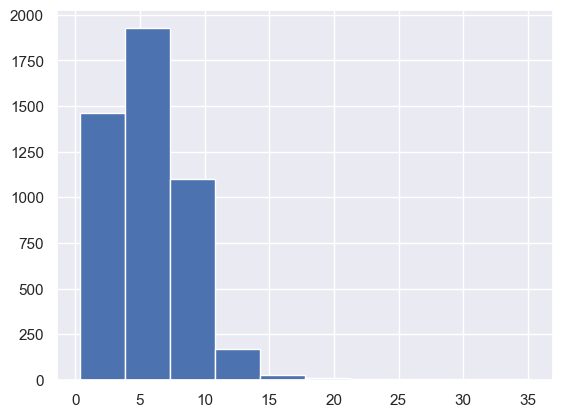

In [ ]:
od_df['mean_dist_uncoordinated'].hist()

In [ ]:
bounds = {
    'speed': (0, 100),
    'ttime': (0, 1200),
    'dtime': (0, 600),
    'mean_dist': (0, 15)
}

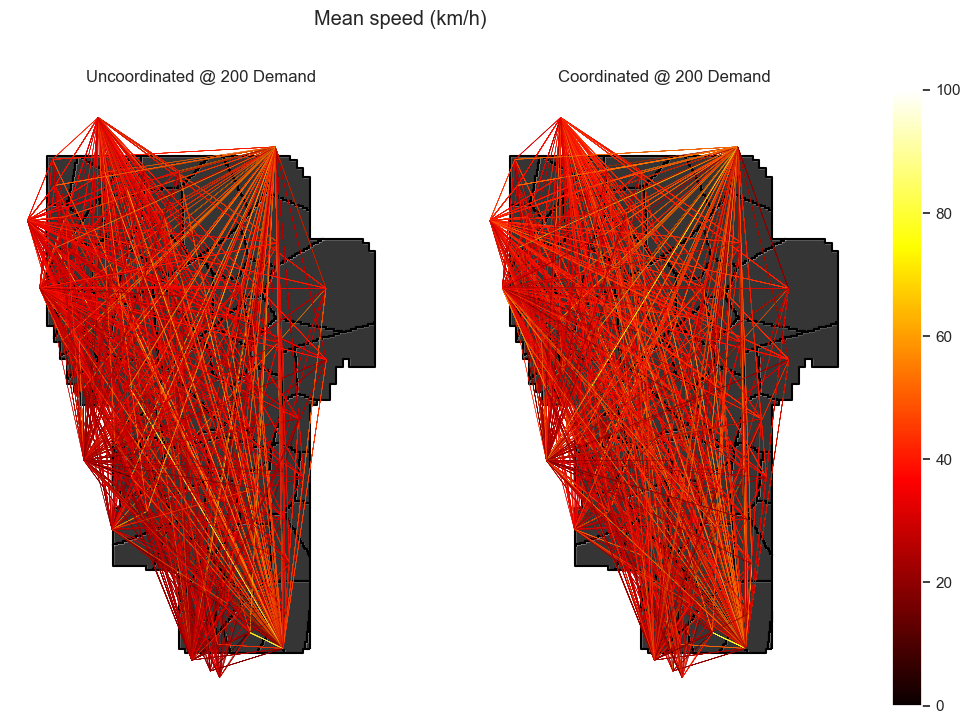

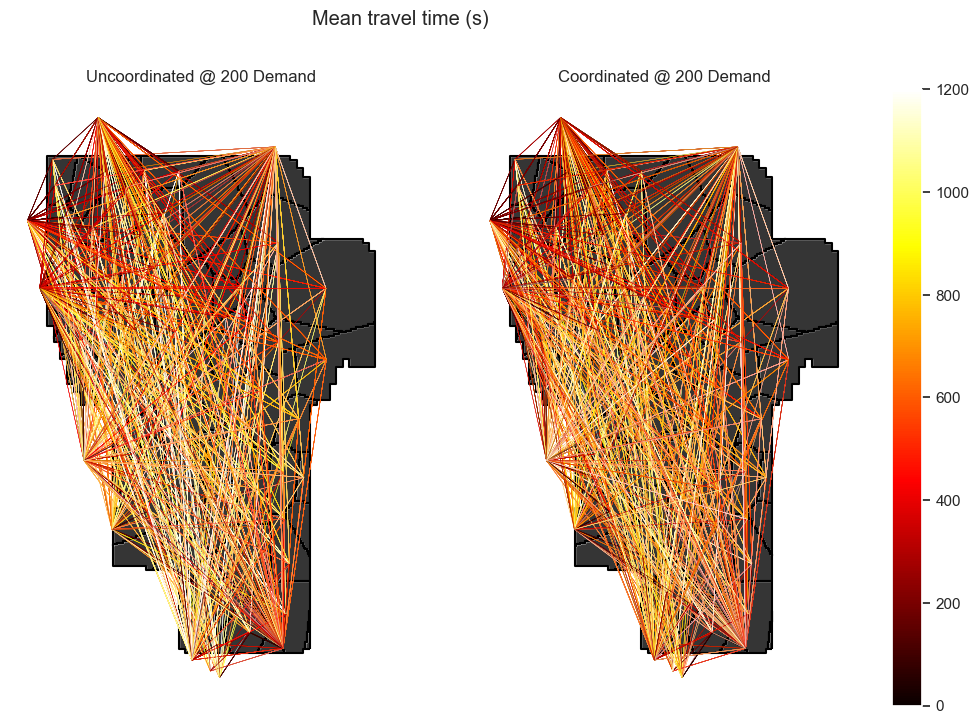

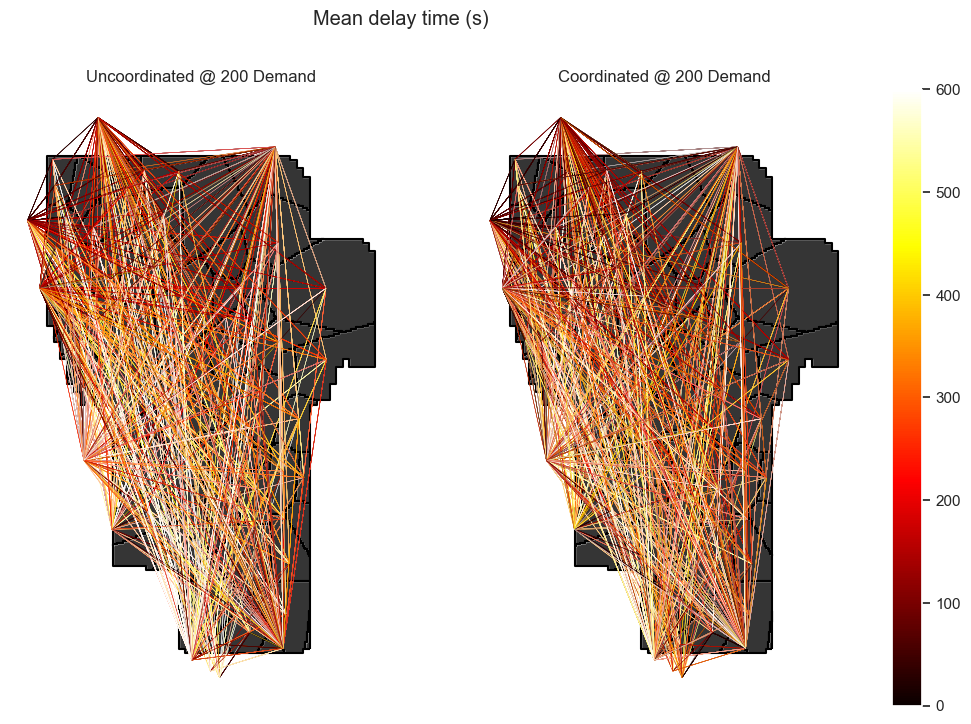

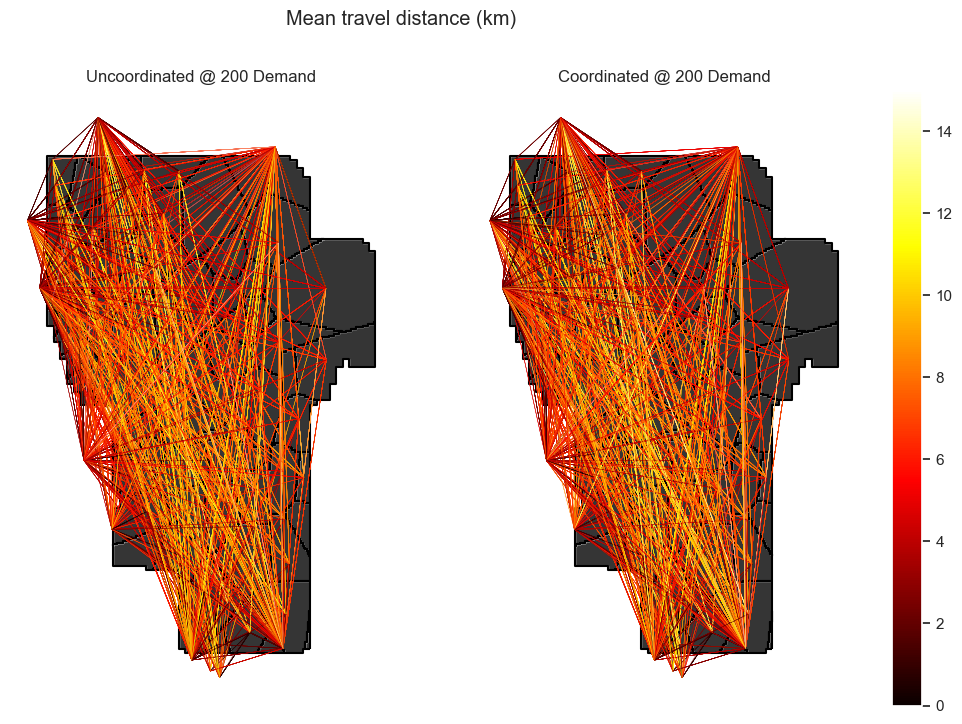

In [ ]:
for i in range(4):
    fig, axs = plt.subplots(1, 2, figsize=(15, 8))
    metric = od_columns[['speed', 'ttime', 'dtime', 'mean_dist'][i]]
    fig.suptitle(f'{metric.desc} ({metric.unit})')
    vmin, vmax = bounds[metric.name]

    for j in range(2):
        suffix = ['_uncoordinated', '_coordinated'][j]
        label = [uncoordinated_description, coordinated_description][j]
        ax = axs[j]
        taz_int.plot(ax=ax, color='#353535', zorder=0)
        taz_int.boundary.plot(ax=ax, color='black', zorder=1)
        od_df.sample(frac=1).plot(
            ax=ax, column=metric.name+suffix, legend=(j==1), cmap='hot', lw=0.3, vmin=vmin, vmax=vmax, zorder=2)
        ax.set_title(label)
        ax.axis('off')

    plt.subplots_adjust(wspace=-0.4)
    plt.savefig(f'{image_path}/centroid-{metric.name}.png',
        bbox_inches='tight', pad_inches=0)
    plt.show()

In [ ]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated')

### Mostly vs fully coordinated inverse ratio plotting

Inverted to emphasize that red = bad and blue = good, to visually assess how bad the mostly coordinated scenario is.

In [ ]:
centroid_means = gpd.GeoDataFrame(od_df.groupby('eid_x').mean().merge(centroids[['eid', 'geometry']], left_index=True, right_on='eid'), geometry='geometry')
centroid_means = centroid_means.to_crs('EPSG:3857')
centroid_means

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,eid,geometry
76,24.745521,1043.330177,694.815768,6.808702,29.451064,822.358295,511.789932,6.557841,151635718.0,1.516351e+08,1.229921,0.861273,0.831163,0.990737,ext_1,POINT (-13573357.287 4507368.344)
85,33.899843,528.192215,282.764676,4.210430,37.159235,575.736051,325.480502,4.620253,151635745.0,1.516350e+08,1.114924,1.239124,1.698295,1.201155,ext_10,POINT (-13575933.355 4513673.488)
77,22.835311,1092.773128,738.802146,7.092830,30.112558,792.788091,473.700076,6.934545,151635721.0,1.516353e+08,1.379356,0.770284,0.696944,1.001000,ext_2,POINT (-13573042.528 4507181.778)
78,28.405767,908.343579,539.715032,6.898169,37.492241,666.378780,316.095101,6.919926,151635724.0,1.516350e+08,1.376072,0.829090,0.733112,1.048224,ext_3,POINT (-13572885.333 4507072.584)
79,48.163892,620.538419,315.380722,7.085512,44.496703,772.305708,454.895442,7.735385,151635727.0,1.516351e+08,0.972884,1.365305,2.105926,1.115487,ext_4,POINT (-13571810.274 4507565.394)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,51.805837,433.699191,220.005206,4.768820,50.068392,552.076563,334.747212,5.218936,151634562.0,1.516357e+08,1.032572,1.440572,2.208525,1.141719,int_7,POINT (-13572372.811 4507834.274)
71,33.396670,662.450224,355.296216,5.438915,30.837159,682.641267,400.249524,5.550868,151635648.0,1.516357e+08,1.020592,1.394280,2.171680,1.084559,int_71,POINT (-13575755.335 4513344.897)
73,31.995741,1044.959472,741.468487,5.666852,35.427064,882.053231,603.415376,5.260602,151635666.0,1.516357e+08,1.156894,1.095825,1.365711,1.010755,int_73,POINT (-13575027.500 4514704.241)
74,35.009791,1161.742860,826.900588,6.254172,34.003037,1113.314504,823.449214,5.581114,151635689.0,1.516357e+08,0.979726,1.053497,1.325998,0.929389,int_74,POINT (-13572521.812 4513700.187)


In [ ]:
for metric_name in ['speed', 'ttime', 'dtime', 'mean_dist']:
    centroid_means[metric_name + '_ratio_inv'] = centroid_means[metric_name + '_uncoordinated'] / centroid_means[metric_name + '_coordinated']
    centroid_means[metric_name + '_diff_inv'] = centroid_means[metric_name + '_uncoordinated'] - centroid_means[metric_name + '_coordinated']

centroid_means

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,...,eid,geometry,speed_ratio_inv,speed_diff_inv,ttime_ratio_inv,ttime_diff_inv,dtime_ratio_inv,dtime_diff_inv,mean_dist_ratio_inv,mean_dist_diff_inv
76,24.745521,1043.330177,694.815768,6.808702,29.451064,822.358295,511.789932,6.557841,151635718.0,1.516351e+08,...,ext_1,POINT (-13573357.287 4507368.344),0.840225,-4.705543,1.268705,220.971882,1.357619,183.025836,1.038254,0.250861
85,33.899843,528.192215,282.764676,4.210430,37.159235,575.736051,325.480502,4.620253,151635745.0,1.516350e+08,...,ext_10,POINT (-13575933.355 4513673.488),0.912286,-3.259392,0.917421,-47.543836,0.868761,-42.715826,0.911299,-0.409822
77,22.835311,1092.773128,738.802146,7.092830,30.112558,792.788091,473.700076,6.934545,151635721.0,1.516353e+08,...,ext_2,POINT (-13573042.528 4507181.778),0.758332,-7.277247,1.378392,299.985037,1.559641,265.102070,1.022826,0.158285
78,28.405767,908.343579,539.715032,6.898169,37.492241,666.378780,316.095101,6.919926,151635724.0,1.516350e+08,...,ext_3,POINT (-13572885.333 4507072.584),0.757644,-9.086475,1.363104,241.964798,1.707445,223.619931,0.996856,-0.021757
79,48.163892,620.538419,315.380722,7.085512,44.496703,772.305708,454.895442,7.735385,151635727.0,1.516351e+08,...,ext_4,POINT (-13571810.274 4507565.394),1.082415,3.667189,0.803488,-151.767290,0.693304,-139.514720,0.915987,-0.649872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,51.805837,433.699191,220.005206,4.768820,50.068392,552.076563,334.747212,5.218936,151634562.0,1.516357e+08,...,int_7,POINT (-13572372.811 4507834.274),1.034701,1.737445,0.785578,-118.377372,0.657228,-114.742006,0.913753,-0.450116
71,33.396670,662.450224,355.296216,5.438915,30.837159,682.641267,400.249524,5.550868,151635648.0,1.516357e+08,...,int_71,POINT (-13575755.335 4513344.897),1.083001,2.559511,0.970422,-20.191042,0.887687,-44.953308,0.979832,-0.111952
73,31.995741,1044.959472,741.468487,5.666852,35.427064,882.053231,603.415376,5.260602,151635666.0,1.516357e+08,...,int_73,POINT (-13575027.500 4514704.241),0.903144,-3.431323,1.184690,162.906241,1.228786,138.053111,1.077225,0.406250
74,35.009791,1161.742860,826.900588,6.254172,34.003037,1113.314504,823.449214,5.581114,151635689.0,1.516357e+08,...,int_74,POINT (-13572521.812 4513700.187),1.029608,1.006754,1.043499,48.428356,1.004191,3.451373,1.120596,0.673057


In [ ]:
affected_nodes = [16827, 27954, 27938, 27921]
# intersection of Mission Blvd with Paseo Padre Pkwy, Stanford Ave, Antelope Dr, Durham Rd respectively
affected_nodes = node_geo_city[node_geo_city['id'].isin(affected_nodes)]
affected_nodes

,id,eid,name,nodetype,geometry
564,16827.0,16827,None,1.0,POINT (-13572014.586 4509083.227)
786,27921.0,27921,None,1.0,POINT (-13571998.362 4510939.503)
787,27938.0,27938,None,1.0,POINT (-13572042.835 4509961.853)
788,27954.0,27954,None,1.0,POINT (-13572015.059 4509319.677)


In [ ]:
taz_int

,label,CentroidID,geometry
0,1,int_1,"POLYGON ((-13574693.310 4511182.575, -13574685..."
1,2,int_2,"POLYGON ((-13575263.903 4515899.194, -13575241..."
2,3,int_3,"POLYGON ((-13571924.319 4514045.983, -13571924..."
3,4,int_4,"POLYGON ((-13574417.875 4514354.829, -13574417..."
4,5,int_5,"POLYGON ((-13572503.180 4509723.099, -13572503..."
...,...,...,...
67,79,int_79,"POLYGON ((-13574195.236 4515000.626, -13574195..."
68,81,int_81,"POLYGON ((-13574640.402 4510873.822, -13574640..."
69,82,int_82,"POLYGON ((-13571701.680 4509695.175, -13571701..."
70,84,int_84,"POLYGON ((-13572547.708 4513709.071, -13572569..."


In [ ]:
centroid_means

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,...,eid,geometry,speed_ratio_inv,speed_diff_inv,ttime_ratio_inv,ttime_diff_inv,dtime_ratio_inv,dtime_diff_inv,mean_dist_ratio_inv,mean_dist_diff_inv
76,24.745521,1043.330177,694.815768,6.808702,29.451064,822.358295,511.789932,6.557841,151635718.0,1.516351e+08,...,ext_1,POINT (-13573357.287 4507368.344),0.840225,-4.705543,1.268705,220.971882,1.357619,183.025836,1.038254,0.250861
85,33.899843,528.192215,282.764676,4.210430,37.159235,575.736051,325.480502,4.620253,151635745.0,1.516350e+08,...,ext_10,POINT (-13575933.355 4513673.488),0.912286,-3.259392,0.917421,-47.543836,0.868761,-42.715826,0.911299,-0.409822
77,22.835311,1092.773128,738.802146,7.092830,30.112558,792.788091,473.700076,6.934545,151635721.0,1.516353e+08,...,ext_2,POINT (-13573042.528 4507181.778),0.758332,-7.277247,1.378392,299.985037,1.559641,265.102070,1.022826,0.158285
78,28.405767,908.343579,539.715032,6.898169,37.492241,666.378780,316.095101,6.919926,151635724.0,1.516350e+08,...,ext_3,POINT (-13572885.333 4507072.584),0.757644,-9.086475,1.363104,241.964798,1.707445,223.619931,0.996856,-0.021757
79,48.163892,620.538419,315.380722,7.085512,44.496703,772.305708,454.895442,7.735385,151635727.0,1.516351e+08,...,ext_4,POINT (-13571810.274 4507565.394),1.082415,3.667189,0.803488,-151.767290,0.693304,-139.514720,0.915987,-0.649872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,51.805837,433.699191,220.005206,4.768820,50.068392,552.076563,334.747212,5.218936,151634562.0,1.516357e+08,...,int_7,POINT (-13572372.811 4507834.274),1.034701,1.737445,0.785578,-118.377372,0.657228,-114.742006,0.913753,-0.450116
71,33.396670,662.450224,355.296216,5.438915,30.837159,682.641267,400.249524,5.550868,151635648.0,1.516357e+08,...,int_71,POINT (-13575755.335 4513344.897),1.083001,2.559511,0.970422,-20.191042,0.887687,-44.953308,0.979832,-0.111952
73,31.995741,1044.959472,741.468487,5.666852,35.427064,882.053231,603.415376,5.260602,151635666.0,1.516357e+08,...,int_73,POINT (-13575027.500 4514704.241),0.903144,-3.431323,1.184690,162.906241,1.228786,138.053111,1.077225,0.406250
74,35.009791,1161.742860,826.900588,6.254172,34.003037,1113.314504,823.449214,5.581114,151635689.0,1.516357e+08,...,int_74,POINT (-13572521.812 4513700.187),1.029608,1.006754,1.043499,48.428356,1.004191,3.451373,1.120596,0.673057


In [ ]:
centroid_means_regions = gpd.GeoDataFrame(centroid_means.merge(taz_int, how='left', left_on='eid', right_on='CentroidID'), geometry='geometry_y')
centroid_means_regions.loc[centroid_means_regions['geometry_y'].isna(), 'geometry_y'] = centroid_means_regions['geometry_x']
centroid_means_regions

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,...,speed_diff_inv,ttime_ratio_inv,ttime_diff_inv,dtime_ratio_inv,dtime_diff_inv,mean_dist_ratio_inv,mean_dist_diff_inv,label,CentroidID,geometry_y
0,24.745521,1043.330177,694.815768,6.808702,29.451064,822.358295,511.789932,6.557841,151635718.0,1.516351e+08,...,-4.705543,1.268705,220.971882,1.357619,183.025836,1.038254,0.250861,NaN,NaN,POINT (-13573357.287 4507368.344)
1,33.899843,528.192215,282.764676,4.210430,37.159235,575.736051,325.480502,4.620253,151635745.0,1.516350e+08,...,-3.259392,0.917421,-47.543836,0.868761,-42.715826,0.911299,-0.409822,NaN,NaN,POINT (-13575933.355 4513673.488)
2,22.835311,1092.773128,738.802146,7.092830,30.112558,792.788091,473.700076,6.934545,151635721.0,1.516353e+08,...,-7.277247,1.378392,299.985037,1.559641,265.102070,1.022826,0.158285,NaN,NaN,POINT (-13573042.528 4507181.778)
3,28.405767,908.343579,539.715032,6.898169,37.492241,666.378780,316.095101,6.919926,151635724.0,1.516350e+08,...,-9.086475,1.363104,241.964798,1.707445,223.619931,0.996856,-0.021757,NaN,NaN,POINT (-13572885.333 4507072.584)
4,48.163892,620.538419,315.380722,7.085512,44.496703,772.305708,454.895442,7.735385,151635727.0,1.516351e+08,...,3.667189,0.803488,-151.767290,0.693304,-139.514720,0.915987,-0.649872,NaN,NaN,POINT (-13571810.274 4507565.394)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,51.805837,433.699191,220.005206,4.768820,50.068392,552.076563,334.747212,5.218936,151634562.0,1.516357e+08,...,1.737445,0.785578,-118.377372,0.657228,-114.742006,0.913753,-0.450116,7.0,int_7,"POLYGON ((-13572837.026 4507927.101, -13572814..."
62,33.396670,662.450224,355.296216,5.438915,30.837159,682.641267,400.249524,5.550868,151635648.0,1.516357e+08,...,2.559511,0.970422,-20.191042,0.887687,-44.953308,0.979832,-0.111952,71.0,int_71,"POLYGON ((-13575442.014 4512165.170, -13575419..."
63,31.995741,1044.959472,741.468487,5.666852,35.427064,882.053231,603.415376,5.260602,151635666.0,1.516357e+08,...,-3.431323,1.184690,162.906241,1.228786,138.053111,1.077225,0.406250,73.0,int_73,"POLYGON ((-13572213.749 4507534.408, -13572213..."
64,35.009791,1161.742860,826.900588,6.254172,34.003037,1113.314504,823.449214,5.581114,151635689.0,1.516357e+08,...,1.006754,1.043499,48.428356,1.004191,3.451373,1.120596,0.673057,74.0,int_74,"POLYGON ((-13573104.305 4509330.198, -13573104..."


In [ ]:
centroid_means[['dtime_uncoordinated', 'dtime_coordinated', 'dtime_ratio_inv', 'dtime_diff_inv']]

,dtime_uncoordinated,dtime_coordinated,dtime_ratio_inv,dtime_diff_inv
76,694.815768,511.789932,1.357619,183.025836
85,282.764676,325.480502,0.868761,-42.715826
77,738.802146,473.700076,1.559641,265.102070
78,539.715032,316.095101,1.707445,223.619931
79,315.380722,454.895442,0.693304,-139.514720
...,...,...,...,...
7,220.005206,334.747212,0.657228,-114.742006
71,355.296216,400.249524,0.887687,-44.953308
73,741.468487,603.415376,1.228786,138.053111
74,826.900588,823.449214,1.004191,3.451373


Determining bounds


    speed:
        lower: -8.099637493417493
        upper: 4.821006179214605
        mean:  -1.8293418044467893
    


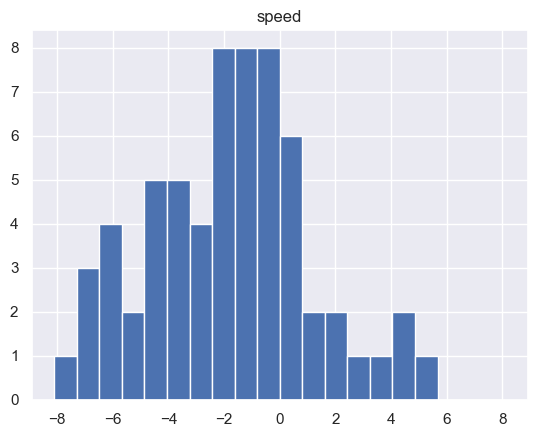


    ttime:
        lower: -138.83286061833667
        upper: 235.8542119609231
        mean:  65.84696104935655
    


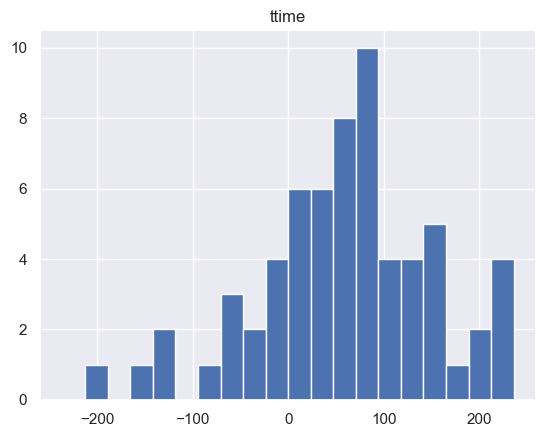


    dtime:
        lower: -151.97960400566834
        upper: 227.00221016876344
        mean:  52.91401104348266
    


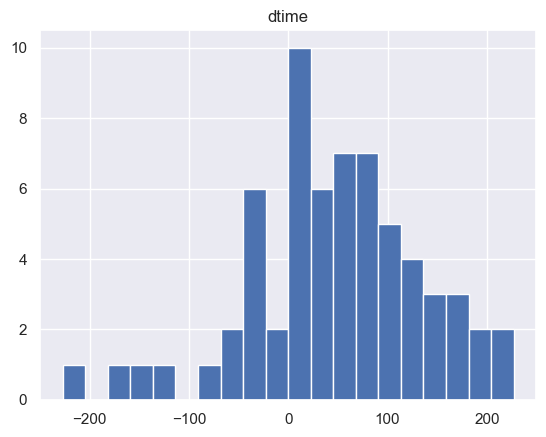


    mean_dist:
        lower: -0.4983866707310046
        upper: 0.9629678000497706
        mean:  0.1812043015622579
    


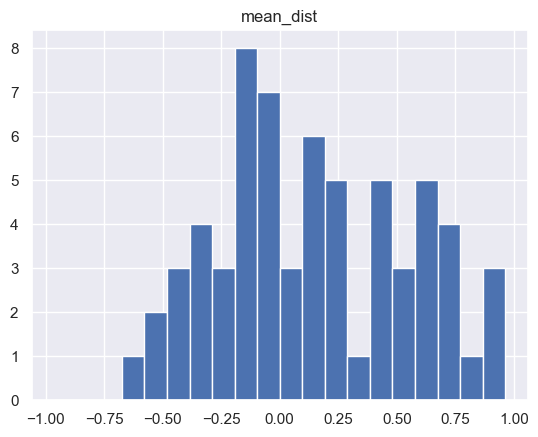

In [ ]:
outlier_cutoff = 0.025

for k in ['speed', 'ttime', 'dtime', 'mean_dist']:
    lower = centroid_means[k + '_diff_inv'].quantile(outlier_cutoff)
    upper = centroid_means[k + '_diff_inv'].quantile(1 - outlier_cutoff)
    mean = centroid_means[k + '_diff_inv'].mean()
    graph_bound = max(abs(lower), abs(upper))
    print(f'''
    {k}:
        lower: {lower}
        upper: {upper}
        mean:  {mean}
    ''')
    centroid_means[k + '_diff_inv'].hist(range=[-graph_bound,graph_bound], bins=20)
    plt.title(k)
    plt.show()

Plots

In [ ]:
mostly_vs_fully_todo = {
    'speed': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km/h), mostly coordinated - fully coordinated', -6, 6)],
    'ttime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -125, 125)], 
    'dtime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -50, 50)], 
    'mean_dist': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km), mostly coordinated - fully coordinated', -0.5, 0.5)]
}

fully_vs_fully_todo = {
    'speed': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km/h), fully coordinated - fully coordinated', -9, 9)],
    'ttime': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), fully coordinated - fully coordinated', -145, 145)], 
    'dtime': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), fully coordinated - fully coordinated', -111, 111)], 
    'mean_dist': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km), fully coordinated - fully coordinated', -0.66, 0.66)]
}

mostly_vs_fully_200_todo = {
    'speed': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km/h), mostly coordinated - fully coordinated', -8, 8)],
    'ttime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -286, 286)], 
    'dtime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -275, 275)], 
    'mean_dist': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km), mostly coordinated - fully coordinated', -1, 1)]
}

### CHANGE THIS

In [ ]:
todo = mostly_vs_fully_200_todo

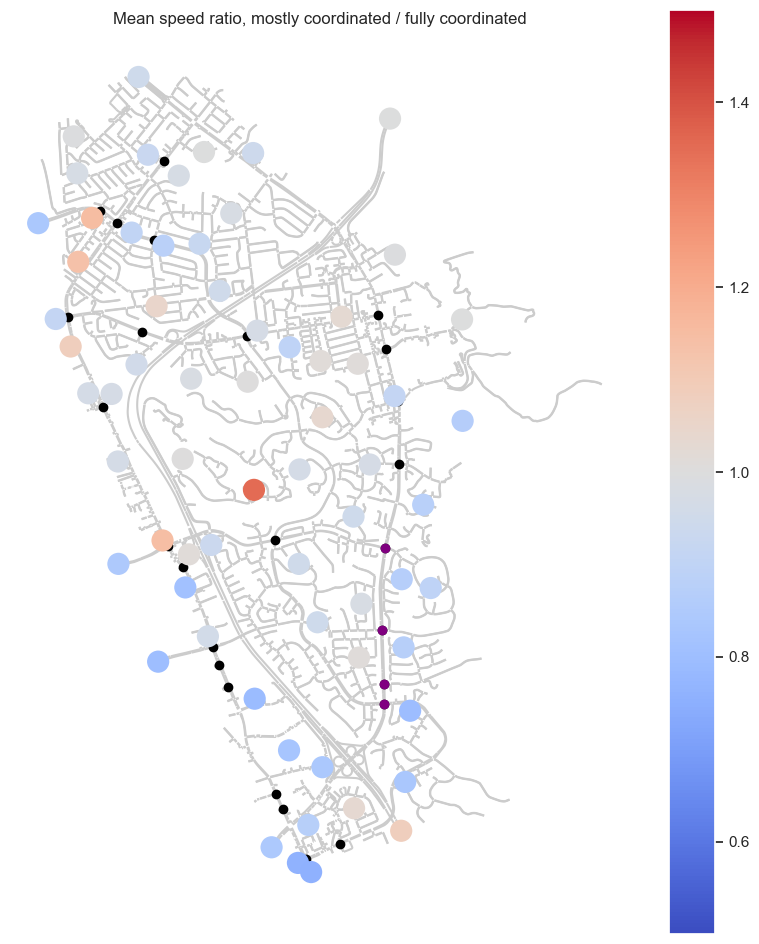

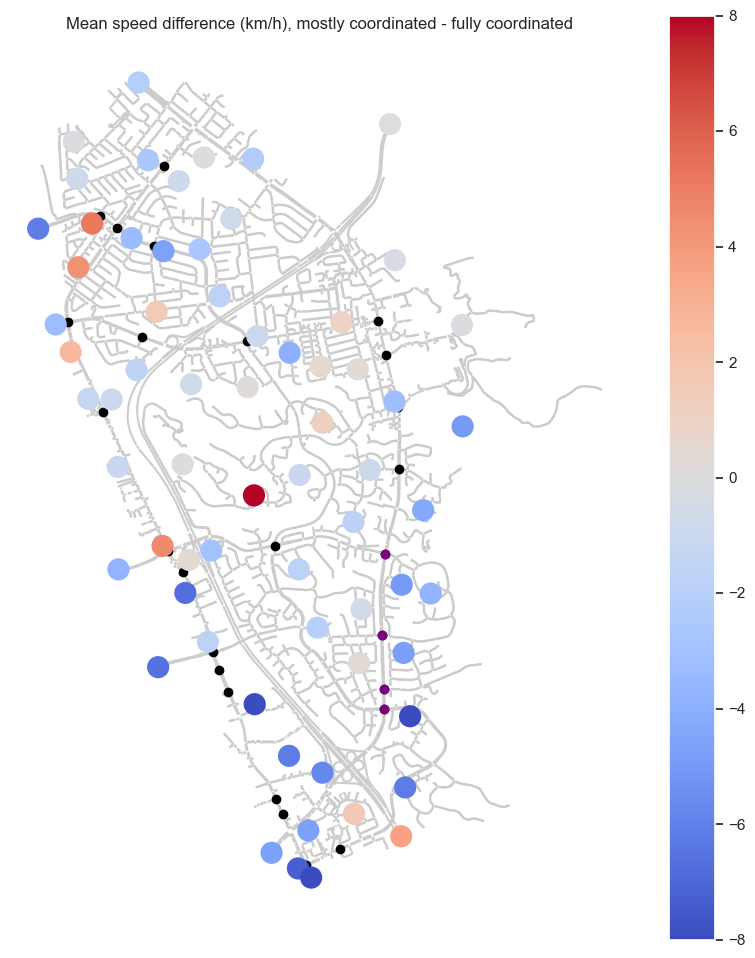

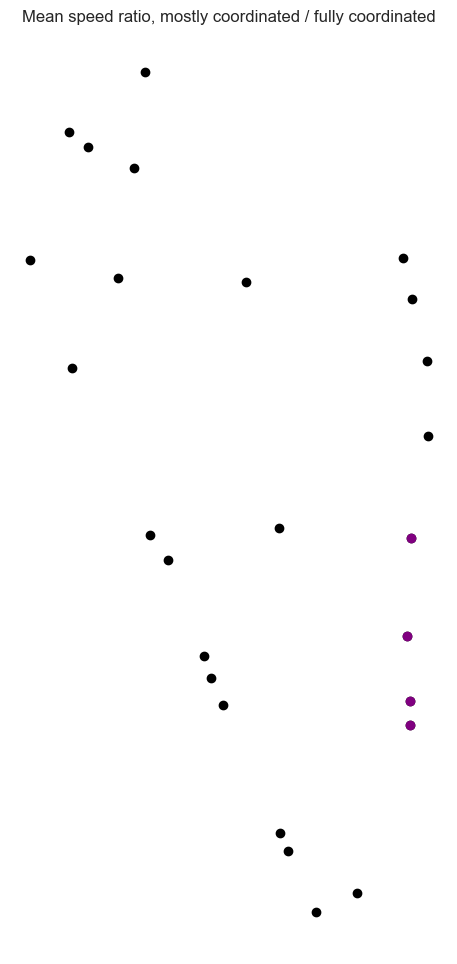

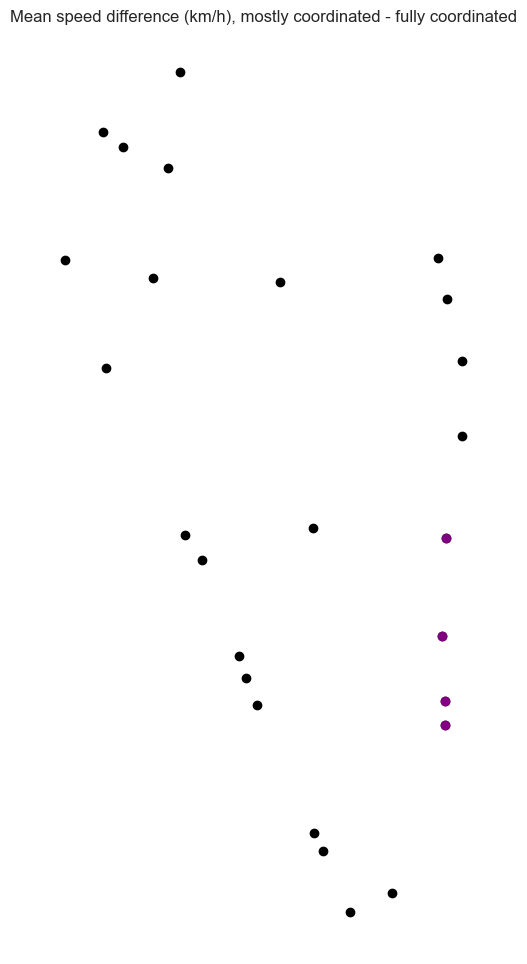

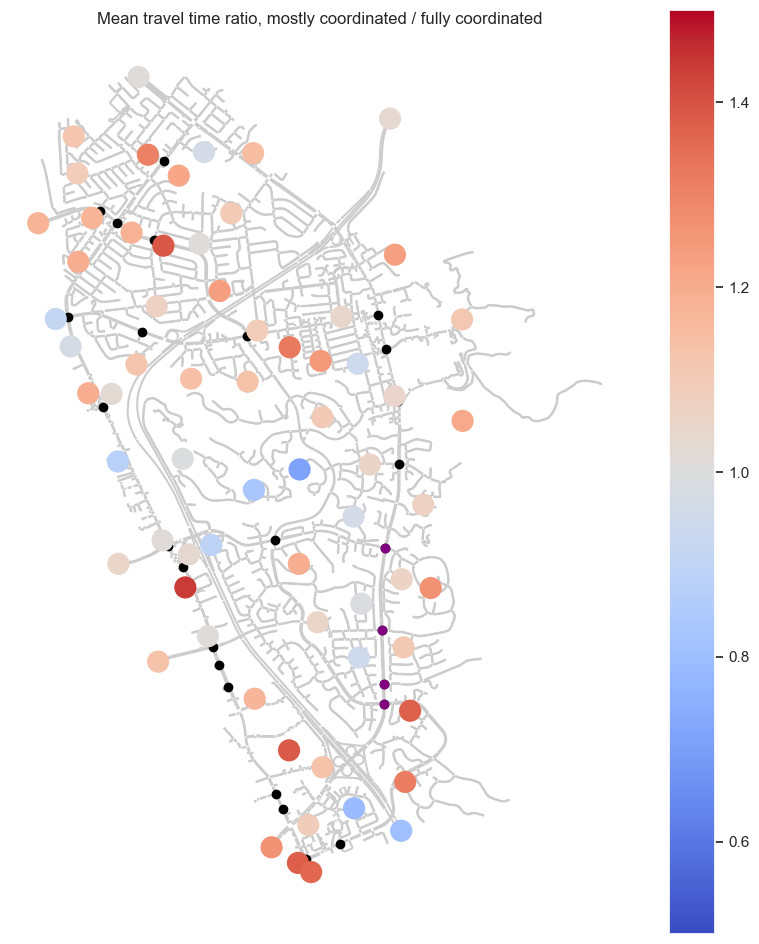

...

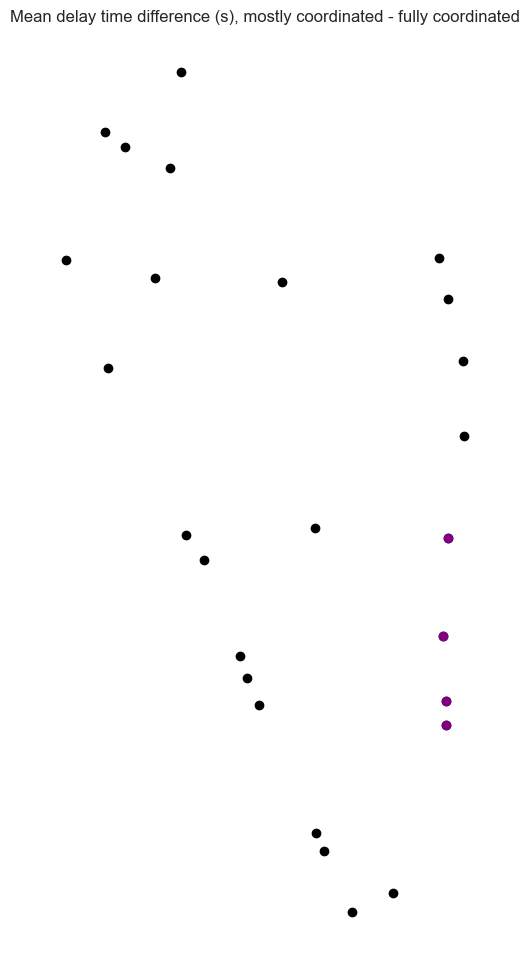

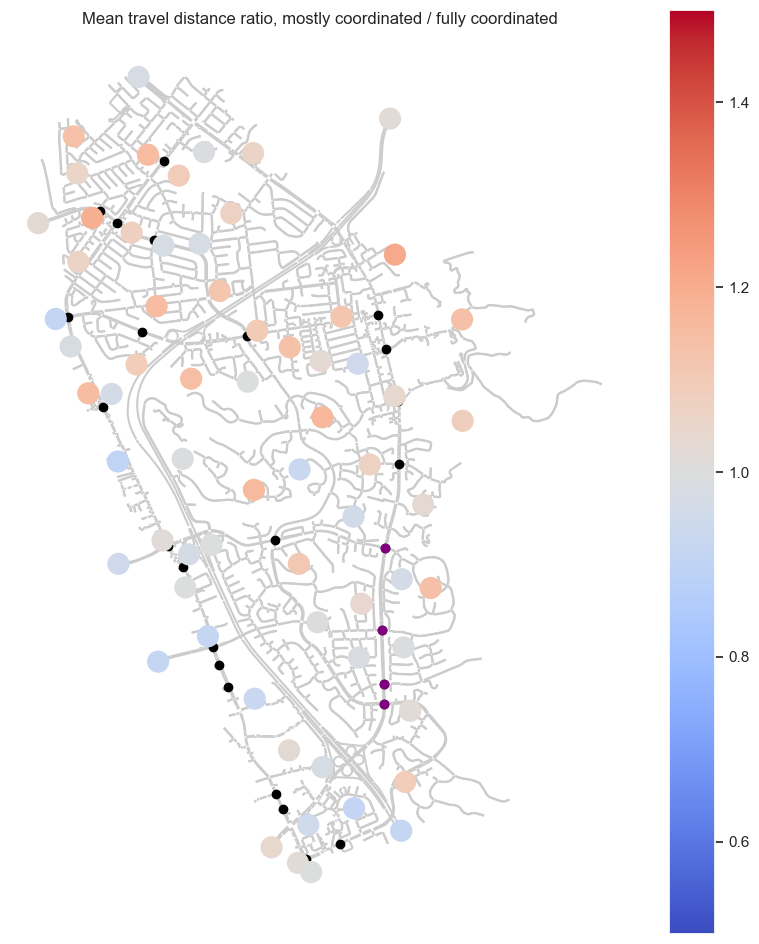

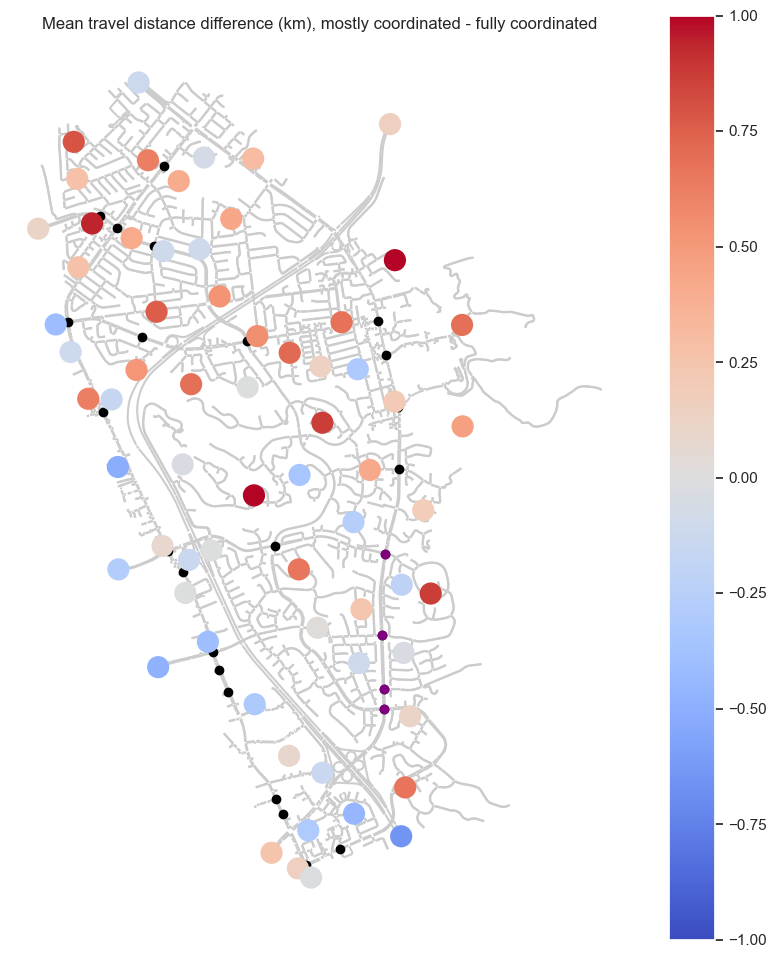

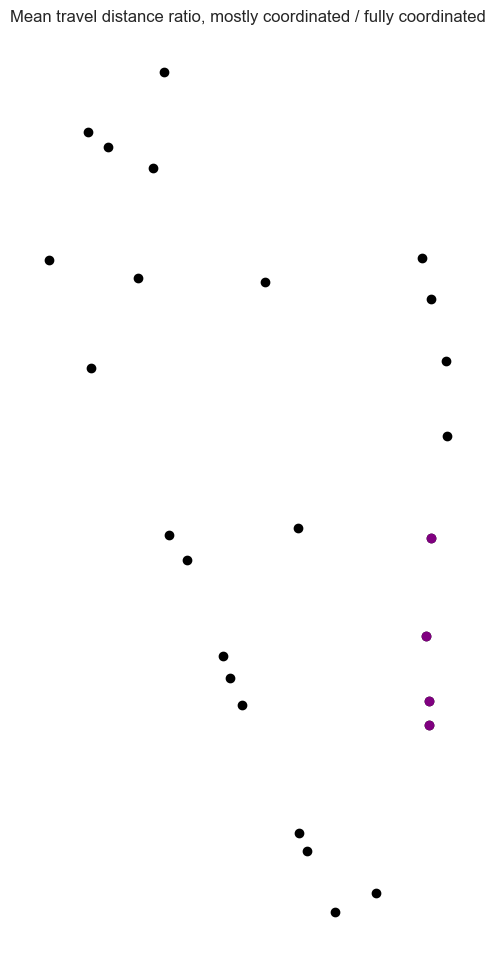

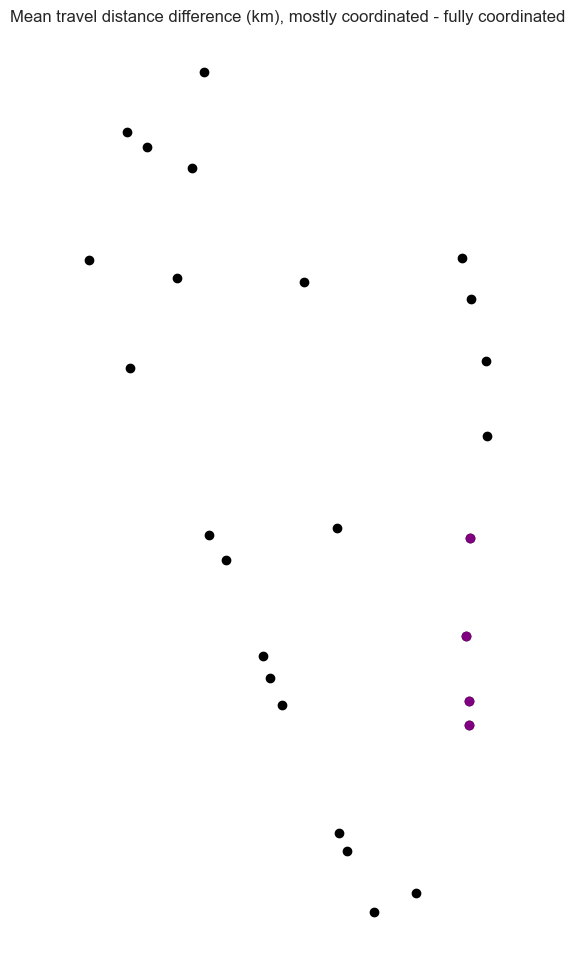

In [ ]:
plt.rc('font', size=40)

for metric_name in todo.keys():
    for shade_regions in [False, True]:
        metric = od_columns[metric_name]
        for suffix, desc, vmin, vmax in todo[metric_name]:
            fig, ax = plt.subplots(1, 1, figsize=(10, 12))
            ax.axis('off')
            node_geo_city.plot(ax=ax, lw=1, color='black', zorder=1)
            affected_nodes.plot(ax=ax, lw=1, color='purple', zorder=3)
            if shade_regions:
                pass
                # sections.plot(ax=ax, color='0.55', zorder=0)
                # centroid_means_regions.plot(ax=ax, column=metric_name + suffix, legend=True, cmap='coolwarm', lw=2, vmin=vmin, vmax=vmax, zorder=-1)
            else:
                sections.plot(ax=ax, color='0.8', zorder=0)
                centroid_means.plot(ax=ax, column=metric_name + suffix, legend=True, cmap='coolwarm', lw=10, vmin=vmin, vmax=vmax, zorder=2)
            
            plt.rcParams.update({'font.size': 40})
            plt.title(f'{metric.desc} {desc}', wrap=True)
            plt.savefig(f'{image_path}/{metric_name + suffix}' + ('_taz' if shade_regions else '') + '.png',
                bbox_inches='tight', pad_inches=0)
            plt.show()

<AxesSubplot:>

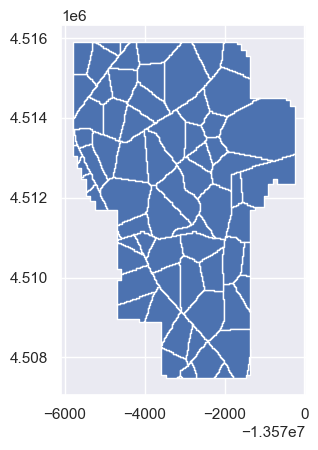

In [ ]:
taz_int.plot()

<a id='trajectory'></a>
# Trajectories

In [ ]:
uncoordinated_trajectory_query = pd.read_sql('SELECT * FROM MIVEHTRAJECTORY', uncoordinated_con)
uncoordinated_trajectory_df = pd.DataFrame(uncoordinated_trajectory_query)

uncoordinated_trajectory_df.head()

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,31,151590242,151635718,151635742,0,4.08345,4.08345,360.448,0.0,38.10570,9088.80,None
1,151642198,40,151590242,151635727,151635742,0,5.63625,8.52093,329.312,0.0,6.78788,8483.91,None
2,151642198,55,151590242,151635742,151635727,0,7.77495,7.77495,321.093,0.0,26.91310,8646.59,None
3,151642198,58,151590242,151635727,151635742,0,8.19979,9.78996,322.449,0.0,27.95510,8500.20,None
4,151642198,80,151590242,151635742,151635733,0,10.04300,11.20000,270.806,0.0,27.56040,6119.99,None


In [ ]:
uncoordinated_trajectory_df

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,31,151590242,151635718,151635742,0,4.08345,4.08345,360.448,0.0,38.10570,9088.80,None
1,151642198,40,151590242,151635727,151635742,0,5.63625,8.52093,329.312,0.0,6.78788,8483.91,None
2,151642198,55,151590242,151635742,151635727,0,7.77495,7.77495,321.093,0.0,26.91310,8646.59,None
3,151642198,58,151590242,151635727,151635742,0,8.19979,9.78996,322.449,0.0,27.95510,8500.20,None
4,151642198,80,151590242,151635742,151635733,0,10.04300,11.20000,270.806,0.0,27.56040,6119.99,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2154,151642198,93668,151590242,151635727,151635742,0,10578.50000,16928.80000,20821.400,0.0,3634.97000,8490.55,None
2155,151642198,93886,151590242,151635727,151635742,0,10599.50000,16990.70000,21118.700,0.0,3877.66000,8500.08,None
2156,151642198,93888,151590242,151635727,151635718,0,10599.60000,16992.60000,21214.000,0.0,3943.40000,8496.61,None
2157,151642198,93972,151590242,151635727,151635742,0,10607.60000,17022.00000,21346.700,0.0,4050.65000,8497.04,None


In [ ]:
uncoordinated_detailed_trajectory_query = pd.read_sql('SELECT * FROM MIVEHDETAILEDTRAJECTORY', uncoordinated_con)
uncoordinated_detailed_trajectory_df = pd.DataFrame(uncoordinated_detailed_trajectory_query)

uncoordinated_detailed_trajectory_df.head()

DatabaseError: Execution failed on sql 'SELECT * FROM MIVEHDETAILEDTRAJECTORY': no such table: MIVEHDETAILEDTRAJECTORY

In [ ]:
uncoordinated_trajectory_df.head()

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.43640,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.713,0.0,6.19638,8641.66,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,331.451,0.0,3.21501,8656.73,None


In [ ]:
coordinated_trajectory_query = pd.read_sql('SELECT * FROM MIVEHTRAJECTORY', coordinated_con)
coordinated_trajectory_df = pd.DataFrame(coordinated_trajectory_query)

coordinated_trajectory_df.head()

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.448,0.0,1.42955,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.264,0.0,5.69052,8629.10,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,337.770,0.0,9.37387,8658.64,None


In [ ]:
coordinated_detailed_trajectory_query = pd.read_sql('SELECT * FROM MIVEHDETAILEDTRAJECTORY', coordinated_con)
coordinated_detailed_trajectory_df = pd.DataFrame(coordinated_detailed_trajectory_query)

coordinated_detailed_trajectory_df.head()

,did,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance,acceleration
0,151642198,29,1,3400,1,595671.15,4149769.75,7.08379,105.59,3.41,0.0
1,151642198,29,2,3400,1,595660.26,4149790.54,7.20000,105.59,26.87,0.0
2,151642198,29,3,3400,1,595649.38,4149811.32,8.00000,105.59,50.34,0.0
3,151642198,29,4,3400,1,595638.5,4149832.11,8.80000,105.59,73.8,0.0
4,151642198,29,5,2752,1,595629.09,4149852.68,9.60000,105.59,97.26,0.0


In [ ]:
def od_demand(df):
    return df.groupby(['origin', 'destination']).size().reset_index(name='freq').sort_values(by='freq', ascending=False)

od_demand(uncoordinated_trajectory_df)

,origin,destination,freq
8,151635727,151635742,993
15,151635742,151635727,790
13,151635742,151635718,452
1,151635718,151635742,354
4,151635727,151635718,118
0,151635718,151635727,105
17,151635742,151635733,69
3,151635721,151635742,62
10,151635730,151635742,42
12,151635733,151635742,37


In [ ]:
od_demand(coordinated_trajectory_df)

,origin,destination,freq
8,151635727,151635742,993
15,151635742,151635727,791
13,151635742,151635718,438
1,151635718,151635742,360
4,151635727,151635718,119
0,151635718,151635727,112
17,151635742,151635733,70
3,151635721,151635742,63
10,151635730,151635742,50
12,151635733,151635742,33


In [ ]:
od_df[od_df['oid']==151635727]['eid_x'].unique()[0]

'ext_4'

In [ ]:
dfs_traj = {
    'uncoordinated': uncoordinated_detailed_trajectory_df.merge(uncoordinated_trajectory_df, how='left', on='oid'),
    'coordinated': coordinated_detailed_trajectory_df.merge(coordinated_trajectory_df, how='left', on='oid')
}

top_pairs_oid = [
    (151635727, 151635742),
    (151635742, 151635727),
    (151635742, 151635718),
    (151635718, 151635742),
    (151635727, 151635718),
    (151635718, 151635727),
]

dfs_traj_top = {}

def astype_per_column(df, columns, dtype):
    for col in columns:
        df[col] = df[col].astype(dtype)

for k in dfs_traj:
    for p in top_pairs_oid:
        o_oid, d_oid = p
        o_eid = od_df[od_df['oid']==o_oid]['eid_x'].unique()[0]
        d_eid = od_df[od_df['oid']==d_oid]['eid_x'].unique()[0]
        key = f'{o_eid}_{d_eid}_{k}'
        dfs_traj_top[key] = dfs_traj[k][(dfs_traj[k]['origin']==o_oid) & (dfs_traj[k]['destination']==d_oid)]
        astype_per_column(dfs_traj_top[key], ['xCoord', 'yCoord'], float)

dfs_traj_top['ext_4_ext_9_uncoordinated'].head()


C:\Users\prest\AppData\Local\Temp\ipykernel_22852\3593673711.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype(dtype)


,did_x,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance_x,...,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance_y,pathType
136,151642198,31,1,3400,3,595659.46,4149779.13,7.37098,98.09,17.14,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None
137,151642198,31,2,3400,3,595649.35,4149798.44,8.00000,98.09,38.94,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None
138,151642198,31,3,3400,3,595639.24,4149817.75,8.80000,98.09,60.73,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None
139,151642198,31,4,3400,3,595629.13,4149837.07,9.60000,98.12,82.54,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None
140,151642198,31,5,2752,4,595617.68,4149854.48,10.40000,98.09,104.34,...,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None


In [ ]:
for k, df in dfs_traj_top.items():
    dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)
    print(dfs_traj_top[k].head())

# dfs_traj_top['ext_4_ext_9_uncoordinated'].head()

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
136  151642198   31    1       3400          3  595659.46  4149779.13   
137  151642198   31    2       3400          3  595649.35  4149798.44   
138  151642198   31    3       3400          3  595639.24  4149817.75   
139  151642198   31    4       3400          3  595629.13  4149837.07   
140  151642198   31    5       2752          4  595617.68  4149854.48   

     stationaryTime  speed travelledDistance_x  ... destination  \
136         7.37098  98.09               17.14  ...   151635742   
137         8.00000  98.09               38.94  ...   151635742   
138         8.80000  98.09               60.73  ...   151635742   
139         9.60000  98.12               82.54  ...   151635742   
140        10.40000  98.09              104.34  ...   151635742   

     entranceSection  generationTime  entranceTime  exitTime  \
136                0         6.40615       7.37098   272.465   
137                0         6

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
603  151642198   56    1  151597045          3  595480.40  4156431.96   
604  151642198   56    2  151597045          3  595473.64  4156415.28   
605  151642198   56    3       2873          3  595466.41  4156398.18   
606  151642198   56    4       2873          3  595459.66  4156380.40   
607  151642198   56    5       2873          3  595452.66  4156362.26   

     stationaryTime  speed travelledDistance_x  ... destination  \
603         9.94191  81.58               10.38  ...   151635727   
604        10.40000  80.38               28.38  ...   151635727   
605        11.20000  83.59               46.95  ...   151635727   
606        12.00000  85.58               65.97  ...   151635727   
607        12.80000  87.51               85.42  ...   151635727   

     entranceSection  generationTime  entranceTime  exitTime  \
603                0         9.94191       9.94191   294.713   
604                0         9

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
7688  151642198  617    1  151597045          2  595473.45  4156422.79   
7689  151642198  617    2  151597051          0  595464.12  4156400.62   
7690  151642198  617    3       2873          2  595455.58  4156378.18   
7691  151642198  617    4       2873          2  595447.00  4156355.73   
7692  151642198  617    5       2873          2  595439.37  4156332.94   

      stationaryTime   speed travelledDistance_x  ... destination  \
7688         158.487  108.46               21.49  ...   151635718   
7689         159.200  108.06               45.55  ...   151635718   
7690         160.000  108.06               69.56  ...   151635718   
7691         160.800  108.14               93.59  ...   151635718   
7692         161.600  108.21              117.64  ...   151635718   

      entranceSection  generationTime  entranceTime  exitTime  \
7688                0         158.487       158.487   512.439   
7689      

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
1738  151642198   87    1      30451          2  594493.95  4149597.27   
1739  151642198   87    2      30451          2  594504.12  4149612.15   
1740  151642198   87    3      41482          0  594514.28  4149627.04   
1741  151642198   87    4      31086          2  594525.00  4149641.52   
1742  151642198   87    5      31086          2  594535.86  4149655.75   

      stationaryTime  speed travelledDistance_x  ... destination  \
1738         20.7088  81.12                2.05  ...   151635742   
1739         20.8000  81.12               20.08  ...   151635742   
1740         21.6000  81.12               38.11  ...   151635742   
1741         22.4000  81.12               56.13  ...   151635742   
1742         23.2000   80.0               74.03  ...   151635742   

      entranceSection  generationTime  entranceTime  exitTime  \
1738                0         20.7088       20.7088   412.261   
1739            

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


       did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
0  151642198   29    1       3400          1  595671.15  4149769.75   
1  151642198   29    2       3400          1  595660.26  4149790.54   
2  151642198   29    3       3400          1  595649.38  4149811.32   
3  151642198   29    4       3400          1  595638.50  4149832.11   
4  151642198   29    5       2752          1  595629.09  4149852.68   

   stationaryTime   speed travelledDistance_x  ... destination  \
0         7.08379  105.59                3.41  ...   151635718   
1         7.20000  105.59               26.87  ...   151635718   
2         8.00000  105.59               50.34  ...   151635718   
3         8.80000  105.59                73.8  ...   151635718   
4         9.60000  105.59               97.26  ...   151635718   

   entranceSection  generationTime  entranceTime  exitTime  \
0                0         6.10353       7.08379   113.863   
1                0         6.10353       7.08379   1

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


           did_x   oid  ent  sectionId  laneIndex     xCoord      yCoord  \
17536  151642198  1148    1      30451          2  594496.10  4149600.43   
17537  151642198  1148    2      30451          1  594507.69  4149612.07   
17538  151642198  1148    3      41482          0  594516.80  4149625.41   
17539  151642198  1148    4      31086          1  594526.39  4149638.39   
17540  151642198  1148    5      31086          1  594536.11  4149651.14   

       stationaryTime  speed travelledDistance_x  ... destination  \
17536         285.309  72.67                5.88  ...   151635727   
17537         285.600  72.67               22.03  ...   151635727   
17538         286.400  72.67               38.18  ...   151635727   
17539         287.200  72.67               54.33  ...   151635727   
17540         288.000  71.67               70.36  ...   151635727   

       entranceSection  generationTime  entranceTime  exitTime  \
17536                0         285.309       285.309   367.131

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
136  151642198   31    1       3400          3  595659.46  4149779.13   
137  151642198   31    2       3400          3  595649.35  4149798.44   
138  151642198   31    3       3400          3  595639.24  4149817.75   
139  151642198   31    4       3400          3  595629.13  4149837.07   
140  151642198   31    5       2752          4  595617.68  4149854.48   

     stationaryTime  speed travelledDistance_x  ... destination  \
136         7.37098  98.09               17.14  ...   151635742   
137         8.00000  98.09               38.94  ...   151635742   
138         8.80000  98.09               60.73  ...   151635742   
139         9.60000  98.12               82.54  ...   151635742   
140        10.40000  98.09              104.34  ...   151635742   

     entranceSection  generationTime  entranceTime  exitTime  \
136                0         6.40615       7.37098   272.448   
137                0         6

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
603  151642198   56    1  151597045          3  595480.40  4156431.96   
604  151642198   56    2  151597045          3  595473.64  4156415.28   
605  151642198   56    3       2873          3  595466.41  4156398.18   
606  151642198   56    4       2873          3  595459.66  4156380.40   
607  151642198   56    5       2873          3  595452.66  4156362.26   

     stationaryTime  speed travelledDistance_x  ... destination  \
603         9.94191  81.58               10.38  ...   151635727   
604        10.40000  80.38               28.38  ...   151635727   
605        11.20000  83.59               46.95  ...   151635727   
606        12.00000  85.58               65.97  ...   151635727   
607        12.80000  87.51               85.42  ...   151635727   

     entranceSection  generationTime  entranceTime  exitTime  \
603                0         9.94191       9.94191   294.264   
604                0         9

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
8057  151642198  617    1  151597045          2  595473.45  4156422.79   
8058  151642198  617    2  151597051          0  595464.12  4156400.62   
8059  151642198  617    3       2873          2  595455.58  4156378.18   
8060  151642198  617    4       2873          2  595447.00  4156355.73   
8061  151642198  617    5       2873          2  595439.37  4156332.94   

      stationaryTime   speed travelledDistance_x  ... destination  \
8057         158.487  108.46               21.49  ...   151635718   
8058         159.200  108.06               45.55  ...   151635718   
8059         160.000  108.06               69.56  ...   151635718   
8060         160.800  108.14               93.59  ...   151635718   
8061         161.600  108.21              117.64  ...   151635718   

      entranceSection  generationTime  entranceTime  exitTime  \
8057                0         158.487       158.487   518.513   
8058      

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
1742  151642198   87    1      30451          2  594493.95  4149597.27   
1743  151642198   87    2      30451          2  594504.12  4149612.15   
1744  151642198   87    3      41482          0  594514.28  4149627.04   
1745  151642198   87    4      31086          2  594525.00  4149641.52   
1746  151642198   87    5      31086          2  594535.86  4149655.75   

      stationaryTime  speed travelledDistance_x  ... destination  \
1742         20.7088  81.12                2.05  ...   151635742   
1743         20.8000  81.12               20.08  ...   151635742   
1744         21.6000  81.12               38.11  ...   151635742   
1745         22.4000  81.12               56.13  ...   151635742   
1746         23.2000   80.0               74.03  ...   151635742   

      entranceSection  generationTime  entranceTime  exitTime  \
1742                0         20.7088       20.7088   403.742   
1743            

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


       did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
0  151642198   29    1       3400          1  595671.15  4149769.75   
1  151642198   29    2       3400          1  595660.26  4149790.54   
2  151642198   29    3       3400          1  595649.38  4149811.32   
3  151642198   29    4       3400          1  595638.50  4149832.11   
4  151642198   29    5       2752          1  595629.09  4149852.68   

   stationaryTime   speed travelledDistance_x  ... destination  \
0         7.08379  105.59                3.41  ...   151635718   
1         7.20000  105.59               26.87  ...   151635718   
2         8.00000  105.59               50.34  ...   151635718   
3         8.80000  105.59                73.8  ...   151635718   
4         9.60000  105.59               97.26  ...   151635718   

   entranceSection  generationTime  entranceTime  exitTime  \
0                0         6.10353       7.08379   113.863   
1                0         6.10353       7.08379   1

C:\Users\prest\AppData\Local\Temp\ipykernel_22852\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


In [ ]:
bruh = gpd.GeoDataFrame(dfs_traj_top['ext_4_ext_9_uncoordinated'], geometry='geometry')
bruh.crs = "EPSG:32610"
bruh.head()

,did_x,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance_x,...,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance_y,pathType,geometry
136,151642198,31,1,3400,3,595659.46,4149779.13,7.37098,98.09,17.14,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595659.460 4149779.130)
137,151642198,31,2,3400,3,595649.35,4149798.44,8.00000,98.09,38.94,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595649.350 4149798.440)
138,151642198,31,3,3400,3,595639.24,4149817.75,8.80000,98.09,60.73,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595639.240 4149817.750)
139,151642198,31,4,3400,3,595629.13,4149837.07,9.60000,98.12,82.54,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595629.130 4149837.070)
140,151642198,31,5,2752,4,595617.68,4149854.48,10.40000,98.09,104.34,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595617.680 4149854.480)


In [ ]:
bruh.to_crs('EPSG:3857')

,did_x,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance_x,...,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance_y,pathType,geometry
136,151642198,31,1,3400,3,595659.46,4149779.13,7.37098,98.09,17.14,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571840.702 4507625.053)
137,151642198,31,2,3400,3,595649.35,4149798.44,8.00000,98.09,38.94,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571853.151 4507649.614)
138,151642198,31,3,3400,3,595639.24,4149817.75,8.80000,98.09,60.73,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571865.600 4507674.176)
139,151642198,31,4,3400,3,595629.13,4149837.07,9.60000,98.12,82.54,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571878.049 4507698.751)
140,151642198,31,5,2752,4,595617.68,4149854.48,10.40000,98.09,104.34,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571892.213 4507720.930)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1823715,151642198,91280,369,2879,1,595459.27,4156316.74,21536.00000,96.51,8403.63,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571998.184 4515897.083)
1823716,151642198,91280,370,2879,1,595465.49,4156337.26,21536.80000,96.49,8425.08,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571990.049 4515922.957)
1823717,151642198,91280,371,2879,1,595472.99,4156357.34,21537.60000,96.48,8446.52,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571980.308 4515948.256)
1823718,151642198,91280,372,2879,1,595480.93,4156377.72,21538.40000,98.41,8468.39,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571970.008 4515973.929)


In [ ]:
node_data = od_df[['eid_x', 'geometry_o']].copy()
node_data = gpd.GeoDataFrame(node_data, geometry='geometry_o')
node_data = node_data.to_crs('EPSG:3857').drop_duplicates()
node_data

,eid_x,geometry_o
0,int_0,POINT (-13573642.679 4512924.678)
20,int_1,POINT (-13575676.027 4515411.360)
42,int_2,POINT (-13571804.021 4510567.669)
48,int_3,POINT (-13571083.898 4513667.978)
63,int_4,POINT (-13574729.704 4513825.353)
...,...,...
1698,ext_4,POINT (-13571810.274 4507565.394)
5472,ext_7,POINT (-13576142.758 4514816.830)
5480,ext_8,POINT (-13574944.926 4516561.766)
5500,ext_10,POINT (-13575933.355 4513673.488)


NameError: name 'frame' is not defined

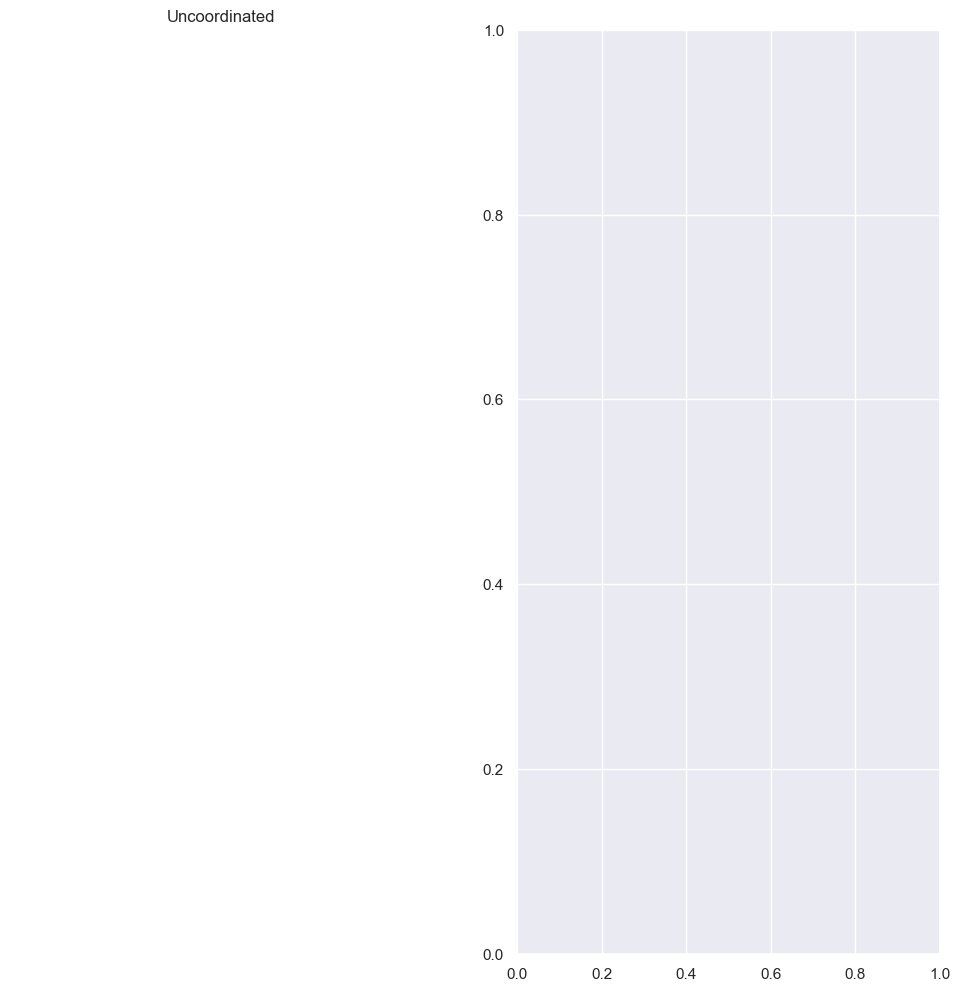

In [ ]:
class ODPlot:
    def __init__(self, origin, destination, sample_every_nth, alpha):
        self.origin = origin
        self.destination = destination
        self.sample_every_nth = sample_every_nth
        self.alpha = alpha
    
    def __repr__(self):
        return f'{self.origin}_{self.destination}'

popular_ods = [
    ODPlot('ext_4', 'ext_9', 10, 0.5),
    ODPlot('ext_9', 'ext_4', 30, 0.4),
    ODPlot('ext_9', 'ext_1', 60, 0.2),
    ODPlot('ext_1', 'ext_9', 50, 0.1),
    ODPlot('ext_4', 'ext_1', 15, 0.3),
    ODPlot('ext_1', 'ext_4', 15, 0.5)
]

def plot_routes(data, ax, type, od):
    ax.set_title(type)
    ax.axis('off')
    data = gpd.GeoDataFrame(data, geometry='geometry').iloc[::od.sample_every_nth, :]
    data.crs = "EPSG:32610"
    data = data.to_crs('EPSG:3857')
    origin = node_data[node_data['eid_x']==od.origin]
    destination = node_data[node_data['eid_x']==od.destination]['geometry_o']

    frame.plot(ax=ax, color='0.8', zorder=0)
    data.plot(ax=ax, lw=1, alpha=od.alpha, zorder=1)
    origin.plot(ax=ax, color='black', lw=3, zorder=2)
    destination.plot(ax=ax, color='red', lw=3, zorder=2)


for i in range(6):
    od = popular_ods[i]
    fig, axs = plt.subplots(1, 2, figsize=(12, 12), squeeze=False)
    plot_routes(dfs_traj_top[f'{str(od)}_uncoordinated'], axs[0][0], uncoordinated_description, od)
    plot_routes(dfs_traj_top[f'{str(od)}_coordinated'], axs[0][1], coordinated_description, od)
    fig.suptitle(f'Routes {od}')
    plt.subplots_adjust(wspace=0)
    plt.savefig(f'{image_path}/routes_{od}.png',
        bbox_inches='tight', pad_inches=0)
    plt.show()


In [ ]:
# fig, axs = plt.subplots(2, 3, figsize=(16, 18))
# fig.suptitle('Routes')
# for i in range(6):
#     ax = axs[i//3][i%3]
#     ax.axis('off')
#         node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)

# plt.subplots_adjust(wspace=0, hspace=0.1)
# plt.show()

# Emissions

In [ ]:
uncoordinated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', uncoordinated_con)
uncoordinated_emissions_df = pd.DataFrame(uncoordinated_emissions_query)

uncoordinated_emissions_df.head()

In [ ]:
coordinated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', coordinated_con)
coordinated_emissions_df = pd.DataFrame(coordinated_emissions_query)

coordinated_emissions_df.head()

In [ ]:
uncoordinated_emissions_df

In [ ]:
dfs_emissions = {'uncoordinated': uncoordinated_emissions_df, 'coordinated': coordinated_emissions_df}
emissions_columns = {
    'CO2': Column('CO2', 'Carbon Dioxide Emissions', 'g'),
    'NOx': Column('NOx', 'Carbon Dioxide Emissions', 'g'),
    'VOC': Column('VOC', 'Carbon Dioxide Emissions', 'g'),
    'PM': Column('PM', 'Carbon Dioxide Emissions', 'g'),
    'CO2_Interurban': Column('CO2_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'NOx_Interurban': Column('NOx_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'VOC_Interurban': Column('VOC_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'PM_Interurban': Column('PM_Interurban', 'Carbon Dioxide Emissions', 'g/km')
}
emissions_column_names = list(emissions_columns.keys())

def preprocess_emissions(df):
    df = df[(df['sid']==0) & (df['ent']!=0)][emissions_column_names + ['ent']]
    return df

for k, df in dfs_emissions.items():
    dfs_emissions[k] = preprocess_emissions(df)

dfs_emissions['uncoordinated']

In [ ]:
dfs_emissions['coordinated']

In [ ]:
emissions_df = dfs_emissions['uncoordinated'][emissions_column_names].join(
    dfs_emissions['coordinated'][emissions_column_names], lsuffix='_uncoordinated', rsuffix='_coordinated')

for metric_name in emissions_column_names:
    emissions_df[f'{metric_name}_ratio'] = emissions_df[f'{metric_name}_coordinated'] / emissions_df[f'{metric_name}_uncoordinated']

emissions_df

In [ ]:
emissions_columns = np.reshape(list(emissions_columns.values()), (2, 4)).transpose()

In [ ]:
emissions_columns

Not using all 8 because `interurban` is proportional

In [ ]:
fig, axs = plt.subplots(4, figsize=(15, 25))
fig.suptitle('System-wide emissions over time')
for i in range(4):
    # for j in range(2):
    ax, metric = axs[i], emissions_columns[i][0]
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=coordinated_description)
    ax.set_title(f'{metric.name} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(f'{metric.name} ({metric.unit})')
    ax.legend(loc="upper left")
    ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.show()

In [ ]:
# dt = 0.01
# x = np.arange(-50.0, 50.0, dt)
# y = np.arange(0, 100.0, dt)
# # plt.subplot(312)
# plt.plot(y, x)
# plt.yscale('symlog')
# plt.ylabel('symlogy')



fig = plt.figure(figsize=(10, 8))
ax = plt.axes()
plt.title('System-wide emissions over time')

for i in range(4):
    metric = emissions_columns[i][0]
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=f'{metric.name} uncoordinated')
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=f'{metric.name} coordinated')

ax.tick_params('x', labelrotation=70)
plt.legend(loc='upper right')
plt.yscale('symlog')
plt.ylabel('Emissions (g)')
plt.savefig(f'{image_path}/emissions.png',
    bbox_inches='tight', pad_inches=0)
plt.show()


# fig, axs = plt.subplots(4, figsize=(15, 25))
# fig.suptitle('System-wide emissions over time')
# for i in range(4):
#     # for j in range(2):
#     ax, metric = axs[i], emissions_columns[i][0]
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=coordinated_description)
#     ax.set_title(f'{metric.name} across the network over time')
#     ax.set_xlabel('Time')
#     ax.set_ylabel(f'{metric.name} ({metric.unit})')
#     ax.legend(loc="upper left")
#     ax.tick_params('x', labelrotation=70) 

# plt.subplots_adjust(wspace=0.3, hspace=0.5)
# plt.show()

<a id='hcm'></a>
# HCM Trajectory Analysis

* Longitudinal analysis computes for each vehicle in a link during each time step measures, cumulating them for all the time steps required to traverse the link, and then aggregating for all the vehicles that exit from the link during a statistics interval
* Spatial analysis computes for each link and for each lane during each time step measures that involve all the vehicles present, and then aggregating for all the time steps during a statistics interval

In [ ]:
uncoordinated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', uncoordinated_con)
uncoordinated_hcm_df = pd.DataFrame(uncoordinated_hcm_query)

uncoordinated_hcm_df.head()

In [ ]:
coordinated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', coordinated_con)
coordinated_hcm_df = pd.DataFrame(coordinated_hcm_query)

coordinated_hcm_df.head()

In [ ]:
dfs_hcm = {'uncoordinated': uncoordinated_hcm_df, 'coordinated': coordinated_hcm_df}
hcm_columns = {
    'density': Column('density', 'Density of vehicles', 'PCU/km'),
    'los': Column('los', 'Level of service', None),
    'queue_delay': Column('queue_delay', 'Queue delay', 's/veh'),
    'queue_length': Column('queue_length', 'Average queue length', 'veh'),
    'queued_vehicles': Column('queued_vehicles', 'Percent queued vehicles', '%'),
    'segment_delay': Column('segment_delay', 'Segment delay', 's/veh'),
    'stopped_delay': Column('stopped_delay', 'Stopped delay', 's/veh'),
    'nbstops': Column('nbstops', 'Number of stops', None),
    'slow_vehicles': Column('slow_vehicles', 'Percent slow vehicles', '%')
}
hcm_column_names = list(hcm_columns.keys())
group_cols = ['ent', 'eid']

def preprocess_hcm(df):
    for k in hcm_column_names:
        df[k] = df[k].astype(float)
    df['density'] = df['density'] * 0.621      # converting to km
    df['los'] = df['los'].astype(int)
    df = df[hcm_column_names + group_cols]
    return df[df['ent']!=0]

for k, df in dfs_hcm.items():
    dfs_hcm[k] = preprocess_hcm(df)

dfs_hcm['uncoordinated']

In [ ]:
dfs_hcm['coordinated']

Not sure why this has more rows than the originals

In [ ]:
hcm_df = dfs_hcm['uncoordinated'].merge(dfs_hcm['coordinated'], on=group_cols, how='left', suffixes=['_uncoordinated', '_coordinated']).dropna()
hcm_df

In [ ]:
hcm_compare_cols = np.reshape(hcm_column_names.copy(), (3, 3))
hcm_compare_cols

In [ ]:
fig, axs = plt.subplots(3, 3, figsize=(25, 20))
fig.suptitle('HCM over time')
for i in range(3):
    for j in range(3):
        ax, metric = axs[i][j], hcm_columns[hcm_compare_cols[i][j]]
        # if metric.name == 'los':
        #     plt.hist([hcm_df[f'{metric.name}_uncoordinated'], hcm_df[f'{metric.name}_uncoordinated']], 
        #         label=['uncoordinated', 'coordinated'])
        #     ax.legend(loc="upper left")
        # else:
        metric_data = hcm_df[['ent', f'{metric.name}_uncoordinated', f'{metric.name}_coordinated']].groupby('ent').mean()
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_coordinated'], label=coordinated_description)
        ax.set_title(f'Mean {metric.desc} across the network over time')
        ax.set_xlabel('Time')
        ax.set_ylabel(f'{metric.name} ({metric.unit})')
        ax.legend(loc="upper left")
        ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

<a id='sys-hcm-patch'></a>
# Patched sys/hcm graphs

In [ ]:
from matplotlib import rcParams as rc

categorical_labels = {
    'los': {
        1: 'A',
        2: 'B',
        3: 'C',
        4: 'D',
        5: 'E',
        6: 'F'
    }
}

def sys_line_plot(metric, data, ax):
    data_uncoordinated, data_coordinated = data
    ax.plot(TIME_INTERVALS_STRING, data_uncoordinated, label=uncoordinated_description)
    ax.plot(TIME_INTERVALS_STRING, data_coordinated, label=coordinated_description)
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_xlabel('Time', size=16)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper left')
    ax.tick_params('x', labelrotation=70)

def sys_bar_plot(metric, data, ax):
    data_uncoordinated, data_coordinated = data
    labels = [categorical_labels[metric.name][label] for label in sorted(data_uncoordinated.unique())]
    width = 0.35
    rects_uncoordinated = ax.bar(
        np.arange(len(labels)) - width/2, data_uncoordinated.value_counts().sort_index(), width, label=uncoordinated_description)
    rects_coordinated = ax.bar(
        np.arange(len(labels)) + width/2, data_coordinated.value_counts().sort_index(), width, label=coordinated_description)
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper right')


fig, axs = plt.subplots(4, 3, figsize=(25, 25))
fig.suptitle('Mean system-wide metrics over time')

sys_hcm_columns = [
    hcm_columns['density'],
    sys_columns['flow'],
    sys_columns['ttime'],
    sys_columns['speed'],
    sys_columns['fuelc'],
    sys_columns['batteryc'],
    sys_columns['travel'],
    hcm_columns['los'],
    hcm_columns['queue_delay'],
    hcm_columns['queue_length'],
    hcm_columns['queued_vehicles'],
    hcm_columns['nbstops'],
    # hcm_columns['slow_vehicles']
]

sys_hcm_columns = np.reshape(sys_hcm_columns, (4, 3))

for i in range(4):
    for j in range(3):
        ax, metric = axs[i][j], sys_hcm_columns[i][j]
        if metric.name == 'los':
            data_uncoordinated = hcm_df[f'{metric.name}_uncoordinated']
            data_coordinated = hcm_df[f'{metric.name}_coordinated']
            sys_bar_plot(metric, (data_uncoordinated, data_coordinated), ax)
        elif metric.name in hcm_columns:
            data = hcm_df[['ent', f'{metric.name}_uncoordinated', \
                f'{metric.name}_coordinated']].groupby('ent').mean()
            data_uncoordinated = data[f'{metric.name}_uncoordinated']
            data_coordinated = data[f'{metric.name}_coordinated']
            sys_line_plot(metric, (data_uncoordinated, data_coordinated), ax)
        else:
            data_uncoordinated = sys_df[f'{metric.name}_uncoordinated']
            data_coordinated = sys_df[f'{metric.name}_coordinated']
            sys_line_plot(metric, (data_uncoordinated, data_coordinated), ax)

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.savefig(f'{image_path}/sys_hcm.png',
    bbox_inches='tight', pad_inches=0)
plt.show()

<a id='rgap'></a>
# RGap

I'm not sure exactly how this works, but I'm assuming that data is collected every minute (due to 361 rows in 6 hours).

In [ ]:
uncoordinated_rgap_query = pd.read_sql('SELECT * FROM RGap', uncoordinated_con)
uncoordinated_rgap_df = pd.DataFrame(uncoordinated_rgap_query)

uncoordinated_rgap_df.head()

In [ ]:
coordinated_rgap_query = pd.read_sql('SELECT * FROM RGap', coordinated_con)
coordinated_rgap_df = pd.DataFrame(coordinated_rgap_query)

coordinated_rgap_df.head()

In [ ]:
dfs_rgap= {'uncoordinated': uncoordinated_rgap_df, 'coordinated': coordinated_rgap_df}
rgap_columns = {
    'rgapInstantaneous': Column('rgapInstantaneous', 'Instantaneous relative gap', None),
    'rgapExperienced': Column('rgapExperienced', 'Experienced relative gap', None)
}

for k, df in dfs_rgap.items():
    df = df[df['ent']!=0]
    dfs_rgap[k] = df[rgap_columns.keys()]

rgap_df = dfs_rgap['uncoordinated'].join(dfs_rgap['coordinated'], lsuffix='_uncoordinated', rsuffix='_coordinated')
rgap_df

In [ ]:
metric_name, metric_units = 'Relative gap', 's'
uncoordinated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

coordinated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    coordinated_simulation_results_database, TIME_INTERVALS)

In [ ]:
fig, axs = plt.subplots(2, figsize=(15, 12))
fig.suptitle('Relative gap over time')
for i in range(2):
    ax, metric = axs[i], rgap_columns[list(rgap_columns.keys())[i]]
    ax.plot(rgap_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
    ax.plot(rgap_df[f'{metric.name}_coordinated'], label=coordinated_description)
    ax.set_title(f'{metric.desc} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(f'{metric.name} ({metric.unit})')
    ax.legend(loc="upper left")
    # ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.savefig(f'{image_path}/rgap.png',
    bbox_inches='tight', pad_inches=0)
plt.show()


# plt.xlabel("Timestep")
# plt.ylabel(f"{metric_name} ({metric_units})")
# plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label=uncoordinated_description)
# plt.plot(TIME_INTERVALS_STRING, coordinated_simulated_metric_values, label=coordinated_description)
# plt.legend(loc="upper left")
# plt.xticks(rotation=70)
# plt.show()